# notebook 1: Exploratory Data Analysis Notebook

The notebook includes:

- Dataset overview and semantic column mapping
- Missing values and duplicates
- Univariate analysis
- Bivariate analysis against the infection target
- Multivariate analysis
- Correlation analysis
- Statistical tests
- Data leakage checks
- Raw-versus-cleaned validation



In [121]:
%matplotlib inline

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from pathlib import Path

# for statistic analysis
from scipy import stats

In [123]:
# importing the complete dataset
df_zihum = pd.read_excel(r"H:\27 project\EDA\Copy of Dataset Zihum Raw.xlsx")

ydata_profiling is here to do a review on our df. It is just a helper tool and NOT a part of the final results and analysis. 

In [124]:
# from ydata_profiling import ProfileReport 

# profile = ProfileReport(df_zihum, title = "EDA Positive Infection Report", explorative= True)
# profile.to_file("Full Dataset EDA Report.html")

# EDA

In [125]:
df = df_zihum.copy()

def build_infection_label(df, diagnosis_col="added1_infection_diagnosis", site_col="clinical_SSI_diagnosis", target_col="target_binary"):
    """Returns the complete df with a new boolian column: "Target" (0/1).
    There are rows where the 'infection' column is empty but the 'infection_site' is not and vice versa.
    We defind that a patient with a positive diagnosis is one that have at least on of these two rows that is not empty. """
    diag_present = (df[diagnosis_col].fillna("").astype(str).str.strip().ne(""))
    site_present = (df[site_col].fillna("").astype(str).str.strip().ne(""))
    df[target_col] = (diag_present | site_present).astype(int)
    return df

df = build_infection_label(df)
print("DataFrame Shape: ", df.shape)
print(df["target_binary"].value_counts(dropna=False))
df.head(5)

DataFrame Shape:  (35925, 244)
target_binary
0    35784
1      141
Name: count, dtype: int64


,activity_date,age,actual_activity,activity_cluster,admission_date,admission_weekday,admission_year,case_number,department,surgeon_code,...,added1_drain_left_in_place_clean_from_surgery,added1_drain_left_in_place_start_date,added1_drain_left_in_place_end_date,added1_imaging_test,added1_infection_diagnosis,clinical_SSI_diagnosis,description_surgical_procedure,first_evaluation_postop_in_days,description_first_evaluation_postop,target_binary
0,2023-01-01 09:07:00,52.838249,ניטור במהלך ניתוח,אורטופדיה,2022-12-31 19:43:41,Saturday,2022.0,20737308,חדר ניתוח-רמת החייל,1269786.0,...,NaN,NaT,NaT,NaN,NaN,NaN,"Upon arrival to the OR, appropriate time out p...",0.353472,בת 53 אחרי קרניוטומיה ימנית לכריתת קברנומה של ...,0
1,2023-01-01 09:10:00,48.455217,"תיקון הרניה מפשעתית, פתוח",כירורגיה כללית,2023-01-01 07:24:00,Sunday,2023.0,20737323,חדר ניתוח-רמת החייל,9919686.0,...,NaN,NaT,NaT,NaN,NaN,NaN,תקון בקע פמורלי מימין,228.224306,מהלך אשפוז ללא סיבוכים_x000D_\nמצב כללי משביע ...,0
2,2023-01-01 09:13:00,46.392296,כירו-לאפ-בקע סרעפתי,כירורגיה כללית,2023-01-01 05:59:08,Sunday,2023.0,20737310,חדר ניתוח-רמת החייל,5075488.0,...,NaN,NaT,NaT,NaN,NaN,NaN,"למטופלת הוסברו יתרונות הניתוח, הסכנות והאלטרנט...",0.316667,מרגישה טוב בדיקה תקינה_x000D_\nנקז סרודמי צלול...,0
3,2023-01-01 09:14:00,78.731559,גב-קיבוע עמוד שדרה מותני,אורטופדיה,2022-12-31 18:51:34,Saturday,2022.0,20737307,חדר ניתוח-רמת החייל,9249920.0,...,נקז מאיזור ניתוח,2023-01-01 12:00:00,2023-01-07 15:57:00,NaN,NaN,NaN,כשהחולה שוכב על בטנו בוצע חתך אורכי מרכזי בגב ...,0.11875,LBP Rt Leg Pain Rt Quad Weakness Lt Drop Foot_...,0
4,2023-01-01 09:26:00,2.657710,תיקון הרניה ילדים,כירורגיה כללית,2023-01-01 08:50:00,Sunday,2023.0,20737339,חדר ניתוח-רמת החייל,2462491.0,...,NaN,NaT,NaT,NaN,NaN,NaN,0,0,0,0


### AUTOMATIC SAVING OF EDA VISUALIZATIONS

This helper is used to automatically save every Matplotlib visualization created during the EDA into one dedicated folder.

In [ ]:
# Folder in which all EDA visualizations will be saved.
EDA_VIS_DIR = Path( r"H:\27 project\EDA\EDA_visualizations")
# Create the folder if it does not already exist.
EDA_VIS_DIR.mkdir(parents=True, exist_ok=True)

# Save the original Matplotlib show function so figures are still displayed.
_original_plt_show = plt.show
# Counter used to create unique file names.
_eda_figure_counter = 1


def _clean_filename(text):
    """
    INFO:
    Convert a figure title into a safe file name.
    Characters that are not allowed in Windows file names are replaced,
    and long names are shortened for easier file management.
    """
    text = str(text).strip()
    text = re.sub(r'[<>:"/\\|?*]', "_", text)
    text = re.sub(r"\s+", "_", text)
    return text[:100]


def save_eda_show(*args, **kwargs):
    """
    INFO:
    Save every currently open Matplotlib figure before displaying it.
    This function replaces plt.show(), so all existing plotting cells can remain unchanged.
    """

    global _eda_figure_counter

    figure_numbers = plt.get_fignums()

    for fig_num in figure_numbers:
        fig = plt.figure(fig_num)
        # Prefer the figure-level title when available.
        figure_title = ""

        if fig._suptitle is not None:
            figure_title = fig._suptitle.get_text()

        # Otherwise use the title of the first axis.
        if not figure_title and fig.axes:
            figure_title = fig.axes[0].get_title()

        # Fallback name when the figure has no title.
        if not figure_title:
            figure_title = "EDA_visualization"

        safe_title = _clean_filename(figure_title)
        file_name = (
            f"{_eda_figure_counter:03d}_"
            f"{safe_title}.png"
        )
        save_path = (EDA_VIS_DIR / file_name)
        fig.savefig(save_path, dpi=150, bbox_inches="tight")
        print(f"Saved EDA visualization: {save_path}")

        _eda_figure_counter += 1

    # Display the figures normally in Jupyter after saving.
    _original_plt_show(*args, **kwargs)

# Replace plt.show() with the automatic saving version.
plt.show = save_eda_show
print("Automatic EDA figure saving is active.")
print(f"EDA visualizations will be saved to:\n{EDA_VIS_DIR}")


Automatic EDA figure saving is active.
EDA visualizations will be saved to:
H:\27 project\EDA\EDA_visualizations


## 1- Column Classification

In [127]:
print(df.dtypes.value_counts())

object            124
float64            68
datetime64[ns]     50
int64               2
Name: count, dtype: int64


This script is mapping the columns to types- we used it once in order to have a csv with the automatic mapping:

In [128]:
# mapping_data = []

# for col in df.columns:
#     dtype_str = str(df[col].dtype)
#     unique_count = df[col].nunique(dropna=True)
#    #first guess- by logic
#     if unique_count == 2:
#         guessed_type = 'Boolean'
#     elif 'datetime' in dtype_str:
#         guessed_type = 'Datetime'
#     elif 'int' in dtype_str or 'float' in dtype_str:
#         if unique_count < 15:
#             guessed_type = 'Categorical'
#         else:
#             guessed_type = 'Numeric'
#     elif 'object' in dtype_str or 'category' in dtype_str:
#         if unique_count < 25:
#             guessed_type = 'Categorical'
#         else:
#             guessed_type = 'Text'
#     else:
#         guessed_type = 'other'
    
#     mapping_data.append({
#         'Column_name':col,
#         'pandas_dtype': dtype_str,
#         'unique_values_count': unique_count,
#         'semantic_type': guessed_type
#     })

# mapping_df = pd.DataFrame(mapping_data)
# mapping_df.to_csv(r"H:/27 project\EDA\colums.mapping.csv", index=False, encoding='utf-8-sig')


After looking manually at the mapping dataframe, we did some changes and now we create a new xlsx file with the correct dataframe of columns type in order to put the columns in lists by types.
We need to change types to some columns, from float to string (like icd9 columns)

In [129]:
#importing the final mapping df
final_mapping = pd.read_excel(r"H:\27 project\EDA\correct_mapping_columns.xlsx")

# Remove spaceses before or after column name
df.columns = df.columns.str.strip()
final_mapping["Column_name"] = final_mapping["Column_name"].str.strip()

In [130]:
# convert specific numeric columns to str- we already choose them by adding in the final_mapping df the column 'Type_to'
for index, row in final_mapping.iterrows():
    col_name = row['Column_name']
    target_type = row['Type_to']
    
    if pd.notna(target_type) and str(target_type).strip() != '':

        if target_type == 'float':
            df[col_name] = pd.to_numeric(df[col_name], errors= "coerce")
            print(f"\nThe column: {col_name} is now in float type")

        elif target_type == 'datetime':
            original_values = df[col_name].copy()

            if pd.api.types.is_datetime64_any_dtype(original_values):
                df[col_name] = original_values

            else:
                text_dates = pd.to_datetime(original_values, errors="coerce", dayfirst=True)
                numeric_values = pd.to_numeric(original_values, errors= "coerce")
                excel_dates = pd.to_datetime(numeric_values, unit="D", origin="1899-12-30", errors= "coerce")
                df[col_name] = text_dates.fillna(excel_dates)
                
            print(f"\nThe column: {col_name} is now in datetime type")
            print(f"Valid deates: {df[col_name].notna().sum()}")
            print(f"Failed convertions: "
                    f"{original_values.notna().sum() - df[col_name].notna().sum()}")

        elif target_type == 'str':
            df[col_name] = df[col_name].astype("string")
            print(f"\nThe column: {col_name} is now in string type")



The column: case_number is now in string type



The column: surgeon_code is now in string type

The column: anasthesiologist_code is now in string type

The column: diagnosis_icd9_1 is now in string type

The column: diagnosis_icd9_5 is now in string type

The column: procedure_icd9_1 is now in string type

The column: procedure_icd9_2 is now in string type

The column: procedure_icd9_3 is now in string type

The column: procedure_icd9_4 is now in string type

The column: procedure_icd9_5 is now in string type

The column: lab_na_first_value_mmol/L is now in float type

The column: urine_culture_2_date is now in datetime type
Valid deates: 40
Failed convertions: 0

The column: urine_culture_3_date is now in datetime type
Valid deates: 15
Failed convertions: 0

The column: urine_culture_4_date is now in datetime type
Valid deates: 9
Failed convertions: 0

The column: urine_culture_5_date is now in datetime type
Valid deates: 5
Failed convertions: 0

The column: urine_culture_6_date is now in datetime type
Valid deates: 2
Failed conv

C:\Users\mtal\AppData\Local\Temp\3\ipykernel_17732\2624345704.py:19: UserWarning: Parsing dates in %Y-%m-%d %H:%M:%S format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  text_dates = pd.to_datetime(original_values, errors="coerce", dayfirst=True)


In [ ]:
# creating the lists of columns by types
datetime_cols = final_mapping[final_mapping['Column_type'] == 'Datetime']['Column_name'].tolist()
numeric_cols = final_mapping[final_mapping['Column_type'] == 'Numeric']['Column_name'].tolist()
categorical_cols = final_mapping[final_mapping['Column_type'] == 'Categorical']['Column_name'].tolist()
boolean_cols = final_mapping[final_mapping['Column_type'] == 'Boolean']['Column_name'].tolist()
text_cols = final_mapping[final_mapping['Column_type'] == 'Text']['Column_name'].tolist()

print("Datetime:", len(datetime_cols))
print("Numeric:", len(numeric_cols))
print("Categorical:", len(categorical_cols))
print("Boolean:", len(boolean_cols))
print("Text:", len(text_cols))

Datetime: 51
Numeric: 50
Categorical: 66
Boolean: 35
Text: 42


In [ ]:
#Validate semantic column mapping
column_groups = {
    "Datetime": datetime_cols,
    "Numeric": numeric_cols,
    "Categorical": categorical_cols,
    "Boolean": boolean_cols,
    "Text": text_cols
}

#show the numbers of colunms in each group
for group_name, cols in column_groups.items():
    print(f"{group_name}: {len(cols)} columns")

#Check wheters the same column appears in more than one type
all_typed_columns = []

for group_name, cols in column_groups.items():
    for col in cols:
        all_typed_columns.append({
            "column": col,
            "type": group_name
        })
        
typed_df = pd.DataFrame(all_typed_columns)
duplicated_assignments = (typed_df.groupby("column")["type"].agg(list))
duplicated_assignments = duplicated_assignments[duplicated_assignments.apply(len) > 1]

if duplicated_assignments.empty:
    print("\nNo columns were assigned to more than one semantic type.")
else:
    print("\nWarning: columns assigned to multiple semantic types:")
    print(duplicated_assignments)

#Check mapping coverage
mapped_columns = set(typed_df["column"])
data_columns = set(df.columns)

unmaped_columns = sorted(data_columns - mapped_columns)
missing_from_df = sorted(mapped_columns - data_columns)

print(f"\nColumns in dataframe without semantic mapping: {len(unmaped_columns)}")
if unmaped_columns:
    print(unmaped_columns)

print(f"\nMapped columns not found in dataframe: {len(missing_from_df)}")
if missing_from_df:
    print(missing_from_df)

Datetime: 51 columns
Numeric: 50 columns
Categorical: 66 columns
Boolean: 35 columns
Text: 42 columns

No columns were assigned to more than one semantic type.

Columns in dataframe without semantic mapping: 0

Mapped columns not found in dataframe: 0


### 2- Duplicates

In [133]:
num_rows_dup = df.duplicated().sum()
percent_dup = num_rows_dup / len(df) * 100

print(f"Total duplicate rows: {num_rows_dup:,} ({percent_dup:.2f}%)")
if num_rows_dup > 0:
    print("\nSample duplicate rows:")
    print(df[df.duplicated(keep=False)].sort_values(list(df.columns)).head(10))


Total duplicate rows: 0 (0.00%)


In [134]:
# checking duplicates in the case_number column
dup_case_number = df.duplicated(subset=['case_number']).sum()
print(f"Number of duplicate cases: {dup_case_number}")

Number of duplicate cases: 0


### 3- Missing Values

In [ ]:
missing = (pd.DataFrame({
            "missing_count": df.isnull().sum(),
            "missing_percent": df.isnull().mean() * 100
            }).query("missing_count > 0").sort_values("missing_percent", ascending=False)
        )

##### Checking missing by groups

In [136]:
# define a function to categorize columns based on their names, in order to show a bar plot of missing by groups
def assign_group(col_name):
    col_name = col_name.lower()

    # Dictionary of keywords and their corresponding group names
    if 'diagnosis' in col_name or 'disease' in col_name:
        # check if its an additional/secondary diagnosis
        if any(char in col_name for char in ['2','3','4','5','6']):
            return 'Secondary diagnosis'
        else:
            return 'Primary diagnosis'
        
    elif 'procedure' in col_name:
        # check if its an additional/secondary procedure
        if any(char in col_name for char in ['2','3','4','5','6']):
            return 'Secondary procedure'
        else:
            return 'Primary procedure'
    
    elif 'preop' in col_name:
        return 'Pre-Operation'
    
    elif 'lab' in col_name:
        return 'Lab'
    
    elif 'surgery' in col_name or 'recovery' in col_name or 'icu' in col_name:
        return "Surgery and Recovery"
    
    elif 'antibiotics' in col_name or 'analgesics' in col_name or 'diuretics' in col_name or 'ppi' in col_name or 'tpn' in col_name:
        return 'Medication after 36 hours'
    
    elif 'blood_culture' in col_name:
        # check if its an additional/secondary culture
        if any(char in col_name for char in ['2','3','4','5','6']):
            return 'Secondary blood culture'
        else:
            return 'Primary blood culture'
        
    elif 'urine_culture' in col_name:
        # check if its an additional/secondary culture
        if any(char in col_name for char in ['2','3','4','5','6']):
            return 'Secondary urine culture'
        else:
            return 'Primary urine culture'
        
    elif 'wound_culture' in col_name:
        return 'Wound culture'
                
    elif 'readmission' in col_name:
        return 'Readmission'
    
    else:
        return 'Other/General'

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\001_Percentage_of_missing_values_per_feature_(filtered___5%).png


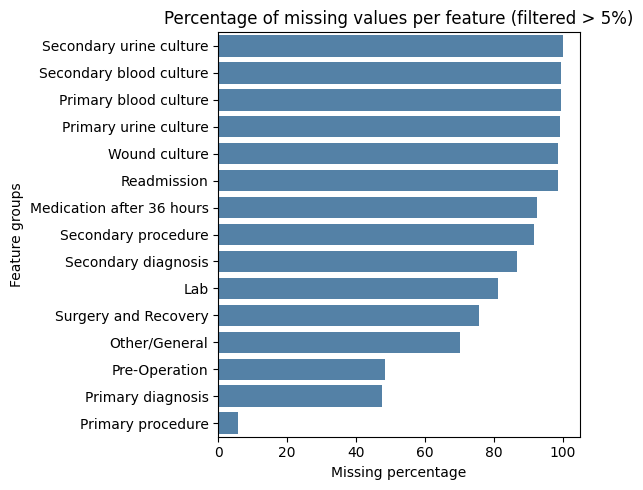

In [137]:
# filter columns with more than 5% missing values
missing_filtered = missing[missing["missing_percent"] > 1]
# apply the function to create a new column for the group
missing_filtered = missing_filtered.copy()
missing_filtered['feature_group'] = missing_filtered.index.map(assign_group)
# group by the new category and calculate the average missing percentage
grouped_missing = missing_filtered.groupby('feature_group')['missing_percent'].mean()
# sort in descending order to easily identify groups and patterns in the graph
grouped_missing = grouped_missing.sort_values(ascending=False)

# create and display the horizontal barplot
plt.figure(figsize=(6, 5))
sns.barplot(x=grouped_missing.values, y=grouped_missing.index, color='steelblue')
plt.title('Percentage of missing values per feature (filtered > 5%)')
plt.xlabel('Missing percentage')
plt.ylabel('Feature groups')
plt.tight_layout()
plt.show()


##### Heatamps of missing values-

Due to the high dimensionality of our dataset, generating a single comprehensive heatmap for all missing values would result in an unreadable and uninformative visualiztion.

To extract meaningful clinical insights, we adopted a targeted approach. We grouped specific features into logical clinical domains.

By generating targeted heatmaps for these sub-groups, we aim to identify the **co-occurence of missing data**. Understanding these patterns helps us determined whether missing values are random or if they represent specific clinical scenarios.

When automatically grouping features by keywords, rboad terms can accidentally pull in unwanted columns (such as antibiotic data containing the word "admission").

By creating a general list first and then applying an **exclution filter** (removing specific unwanted keywords), we ensure clean, distinct feature groups without overlapping data. This keeps each heatmap focused strictly on its relevant clinical category. 

In [ ]:
#define the lists of columns for each clinical group

# hospitalization
hospitalization = [col for col in df.columns if any(k in col for k in ['first_hospitalization', 'readmission', 'activity', 'admission', 'discharge',
                                                                       'additional_surgery'])] + ["case_number", "department", "length_of_stay_hrs"]
exclude_hosp = ['antibiotics', 'analgesics', 'diuretics', 'ppi_', 'specimen']
hospitalization = [col for col in hospitalization if not any(w in col for w in exclude_hosp)]

#diagnosis and procedures
diagnosis_and_procedures = [col for col in df.columns if any(k in col for k in ['diagnosis', 'procedure', 'icu', 'disease', 'revision', ])] + ["geriatric_polypharmacy", 
                                                                                "elderly_assessment_scanner_score_value", "added1_surgery_name", "added1_surgery_code_icd9",
                                                                                "added1_length_of_surgery", "additional_surgery_during_hosp_transfer_start_date", "additional_surgery_during_hosp_transfer_end_date"]
exclude_diag = ['first_hospitalization']
diagnosis_and_procedures = [col for col in diagnosis_and_procedures if not any(w in col for w in exclude_diag)]

#laboratory
lab_cols = [col for col in df.columns if any(k in col for k in ['lab_', 'glucose'])]

# pre operation
preop_cols = [col for col in df.columns if any(k in col for k in ['preop_', 'pre_surgery', 'prop'])] 

# cultures and pathogens
culture_cols = [col for col in df.columns if any(k in col for k in ['culture', 'mrsa', 'pathogen', 'specimen'])] 

# meds and intervention
medication_and_intervention_cols = [col for col in df.columns if any(k in col for k in ['antibiotics', 'analgesics', 'diuretics', 'ppi_', 'tpn_', 'catheter', "CVC", "drain", 'added1_anesthesia_type'])]

# another list of "leftovers"- gather whatever is left
all_assigned_cols = set( hospitalization + diagnosis_and_procedures + lab_cols + preop_cols + culture_cols + medication_and_intervention_cols)
leftover_cols = [col for col in df.columns if col not in all_assigned_cols]

In [139]:
# Define the heatmap function
def plot_targeted_heatmap(data, column_list, title):
    """ Creates a missing values heatmap for a specific list of columns."""
    fig, ax = plt.subplots(figsize=(16, max(3, len(column_list) * 0.3 + 1)))
    sorted_cols = data[column_list].isnull().sum().sort_values().index.tolist()
    missing_matrix = data[sorted_cols].isnull().astype(int).T
    sns.heatmap(missing_matrix,
            cbar=False, 
            cmap = "viridis",
            vmin=0,
            vmax=1,
            xticklabels=False, 
            yticklabels=sorted_cols,
            ax=ax,
            rasterized=True)
    ax.set_title(title)
    ax.set_xlabel("Features")
    plt.tight_layout()
    plt.show()


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\002_Missing_Values_Co-occurence__Hospitalization.png


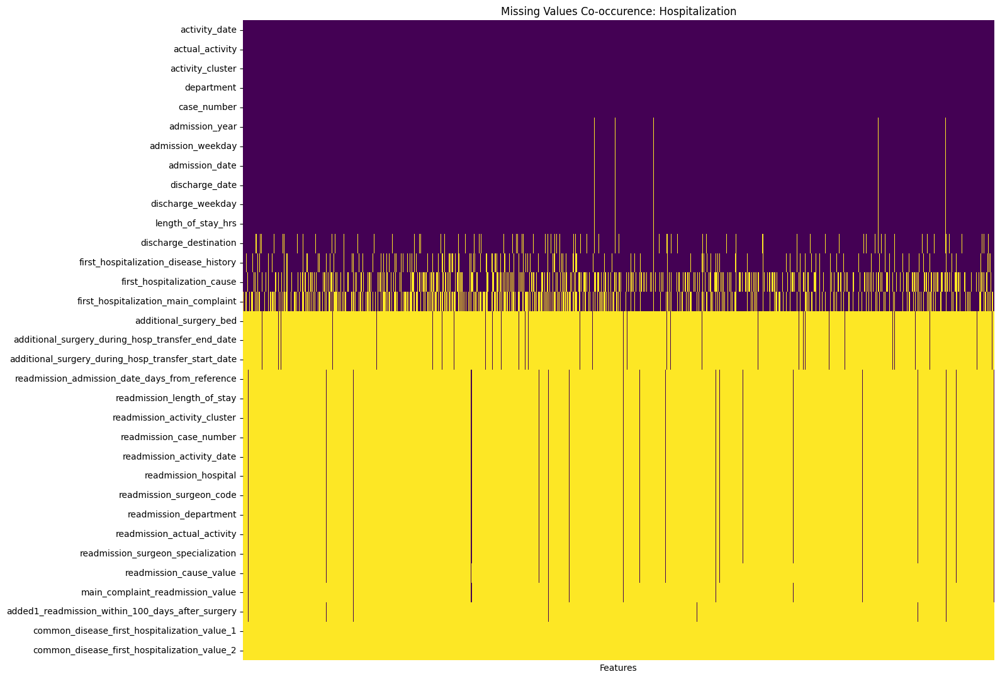

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\003_Missing_Values_Co-occurence__Diagnosis_and_Procedures.png


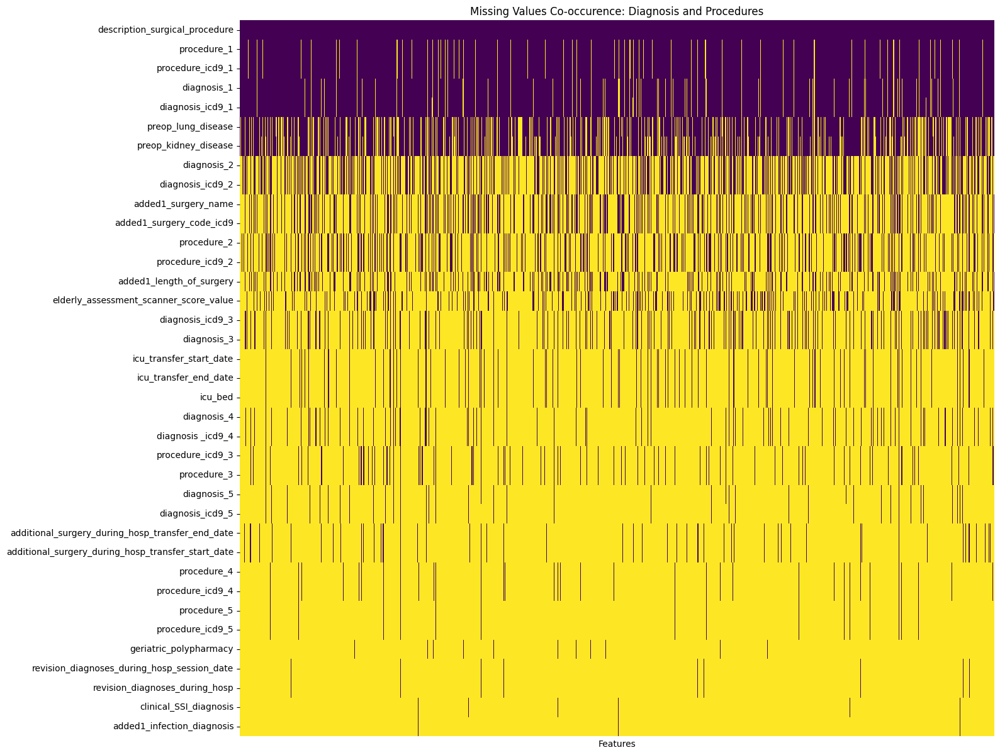

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\004_Missing_Values_Co-occurence__Laboratory.png


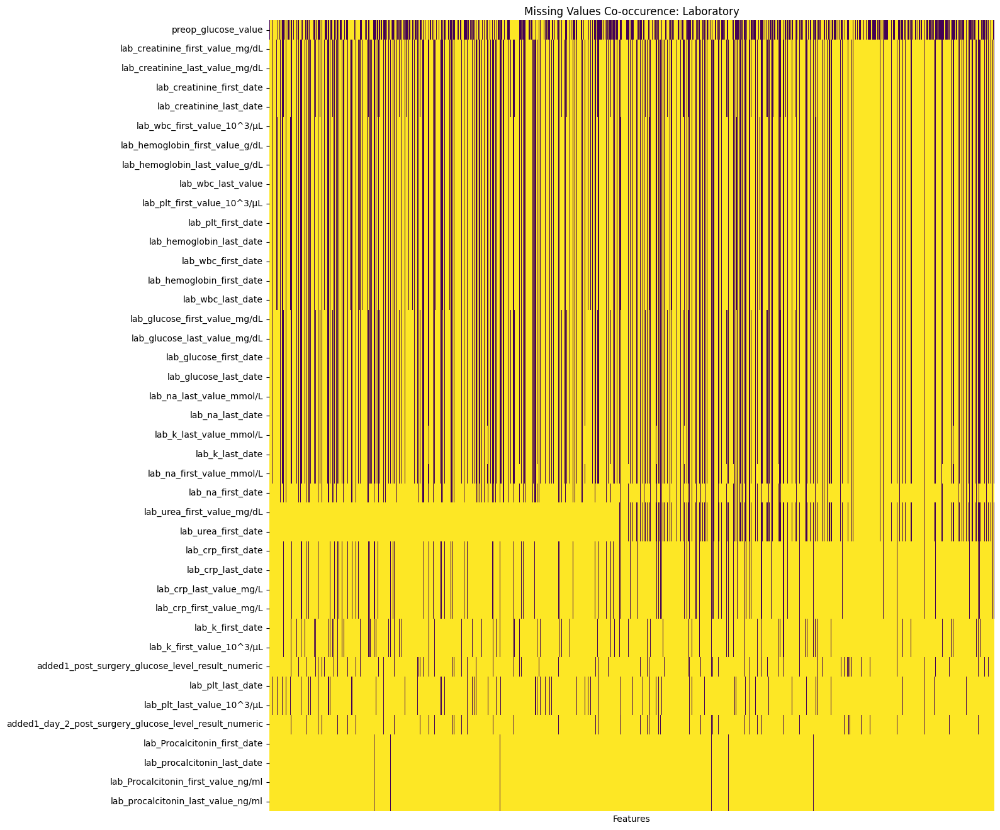

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\005_Missing_Values_Co-occurence__Pre-Operation_data.png


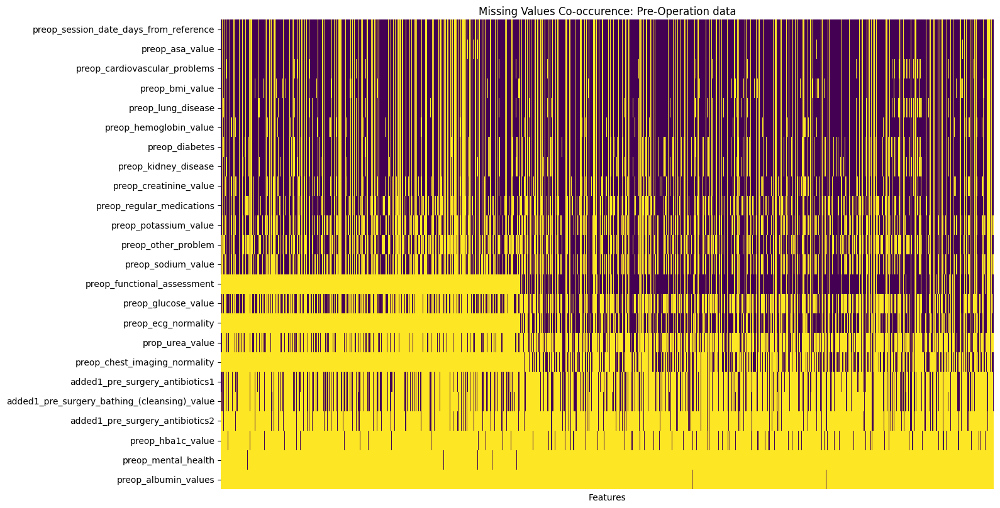

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\006_Missing_Values_Co-occurence__Cltures.png


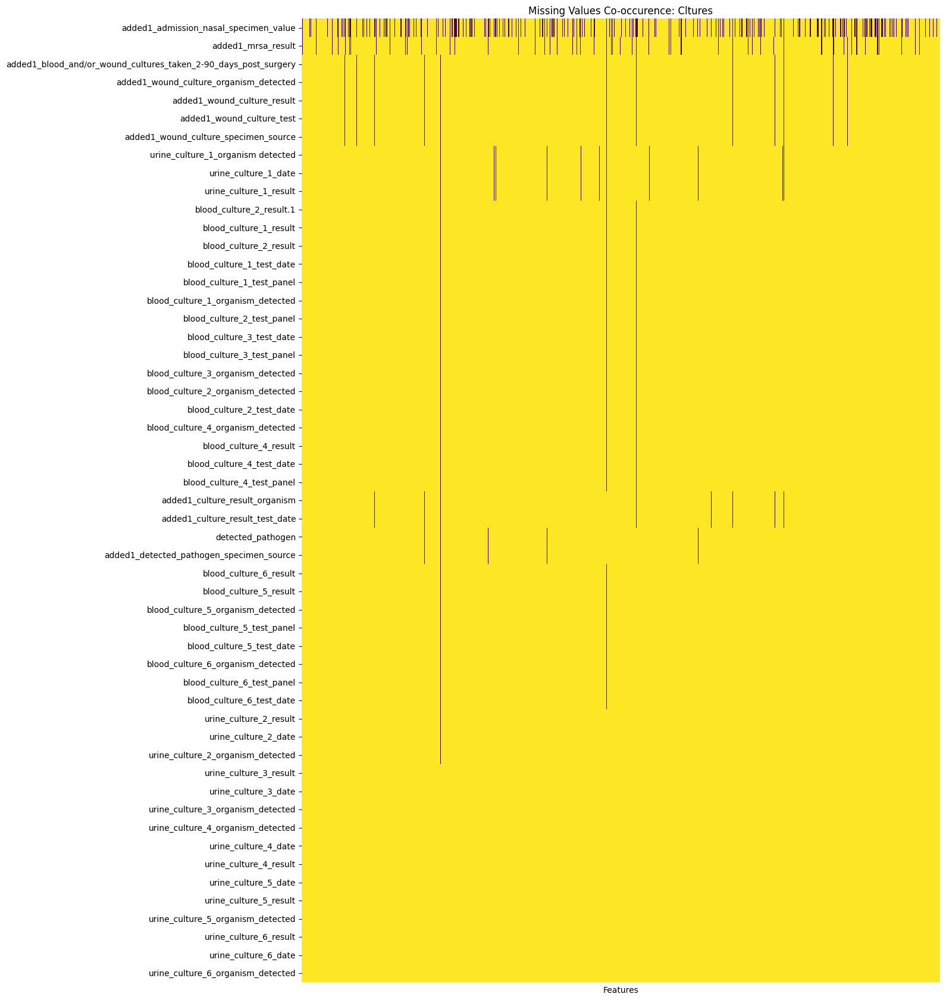

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\007_Missing_Values_Co-occurence__Medications_and_Interventions.png


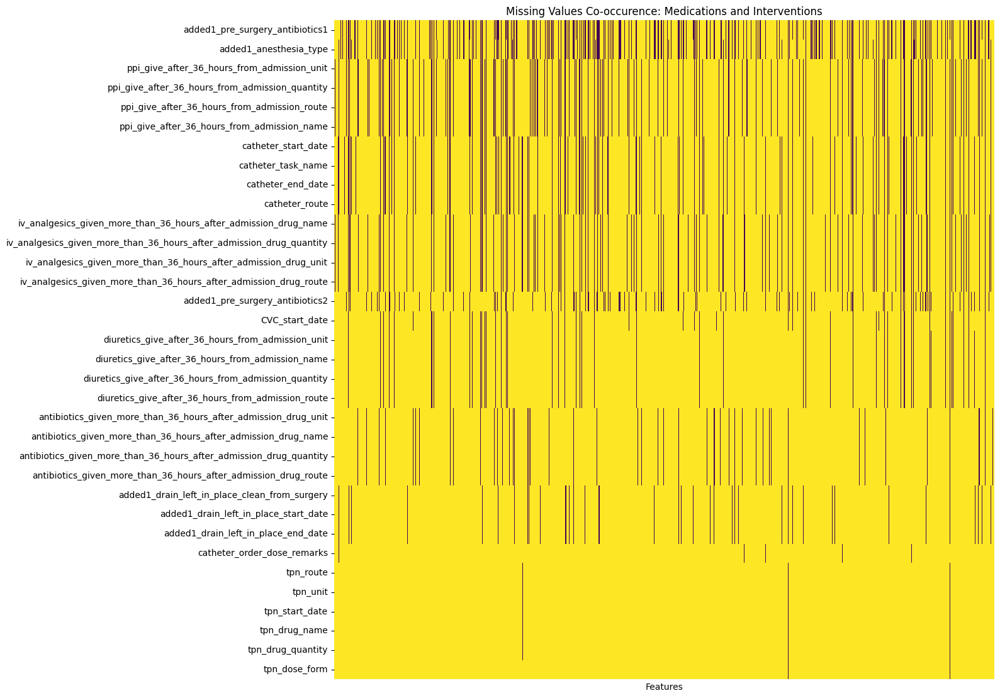

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\008_Missing_Values_Co-occurence__Leftover_columns.png


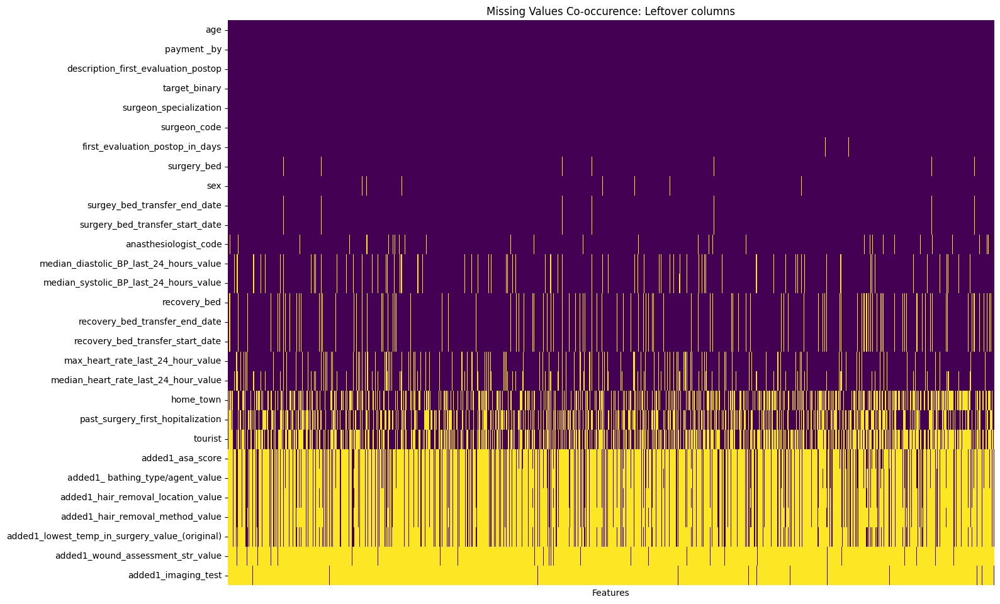

In [140]:
# draw the heatmaps
#plot_targeted_heatmap(df, logistic_and_demografic_cols, "Missing Values Co-occurence: ")
plot_targeted_heatmap(df, hospitalization, "Missing Values Co-occurence: Hospitalization")
plot_targeted_heatmap(df, diagnosis_and_procedures, "Missing Values Co-occurence: Diagnosis and Procedures")
plot_targeted_heatmap(df, lab_cols, "Missing Values Co-occurence: Laboratory")
plot_targeted_heatmap(df, preop_cols, "Missing Values Co-occurence: Pre-Operation data")
plot_targeted_heatmap(df, culture_cols, "Missing Values Co-occurence: Cltures")
plot_targeted_heatmap(df, medication_and_intervention_cols, "Missing Values Co-occurence: Medications and Interventions")
plot_targeted_heatmap(df, leftover_cols, "Missing Values Co-occurence: Leftover columns")

# 2- Univariate Analysis

In [141]:
# helper function for visualizations:
import bidi.algorithm as bidi
SECTION_WIDTH = 70

def section(title):
    """print a clearly visible section header."""
    print("\n" + "=" * SECTION_WIDTH)
    print(f"  {title}")
    print("=" * SECTION_WIDTH)


def fix_rtl(text):
    """reverse Hebrew text for correct matplotlib display"""
    try:
        return bidi.get_display(text)
    except:
        return text 
    

def make_grid(n_items, n_cols=4, col_w=6, row_h=5):
    """
    Create a subplot grid that fiys n_items_panels.
    - Caps columns at n_items so we never crate empty columns on a single row.
    - Returns (fig, axes_flat): axes is always a 1-D array for easy indexing.
    """
    n_cols = min(n_cols,n_items)
    n_rows = int(np.ceil(n_items / n_cols))
    fig,axes = plt.subplots(n_rows, n_cols,
                        figsize = (col_w * n_cols, row_h * n_rows))
    return fig, np.array(axes).flatten()


def hide_unused (axes,last_idx):
    """ Hide subplot panels that were not filled."""
    for j in range(last_idx + 1, len(axes)):
        axes[j].set_visible(False)


def plot_bar_grid(df, cols, title, n_cols=4, col_w=6, row_h=4, top_n=15, hspace=0.9, max_label_len=30, orientation="vertical"):
    """
    Draw a bar chart for each column in cols (value_counts, top top_n).
    Used for both categorical and boolean univariate plots.
    """
    if not cols:
        return
    fig,axes = make_grid(len(cols), n_cols=n_cols, col_w=col_w, row_h=row_h)
    for i, col in enumerate(cols):
        vc = df[col].value_counts(dropna=False).head(top_n)
        plot_kind = "bar" if orientation == "vertical" else  "barh"
        vc.plot(kind=plot_kind, ax=axes[i], color="steelblue", edgecolor="white")
        
        # truncate long value labels so they dont overlap each other
        short_labels = [fix_rtl(str(v)[:max_label_len] + ("..." if len(str(v)) > max_label_len else ""))
                        for v in vc.index] 
        if orientation == "vertical":
            axes[i].set_xticklabels(short_labels, rotation=45, ha="right", fontsize=8)
        else:
            axes[i].set_yticklabels(short_labels, fontsize=8)
            axes[i].invert_yaxis()
        col_title = fix_rtl(col[:40] + "..." if len(col) > 40 else col)
        axes[i].set_title(f"{fix_rtl(col_title)}\nunique: {df[col].nunique()})", fontsize=10)
        axes[i].set_xlabel("")
        axes[i].set_position([
            axes[i].get_position().x0,
            axes[i].get_position().y0 + 0.01,
            axes[i].get_position().width,
            axes[i].get_position().height
        ])
    hide_unused(axes,i)
    plt.suptitle(title, fontsize=13)
    plt.subplots_adjust(hspace=1.5, left=0.05,right=0.98, top=0.93, bottom=0.05)
    plt.show()


### Numeric Columns

In [142]:
# statistic calculations
if numeric_cols:
    describe_num = df[numeric_cols].describe(percentiles= [.01, .05, .25, .5, .75, .95, .99]).T
    describe_num["skewness"] = df[numeric_cols].skew()
    describe_num["kurtosis"] = df[numeric_cols].kurtosis()
    display(describe_num)

,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max,skewness,kurtosis
age,35925.0,53.304293,18.717119,0.258160,4.126824,19.424907,41.185499,55.509418,68.244539,78.376203,84.423161,9.912094e+01,-0.587810,-0.206405
length_of_stay_hrs,35861.0,42.994618,71.838297,-185.000000,3.000000,6.000000,15.000000,23.000000,45.000000,160.000000,284.000000,4.798000e+03,15.812183,695.273562
preop_session_date_days_from_reference,28101.0,-2.690695,2.936407,-9.999306,-9.627083,-8.152083,-5.057639,-1.187500,-0.080556,-0.026389,-0.012500,7.659722e-01,-0.779903,-0.773290
preop_bmi_value,27184.0,63.784591,1852.291238,0.000000,17.954900,20.021500,23.670000,26.560000,30.370000,39.088500,49.011700,2.700000e+05,118.435602,16718.287467
preop_creatinine_value,24956.0,1.807128,13.049502,-0.980000,0.520000,0.600000,0.740000,0.870000,1.000000,1.250000,6.243000,9.840000e+02,35.630990,2046.207023
preop_glucose_value,16559.0,684.052228,73753.402603,0.000000,71.000000,81.000000,90.000000,97.000000,107.000000,141.000000,195.420000,9.490280e+06,128.659563,16555.161915
preop_potassium_value,21094.0,5.463805,14.967970,0.000000,3.600000,3.870000,4.200000,4.400000,4.600000,5.100000,41.000000,4.970000e+02,23.094691,629.627667
preop_sodium_value,20891.0,142.761991,110.755386,0.000000,133.000000,136.000000,139.000000,140.000000,141.000000,144.000000,145.000000,1.371500e+04,91.092985,10828.173978
prop_urea_value,10804.0,35.677888,38.407970,0.000000,13.000000,19.000000,27.000000,33.000000,40.625000,54.000000,75.000000,3.347000e+03,61.847602,5144.763629
preop_hba1c_value,2801.0,7.186333,18.252864,0.000000,4.400000,4.960000,5.460000,5.800000,6.300000,7.800000,39.000000,6.120000e+02,27.270337,858.565409


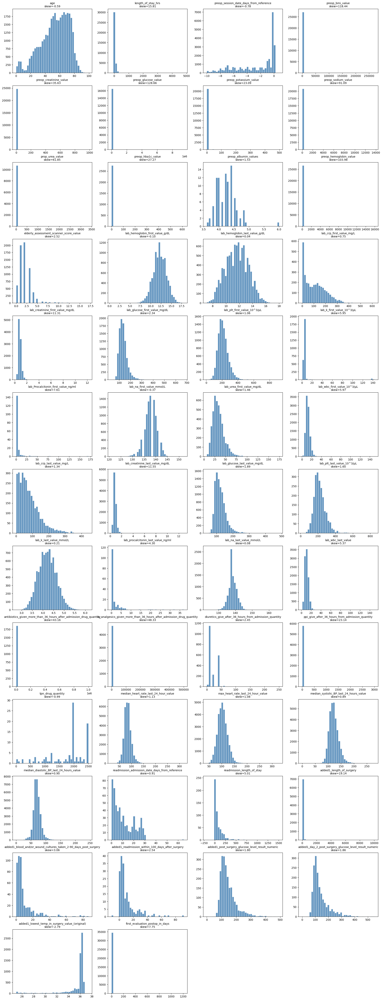

In [ ]:
# Histogram per numeric column 
fig,axes = make_grid(len(numeric_cols), n_cols=4,col_w=6, row_h=5)

for i, col in enumerate(numeric_cols):
    ax = axes[i]
    data = df[col].dropna()
    if data.empty:
        ax.set_title(f"{col}\nNo available data", fontsize=10)
        ax.axis("off")
        continue
    ax.hist(data, bins=40, edgecolor="white", color="steelblue", alpha=0.85)
    ax.set_title(f"{col}\nskew={data.skew():.2f}", fontsize=10)
    
hide_unused(axes,i)


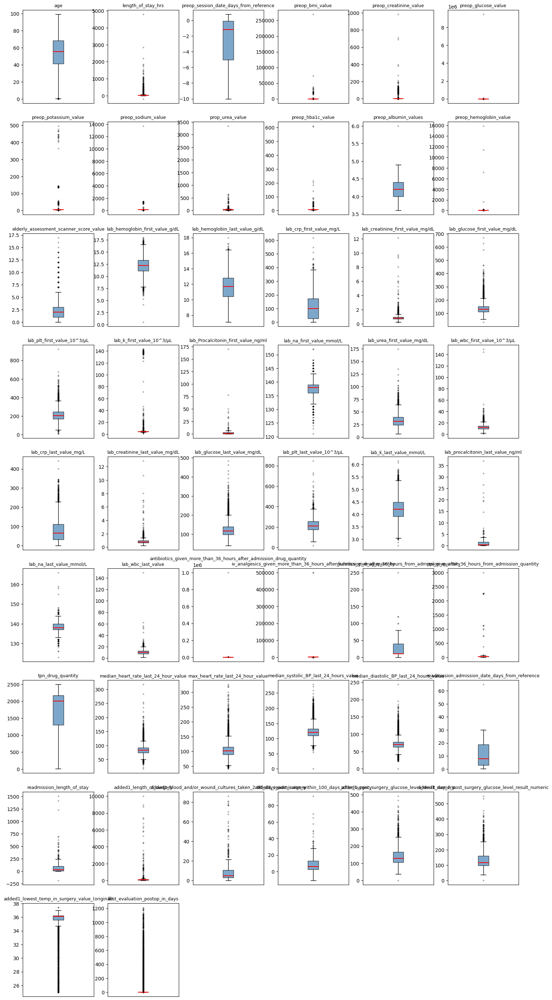

In [ ]:
# Boxplots to visualize spread and outliers by side
fig, axes = make_grid(len(numeric_cols), n_cols=6, col_w=3, row_h=4)

for i, col in enumerate(numeric_cols):
    ax = axes[i]
    data = df[col].dropna()

    if data.empty:
        ax.set_title(f"{col}\nNo available data", fontsize=9)
        ax.axis("off")
        continue
    
    ax.boxplot(data, vert=True, patch_artist=True, 
               boxprops=dict(facecolor="steelblue", alpha=0.7),
               medianprops=dict(color="red", linewidth=1.5),
               flierprops=dict(marker="o",markersize=2,alpha=0.4))
    ax.set_title(col, fontsize=9)
    ax.set_xticks([])
hide_unused(axes, i)


In [145]:
# IQR outlier summary table (flagged valeus)
def iqr_summary(df, cols, csv_path= "eda_outlier_summary.csv"):
    """
    Compute IQR-based outlier stats for every column in cols.
    Save a full CSV and prints a short preview (column, n_outliers, percent_outliers).
    Returns the summary Dataframe so callers can inspect it further.
    """
    rows = []
    for col in cols:
        data = df[col].dropna()

        if data.empty:
            continue

        Q1,Q3 = data.quantile(0.25), data.quantile(0.75)
        IQR = Q3 - Q1
        lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
        n_out = ((data < lower) | (data > upper)).sum()
        rows.append({
            "column": col,
            "lower_fence": round(lower, 4),
            "upper_fence": round(upper, 4),
            "n_outliers": n_out,
            "percent_outliers": round(n_out / len(data) * 100, 2)
        })
    out = pd.DataFrame(rows).set_index("column").sort_values("percent_outliers", ascending=False)
    display(out)
    return out

outlier_df = iqr_summary(df,numeric_cols)


,lower_fence,upper_fence,n_outliers,percent_outliers
column,,,,
iv_analgesics_given_more_than_36_hours_after_admission_drug_quantity,1000.0000,1000.0000,931,19.84
added1_lowest_temp_in_surgery_value_(original),34.7000,37.1000,1186,16.69
lab_procalcitonin_last_value_ng/ml,-1.9900,3.6900,24,13.87
lab_Procalcitonin_first_value_ng/ml,-4.2050,7.4950,22,12.36
length_of_stay_hrs,-30.0000,90.0000,4269,11.90
added1_blood_and/or_wound_cultures_taken_2-90_days_post_surgery,-8.1250,21.7194,54,10.69
added1_readmission_within_100_days_after_surgery,-12.6964,28.5634,19,10.22
preop_glucose_value,64.5000,132.5000,1228,7.42
lab_k_first_value_10^3/µL,3.1900,5.5900,194,7.18


### Categorical Columns

Remark- some categorical columns (e.g. 'surgeon sepcialization, drug names...) have many distinct categories and somtime also long text labels.

In a standart vertical bar chart these labels overlap or run off the plot, and a single dominant category (usually missing value) can stretch the count axis so much that the remaining categories become indistinguishable.

These columns are therefore plotted seperately, using horizontal bars instead of vertical ones. Missing values are reported as a percentage in the plot title rather than plotted as a bar, so the count axis reflects only the real category values. Only the top 10 most frequent non-missing categories are shown; the rest are grouped into "Other". lomg labels are turncated for readability.


In [146]:
cat_summary = df[categorical_cols].nunique(dropna=False).reset_index()
cat_summary.columns = ['column_name', 'n_unique']
with pd.option_context("display.max_rows", None):
    display(cat_summary)

,column_name,n_unique
0,activity_cluster,7
1,admission_weekday,8
2,admission_year,5
3,department,8
4,surgeon_specialization,24
5,discharge_weekday,8
6,tourist,3
7,icu_bed,14
8,preop_asa_value,6
9,preop_functional_assessment,4


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\009_Categorical_Distributions.png


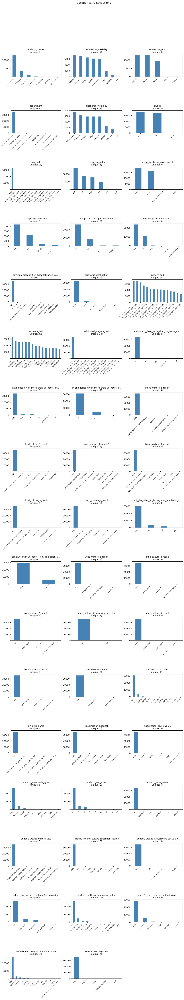

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\010_Categorical_Distribution_(long_labels___high_cardinality).png


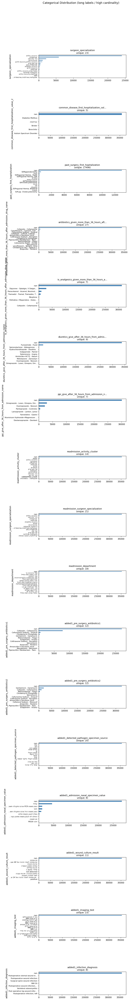

In [ ]:
# visualize- bar charts 
long_label_categorical_cols = [
    "surgeon_specialization", 
    "common_disease_first_hospitalization_value_2",
    "past_surgery_first_hopitalization", 
    "antibiotics_given_more_than_36_hours_after_admission_drug_name", 
    "iv_analgesics_given_more_than_36_hours_after_admission_drug_name", 
    "diuretics_give_after_36_hours_from_admission_name",
    "ppi_give_after_36_hours_from_admission_name",
    "readmission_activity_cluster",
    "readmission_surgeon_specialization",
    "readmission_department",
    "added1_pre_surgery_antibiotics1",
    "added1_pre_surgery_antibiotics2",  
    "added1_detected_pathogen_specimen_source", 
    "added1_admission_nasal_specimen_value", 
    "added1_wound_culture_result", 
    "added1_imaging_test", 
    "added1_infection_diagnosis"
]

standart_categorical_cols = [col for col in categorical_cols if col not in long_label_categorical_cols]
plot_bar_grid(df, standart_categorical_cols, 
              title="Categorical Distributions", n_cols=min(3, len(standart_categorical_cols)), col_w=4)


existing_long_label_cols = [col for col in long_label_categorical_cols if col in df.columns]
plot_bar_grid(df, existing_long_label_cols, title="Categorical Distribution (long labels / high cardinality)", 
              n_cols=1, col_w=6, orientation="horizontal")


### Boolean Columns

In [149]:
if boolean_cols:
    for col in boolean_cols:
        vc = df[col].value_counts(dropna=False)
        percent = vc / len(df) * 100
        print(f"\n{col}:")
        print(pd.DataFrame({"count": vc, "percent": percent.round(2)}).to_string())

        # warn if unexpected values exist ("yes", 0.5, ext..)
        valid = {True, False, "True", "Flase", "true", "false", 0, 1, "0", "1"}
        unexpected = [v for v in df[col].dropna().unique() if v not in valid]
        if unexpected:
            print(f"Unexpected values: {unexpected}")


sex:
      count  percent
sex                 
זכר   19111    53.20
נקבה  16592    46.19
NaN     222     0.62
Unexpected values: ['נקבה', 'זכר']

preop_cardiovascular_problems:
                               count  percent
preop_cardiovascular_problems                
0.0                            17069    47.51
1.0                            10241    28.51
NaN                             8615    23.98

preop_other_problem:
                     count  percent
preop_other_problem                
0.0                  17500    48.71
NaN                  14866    41.38
1.0                   3559     9.91

preop_kidney_disease:
                      count  percent
preop_kidney_disease                
0.0                   22054    61.39
NaN                   10488    29.19
1.0                    3383     9.42

preop_lung_disease:
                    count  percent
preop_lung_disease                
0.0                 23180    64.52
NaN                  9060    25.22
1.0                  

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\011_Boolean_Distributions.png


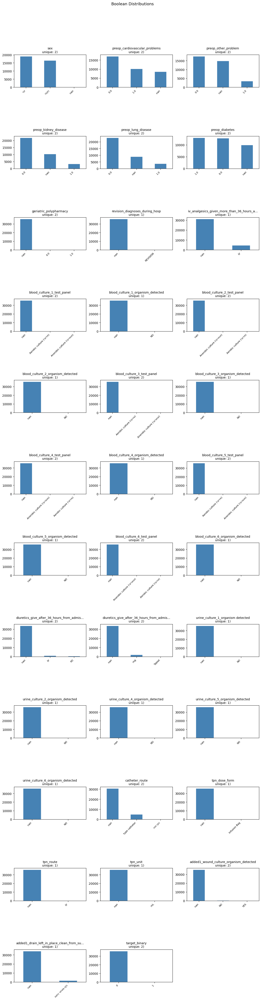

In [ ]:
# bar chart
if boolean_cols:
    plot_bar_grid(df, boolean_cols, title="Boolean Distributions", n_cols=min(3, len(boolean_cols)), col_w=4)

### Datetime

#### 1. Datetime groups and coverage audit

There are many datetime columns in the dataset. Some represent central hospital dates, some are paired start/end timestamps, some belong to repeated laboratory measurements, and others represent clinical events.

Before analyzing them, the code assigns the datetime variables to clinically meaningful groups and performs a **coverage audit**.

The audit checks:
- how many datetime columns exist in the semantic mapping
- how many were assigned to one of the temporal EDA groups
- which mapped datetime columns were not assigned
- which planned columns are not present in the current dataframe
- whether a naming difference could silently cause a variable to be skipped

This prevents a column from disappearing from the EDA only because its name changed or contains a spelling difference.


In [ ]:
# 4.1 DATETIME GROUPS AND COVERAGE AUDIT

# Central dates that describe the study timeline.
central_datetime_cols = [
    "activity_date",
    "admission_date",
    "discharge_date",
    "readmission_activity_date"
]

# Start/end pairs that represent clinically meaningful durations.
datetime_pairs = {
    "ICU stay": (
        "icu_transfer_start_date",
        "icu_transfer_end_date"
    ),
    "Surgery bed stay": (
        "surgery_bed_transfer_start_date",
        "surgey_bed_transfer_end_date"  
    ),
    "Recovery stay": (
        "recovery_bed_transfer_start_date",
        "recovery_bed_transfer_end_date"
    ),
    "Additional surgery episode": (
        "additional_surgery_during_hosp_transfer_start_date",
        "additional_surgery_during_hosp_transfer_end_date"
    ),
    "Catheter duration": (
        "catheter_start_date",
        "catheter_end_date"
    ),
    "Drain duration": (
        "added1_drain_left_in_place_start_date",
        "added1_drain_left_in_place_end_date"
    )
}

# First/last laboratory measurement dates.
lab_date_pairs = {
    "Hemoglobin": (
        "lab_hemoglobin_first_date",
        "lab_hemoglobin_last_date"
    ),
    "CRP": (
        "lab_crp_first_date",
        "lab_crp_last_date"
    ),
    "Creatinine": (
        "lab_creatinine_first_date",
        "lab_creatinine_last_date"
    ),
    "Glucose": (
        "lab_glucose_first_date",
        "lab_glucose_last_date"
    ),
    "Platelets": (
        "lab_plt_first_date",
        "lab_plt_last_date"
    ),
    "Potassium": (
        "lab_k_first_date",
        "lab_k_last_date"
    ),
    "Procalcitonin": (
        "lab_Procalcitonin_first_date",
        "lab_procalcitonin_last_date"
    ),
    "Sodium": (
        "lab_na_first_date",
        "lab_na_last_date"
    ),
    "Urea": (
        "lab_urea_first_date",
        "lab_urea_last_date"
    ),
    "WBC": (
        "lab_wbc_first_date",
        "lab_wbc_last_date"
    )
}

# Repeated culture dates
blood_culture_date_cols = [
    f"blood_culture_{i}_test_date"
    for i in range(1, 7)
]

# The current mapping does not show urine_culture_3_date
urine_culture_date_cols = [
    "urine_culture_1_date",
    "urine_culture_2_date",
    "urine_culture_4_date",
    "urine_culture_5_date",
    "urine_culture_6_date"
]

# Additional culture date
additional_culture_date_cols = [
    "added1_culture_result_test_date"
]

# Clinical events with a start date but no paired end date in the current mapping
single_event_dates = {
    "CVC insertion": "CVC_start_date",
    "TPN start": "tpn_start_date",
    "Revision diagnosis during hospitalization":
        "revision_diagnoses_during_hosp_session_date"
}


# Coverage audit
planned_datetime_cols = set(central_datetime_cols)

for start_col, end_col in datetime_pairs.values():
    planned_datetime_cols.update([start_col, end_col])

for first_col, last_col in lab_date_pairs.values():
    planned_datetime_cols.update([first_col, last_col])

planned_datetime_cols.update(blood_culture_date_cols)
planned_datetime_cols.update(urine_culture_date_cols)
planned_datetime_cols.update(additional_culture_date_cols)
planned_datetime_cols.update(single_event_dates.values())

mapped_datetime_cols = set(datetime_cols)
data_columns = set(df.columns)

uncovered_datetime_cols = sorted(mapped_datetime_cols - planned_datetime_cols)
planned_but_missing_from_df = sorted(planned_datetime_cols - data_columns)
mapped_but_missing_from_df = sorted(mapped_datetime_cols - data_columns)

print(f"Datetime columns in semantic mapping: {len(mapped_datetime_cols)}")
print(f"Datetime columns assigned to temporal EDA groups: {len(planned_datetime_cols)}")

print("\nMapped datetime columns not yet assigned to a group:")
print(uncovered_datetime_cols if uncovered_datetime_cols else "None")

print("\nPlanned datetime columns not found in dataframe:")
print(planned_but_missing_from_df if planned_but_missing_from_df else "None")

print("\nMapped datetime columns not found in dataframe:")
print(mapped_but_missing_from_df if mapped_but_missing_from_df else "None")

# Specific check requested because urine culture 3 has no visible date field in the mapping.
print("\nColumns related to urine_culture_3:")
print([c for c in df.columns if "urine_culture_3" in c])


Datetime columns in semantic mapping: 51
Datetime columns assigned to temporal EDA groups: 51

Mapped datetime columns not yet assigned to a group:
['urine_culture_3_date']

Planned datetime columns not found in dataframe:
['lab_urea_last_date']

Mapped datetime columns not found in dataframe:
None

Columns related to urine_culture_3:
['urine_culture_3_result', 'urine_culture_3_date', 'urine_culture_3_organism_detected']


#### 2. Central dates

Only the main timeline variables receive a direct calendar-time summary. These variables describe when the surgical records were collected and the overall study period.

The output includes:
- number of available and missing records,
- earliest and latest date,
- one plot showing the number of surgical procedures per month.

##### Why only one visualization is used
Month-of-year, weekday and hour-of-day plots are not automatically generated for every datetime column. For most clinical timestamps, the meaningful information is the **time relative to surgery** or the **duration of the event**, not the calendar month in which it occurred.

,column,valid_records,missing_records,missing_percent,earliest_date,latest_date
0,activity_date,35925,0,0.00,2023-01-01 09:07:00,2025-09-30 21:30:00
1,admission_date,35861,64,0.18,2022-12-08 11:59:00,2025-09-30 18:27:22
2,discharge_date,35861,64,0.18,2022-12-15 15:21:00,2025-12-08 14:14:00
3,readmission_activity_date,548,35377,98.47,2023-01-05 11:11:10,2025-10-28 12:14:00


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\012_Number_of_Surgical_Procedures_per_Month.png


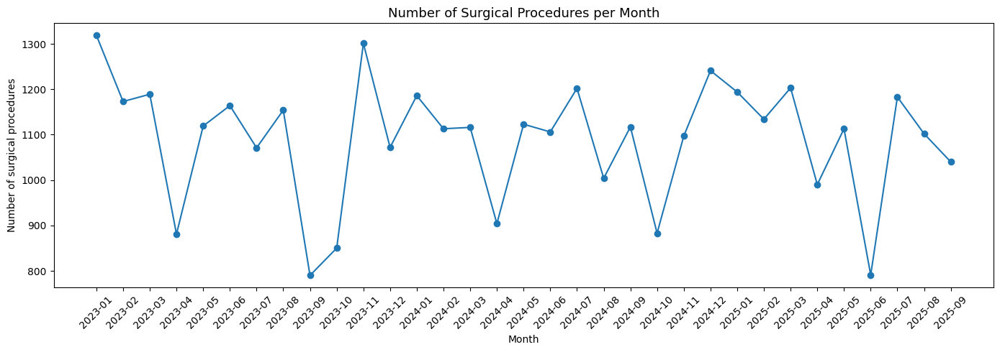

In [ ]:
# 4.2 CENTRAL DATETIME SUMMARY
central_datetime_summary = []

for col in central_datetime_cols:
    if col not in df.columns:
        continue
    valid = df[col].dropna()
    central_datetime_summary.append({
        "column": col,
        "valid_records": int(valid.shape[0]),
        "missing_records": int(df[col].isna().sum()),
        "missing_percent": round(df[col].isna().mean() * 100, 2),
        "earliest_date": valid.min() if not valid.empty else pd.NaT,
        "latest_date": valid.max() if not valid.empty else pd.NaT
    })

central_datetime_summary_df = pd.DataFrame(central_datetime_summary)
display(central_datetime_summary_df)

# One central visualization: number of surgeries per month
if "activity_date" in df.columns:
    surgery_dates = df["activity_date"].dropna()
    if not surgery_dates.empty:
        monthly_surgeries = (surgery_dates.dt.to_period("M").value_counts().sort_index())
        monthly_surgeries.index = monthly_surgeries.index.astype(str)

        plt.figure(figsize=(14, 5))
        plt.plot(monthly_surgeries.index, monthly_surgeries.values, marker="o")
        plt.title("Number of Surgical Procedures per Month", fontsize=13)
        plt.xlabel("Month")
        plt.ylabel("Number of surgical procedures")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


### 3. Clinical durations and plausibility

Several datetime variables occur as start/end pairs. For these variables, the clinically meaningful quantity is the **duration of the event or exposure**.
Examples include: ICU stay, recovery stay, catheter duration, drain duration, additional surgery episode.

The table reports:
- number of records with both timestamps,
- negative durations,
- mean duration,
- median duration,
- 90th percentile,
- minimum and maximum duration,
- events starting before admission,
- events ending after discharge.

Duration of hospitalization-related exposures may contain clinically relevant information for postoperative infection risk. At the same time, impossible chronological values may indicate data-quality, merge or timestamp problems.

Negative or hospitalization-inconsistent times are **flagged for review only**. They are not deleted automatically.


In [ ]:
# 4.3 CLINICAL DURATION SUMMARY
duration_summary = []

for event_name, (start_col, end_col) in datetime_pairs.items():
    if start_col not in df.columns or end_col not in df.columns:
        continue
    both_mask = (df[start_col].notna() & df[end_col].notna())

    duration_hours = (
        df.loc[both_mask, end_col]
        - df.loc[both_mask, start_col]
    ).dt.total_seconds() / 3600

    negative_count = int((duration_hours < 0).sum())
    valid_duration = duration_hours[duration_hours >= 0]

    # Plausibility relative to the hospitalization interval
    start_before_admission = 0
    end_after_discharge = 0

    if "admission_date" in df.columns:
        admission_mask = both_mask & df["admission_date"].notna()
        start_before_admission = int(
            (df.loc[admission_mask, start_col] < df.loc[admission_mask, "admission_date"]).sum()
        )

    if "discharge_date" in df.columns:
        discharge_mask = both_mask & df["discharge_date"].notna()
        end_after_discharge = int(
            (df.loc[discharge_mask, end_col] > df.loc[discharge_mask, "discharge_date"]).sum()
        )

    duration_summary.append({
        "clinical_event": event_name,
        "records_with_both_dates": int(both_mask.sum()),
        "negative_durations": negative_count,
        "mean_hours": round(valid_duration.mean(), 2),
        "median_hours": round(valid_duration.median(), 2),
        "p90_hours": round(valid_duration.quantile(0.90), 2),
        "min_hours": round(valid_duration.min(), 2),
        "max_hours": round(valid_duration.max(), 2),
        "start_before_admission": start_before_admission,
        "end_after_discharge": end_after_discharge
    })

duration_summary_df = pd.DataFrame(duration_summary)
display(duration_summary_df)

,clinical_event,records_with_both_dates,negative_durations,mean_hours,median_hours,p90_hours,min_hours,max_hours,start_before_admission,end_after_discharge
0,ICU stay,2731,0,30.25,21.67,49.10,0.02,664.83,0,5
1,Surgery bed stay,35695,0,1.59,1.30,3.12,0.02,22.42,0,1
2,Recovery stay,32613,0,1.40,1.28,2.27,0.02,8.35,0,0
3,Additional surgery episode,993,0,1.39,1.18,2.90,0.02,7.05,0,0
4,Catheter duration,5139,0,44.43,38.67,86.38,0.02,905.50,0,25
5,Drain duration,1676,0,72.57,65.95,121.29,7.43,1137.35,1,45


#### 4. Laboratory timing relative to surgery

Laboratory values may be clinically important predictors, but their usefulness for an **early prediction model** depends on when the measurements became available.

For each laboratory test, the code summarizes the timing of the first and last recorded measurement relative to `activity_date`.

The output includes:
- number of available measurements
- mean and median time from surgery
- 90th percentile
- minimum and maximum time
- percentage measured before surgery
- percentage measured between 0 and 24 hours after surgery
- percentage measured after 24 hours
- chronological inconsistencies where the recorded first measurement occurs after the last measurement

A compact timing table provides more useful information for later leakage review and feature selection than dozens of separate datetime plots.


In [ ]:
# 4.4 LABORATORY TIMING SUMMARY

reference_date_col = "activity_date"
lab_timing_summary = []

for lab_name, (first_col, last_col) in lab_date_pairs.items():
    if (first_col not in df.columns or last_col not in df.columns or reference_date_col not in df.columns):
        continue

    # First measurement timing
    first_mask = (df[first_col].notna() & df[reference_date_col].notna())
    first_hours = (df.loc[first_mask, first_col] - df.loc[first_mask, reference_date_col]).dt.total_seconds() / 3600

    # Last measurement timing
    last_mask = (df[last_col].notna() & df[reference_date_col].notna())
    last_hours = (df.loc[last_mask, last_col] - df.loc[last_mask, reference_date_col]).dt.total_seconds() / 3600

    # Chronological consistency of first and last timestamps
    both_mask = (df[first_col].notna() & df[last_col].notna())
    first_after_last = int((df.loc[both_mask, first_col] > df.loc[both_mask, last_col]).sum())

    lab_timing_summary.append({
        "lab_test": lab_name,
        "first_measurement_n": int(first_mask.sum()),
        "first_mean_hours_from_surgery": round(first_hours.mean(), 2),
        "first_median_hours_from_surgery": round(first_hours.median(), 2),
        "first_p90_hours_from_surgery": round(first_hours.quantile(0.90), 2),
        "first_min_hours_from_surgery": round(first_hours.min(), 2),
        "first_max_hours_from_surgery": round(first_hours.max(), 2),
        "first_before_surgery_percent": round((first_hours < 0).mean() * 100, 2),
        "first_0_to_24h_percent": round(((first_hours >= 0) & (first_hours <= 24)).mean() * 100, 2),
        "first_after_24h_percent": round((first_hours > 24).mean() * 100, 2),
        "last_measurement_n": int(last_mask.sum()),
        "last_median_hours_from_surgery": round(last_hours.median(), 2),
        "last_p90_hours_from_surgery": round(last_hours.quantile(0.90), 2),
        "first_after_last_records": first_after_last
    })

lab_timing_summary_df = pd.DataFrame(lab_timing_summary)
display(lab_timing_summary_df)

,lab_test,first_measurement_n,first_mean_hours_from_surgery,first_median_hours_from_surgery,first_p90_hours_from_surgery,first_min_hours_from_surgery,first_max_hours_from_surgery,first_before_surgery_percent,first_0_to_24h_percent,first_after_24h_percent,last_measurement_n,last_median_hours_from_surgery,last_p90_hours_from_surgery,first_after_last_records
0,Hemoglobin,9682,12.13,14.87,24.20,-980.21,574.72,7.41,81.46,11.13,9682,23.13,136.16,0
1,CRP,3298,39.94,39.31,74.29,-868.74,671.07,7.28,21.50,71.22,3298,110.47,202.69,0
2,Creatinine,10017,12.66,16.17,24.70,-980.03,588.60,7.95,77.91,14.15,10017,23.45,136.25,1
3,Glucose,9491,13.05,16.35,24.90,-980.01,588.73,8.03,76.36,15.61,9491,23.97,136.72,1
4,Platelets,9682,12.13,14.87,24.20,-980.21,574.72,7.41,81.46,11.13,2158,22.42,121.42,0
5,Potassium,2703,11.78,15.93,24.53,-291.68,278.83,9.66,77.58,12.76,9268,24.12,136.89,1
6,Procalcitonin,199,80.42,58.67,163.78,-245.43,1147.72,3.02,16.58,80.40,199,108.43,578.31,0
7,Sodium,4621,-124991.95,15.32,25.05,-1099041.35,588.73,17.72,64.81,17.46,9485,23.98,136.71,1
8,WBC,9682,12.13,14.87,24.20,-980.21,574.72,7.41,81.46,11.13,9682,23.13,136.16,0


#### 5 Blood, urine, and additional culture timing

Cultures are analyzed separately from routine laboratory tests because a culture is not necessarily ordered for every surgical patient. The decision to order one may itself reflect clinical suspicion, and the culture result may become available only later.

The analysis therefore focuses on:
- time from surgery to each recorded culture
- percentage taken before surgery
- percentage taken within the first 24 hours
- percentage taken after 24 hours
- number of cultures recorded per surgical record
- percentage of records with no culture
- chronological consistency of repeated cultures


In [ ]:
# 4.5 CULTURE TIMING FUNCTIONS

blood_culture_date_cols_existing = [
    col for col in blood_culture_date_cols
    if col in df.columns
]

urine_culture_date_cols_existing = [
    col for col in urine_culture_date_cols
    if col in df.columns
]

additional_culture_date_cols_existing = [
    col for col in additional_culture_date_cols
    if col in df.columns
]


def culture_timing_summary(df_input, culture_cols, reference_col="activity_date", culture_type="Culture"):
    """
    INFO:
    Summarise culture timing relative to surgery.
    This is descriptive EDA only and does not decide feature eligibility.
    """
    rows = []
    for col in culture_cols:
        valid_mask = (df_input[col].notna() & df_input[reference_col].notna())

        hours_from_surgery = (
            df_input.loc[valid_mask, col] - df_input.loc[valid_mask, reference_col]
        ).dt.total_seconds() / 3600

        rows.append({
            "culture_type": culture_type,
            "culture_column": col,
            "records_with_culture": int(valid_mask.sum()),
            "mean_hours_from_surgery": round(hours_from_surgery.mean(), 2),
            "median_hours_from_surgery": round(hours_from_surgery.median(), 2),
            "p90_hours_from_surgery": round(hours_from_surgery.quantile(0.90), 2),
            "min_hours_from_surgery": round(hours_from_surgery.min(), 2),
            "max_hours_from_surgery": round(hours_from_surgery.max(), 2),
            "before_surgery_percent": round((hours_from_surgery < 0).mean() * 100, 2),
            "within_24h_percent": round(
                ((hours_from_surgery >= 0) & (hours_from_surgery <= 24)).mean() * 100, 2
            ),
            "after_24h_percent": round((hours_from_surgery > 24).mean() * 100, 2)
        })

    return pd.DataFrame(rows)


blood_culture_timing_df = culture_timing_summary(
    df,
    blood_culture_date_cols_existing,
    culture_type="Blood culture"
)

urine_culture_timing_df = culture_timing_summary(
    df,
    urine_culture_date_cols_existing,
    culture_type="Urine culture"
)

additional_culture_timing_df = culture_timing_summary(
    df,
    additional_culture_date_cols_existing,
    culture_type="Additional / wound culture"
)

culture_timing_df = pd.concat(
    [blood_culture_timing_df,
    urine_culture_timing_df,
    additional_culture_timing_df
    ],
    ignore_index=True
)

display(culture_timing_df)


,culture_type,culture_column,records_with_culture,mean_hours_from_surgery,median_hours_from_surgery,p90_hours_from_surgery,min_hours_from_surgery,max_hours_from_surgery,before_surgery_percent,within_24h_percent,after_24h_percent
0,Blood culture,blood_culture_1_test_date,209,113.97,93.42,223.31,0.85,1132.77,0.0,10.53,89.47
1,Blood culture,blood_culture_2_test_date,209,113.97,93.42,223.31,0.85,1132.77,0.0,10.53,89.47
2,Blood culture,blood_culture_3_test_date,209,113.99,93.42,223.31,0.85,1132.77,0.0,10.53,89.47
3,Blood culture,blood_culture_4_test_date,208,114.82,92.50,225.94,0.85,1132.77,0.0,10.58,89.42
4,Blood culture,blood_culture_5_test_date,118,181.26,123.85,345.12,4.77,1315.35,0.0,3.39,96.61
5,Blood culture,blood_culture_6_test_date,118,181.26,123.85,345.12,4.77,1315.35,0.0,3.39,96.61
6,Urine culture,urine_culture_1_date,257,129.48,85.88,264.60,0.13,1481.20,0.0,8.95,91.05
7,Urine culture,urine_culture_2_date,40,435.01,318.02,790.41,19.68,1863.17,0.0,2.50,97.50
8,Urine culture,urine_culture_4_date,9,1037.73,945.88,1640.98,268.33,1963.10,0.0,0.00,100.00
9,Urine culture,urine_culture_5_date,5,1115.39,1161.33,1672.03,346.23,1971.82,0.0,0.00,100.00


In [ ]:
# CULTURE COUNTS PER SURGICAL RECORD
culture_count_summary = []

def add_culture_count_summary(df_input, culture_cols, culture_type):
    if not culture_cols:
        return

    culture_count = (df_input[culture_cols].notna().sum(axis=1))
    no_culture_percent = round((culture_count == 0).mean() * 100, 2)
    culture_count_summary.append({
        "culture_type": culture_type,
        "records": len(df_input),
        "no_culture_records": int((culture_count == 0).sum()),
        "no_culture_percent": no_culture_percent,
        "at_least_one_culture_records": int((culture_count > 0).sum()),
        "maximum_cultures_in_record": int(culture_count.max())
    })

    print(f"\n{culture_type} count per surgical record:")
    print(culture_count.value_counts().sort_index())

add_culture_count_summary(
    df,
    blood_culture_date_cols_existing,
    "Blood culture"
)

add_culture_count_summary(
    df,
    urine_culture_date_cols_existing,
    "Urine culture"
)

culture_count_summary_df = pd.DataFrame(culture_count_summary)

print("\nCulture availability summary:")
display(culture_count_summary_df)



Blood culture count per surgical record:
0    35716
3        1
4       90
6      118
Name: count, dtype: int64

Urine culture count per surgical record:
0    35668
1      217
2       31
3        4
4        3
5        2
Name: count, dtype: int64

Culture availability summary:


,culture_type,records,no_culture_records,no_culture_percent,at_least_one_culture_records,maximum_cultures_in_record
0,Blood culture,35925,35716,99.42,209,6
1,Urine culture,35925,35668,99.28,257,5


In [ ]:
# CHRONOLOGICAL VALIDATION OF REPEATED CULTURES

def validate_culture_order(df_input, culture_cols):
    """
    INFO:
    Check whether each subsequent culture timestamp occurs
    on or after the previous recorded culture timestamp.
    """
    results = []
    for i in range(len(culture_cols) - 1):
        current_col = culture_cols[i]
        next_col = culture_cols[i + 1]

        valid_mask = (df_input[current_col].notna() & df_input[next_col].notna())

        invalid_order = int(
            (df_input.loc[valid_mask, next_col] < df_input.loc[valid_mask, current_col]).sum()
        )

        results.append({
            "first_column": current_col,
            "next_column": next_col,
            "records_with_both": int(valid_mask.sum()),
            "invalid_chronological_order": invalid_order
        })

    return pd.DataFrame(results)


blood_culture_order_df = validate_culture_order(
    df,
    blood_culture_date_cols_existing
)

urine_culture_order_df = validate_culture_order(
    df,
    urine_culture_date_cols_existing
)

print("Blood culture chronological validation:")
display(blood_culture_order_df)

print("Urine culture chronological validation:")
display(urine_culture_order_df)


Blood culture chronological validation:


,first_column,next_column,records_with_both,invalid_chronological_order
0,blood_culture_1_test_date,blood_culture_2_test_date,209,0
1,blood_culture_2_test_date,blood_culture_3_test_date,209,0
2,blood_culture_3_test_date,blood_culture_4_test_date,208,0
3,blood_culture_4_test_date,blood_culture_5_test_date,118,0
4,blood_culture_5_test_date,blood_culture_6_test_date,118,0


Urine culture chronological validation:


,first_column,next_column,records_with_both,invalid_chronological_order
0,urine_culture_1_date,urine_culture_2_date,40,0
1,urine_culture_2_date,urine_culture_4_date,9,0
2,urine_culture_4_date,urine_culture_5_date,5,0
3,urine_culture_5_date,urine_culture_6_date,2,0


#### 6. Single clinical event timing

Some events have a clinically meaningful timestamp but no paired end date in the current mapping.

For these events, the EDA summarizes **when the event occurred relative to surgery**.
Current examples include: CVC insertion, TPN start, revision diagnosis during hospitalization.

The same timing categories used elsewhere are reported: before surgery, within 0–24 hours, and after 24 hours.

These variables may be clinically important, but their timing must be reviewed before deciding whether they are eligible predictors.

In [ ]:
# 4.6 SINGLE CLINICAL EVENT TIMING

single_event_summary = []

for event_name, event_col in single_event_dates.items():
    if (event_col not in df.columns or "activity_date" not in df.columns):
        continue

    valid_mask = (df[event_col].notna() & df["activity_date"].notna())

    hours_from_surgery = (
        df.loc[valid_mask, event_col]
        - df.loc[valid_mask, "activity_date"]
    ).dt.total_seconds() / 3600

    single_event_summary.append({
        "event": event_name,
        "records": int(valid_mask.sum()),
        "mean_hours_from_surgery": round(hours_from_surgery.mean(), 2),
        "median_hours_from_surgery": round(hours_from_surgery.median(), 2),
        "p90_hours_from_surgery": round(hours_from_surgery.quantile(0.90), 2),
        "min_hours_from_surgery": round(hours_from_surgery.min(), 2),
        "max_hours_from_surgery": round(hours_from_surgery.max(), 2),
        "before_surgery_percent": round((hours_from_surgery < 0).mean() * 100, 2),
        "within_24h_percent": round(
            ((hours_from_surgery >= 0) & (hours_from_surgery <= 24)).mean() * 100, 2
        ),
        "after_24h_percent": round((hours_from_surgery > 24).mean() * 100, 2)
    })

single_event_summary_df = pd.DataFrame(single_event_summary)

display(single_event_summary_df)


,event,records,mean_hours_from_surgery,median_hours_from_surgery,p90_hours_from_surgery,min_hours_from_surgery,max_hours_from_surgery,before_surgery_percent,within_24h_percent,after_24h_percent
0,CVC insertion,2252,1.04,0.35,0.78,-965.83,291.73,4.40,94.09,1.51
1,TPN start,99,114.32,123.87,224.39,-432.18,648.53,5.05,11.11,83.84
2,Revision diagnosis during hospitalization,175,66.46,24.63,176.75,0.07,678.80,0.00,49.71,50.29


#### 7 Sanity check: hospitalization duration

The dataset already contains `length_of_stay_hrs`.

This validation independently recalculates length of stay from:
`discharge_date - admission_date`
and compares the result with the existing numeric variable.

If the two values differ substantially, this may indicate:
- a different clinical definition of length of stay
- a timestamp interpretation issue
- an incorrect unit
- a data integration problem

A disagreement is therefore reported for investigation rather than automatically treated as an error.

In [ ]:
# 4.7 LENGTH-OF-STAY SANITY CHECK

required_los_cols = {
    "admission_date",
    "discharge_date",
    "length_of_stay_hrs"
}

if required_los_cols.issubset(df.columns):

    los_mask = (
        df["admission_date"].notna()
        & df["discharge_date"].notna()
        & df["length_of_stay_hrs"].notna()
    )

    calculated_los_hours = (
        df.loc[los_mask, "discharge_date"]
        - df.loc[los_mask, "admission_date"]
    ).dt.total_seconds() / 3600

    recorded_los_hours = pd.to_numeric(
        df.loc[los_mask, "length_of_stay_hrs"],
        errors="coerce"
    )

    los_difference_hours = (
        calculated_los_hours
        - recorded_los_hours
    )

    los_validation_df = pd.DataFrame({
        "calculated_los_hours": calculated_los_hours,
        "recorded_los_hours": recorded_los_hours,
        "difference_hours": los_difference_hours
    })

    los_validation_summary = pd.DataFrame([{
        "records_compared": int(los_validation_df.shape[0]),
        "mean_difference_hours":
            round(los_difference_hours.mean(), 2),
        "median_difference_hours":
            round(los_difference_hours.median(), 2),
        "p90_absolute_difference_hours":
            round(los_difference_hours.abs().quantile(0.90), 2),
        "max_absolute_difference_hours":
            round(los_difference_hours.abs().max(), 2),
        "difference_over_1_hour_records":
            int((los_difference_hours.abs() > 1).sum())
    }])

    display(los_validation_summary)

else:
    print("Length-of-stay validation was not run because one or more required columns are missing.")

,records_compared,mean_difference_hours,median_difference_hours,p90_absolute_difference_hours,max_absolute_difference_hours,difference_over_1_hour_records
0,35861,0.01,0.0,0.7,1.0,0


#### 8. Datetime interpretation for later feature selection

The datetime outputs in this section are **descriptive and validation outputs only**.

They are intended to support a later manual review of each candidate feature, for example:

- **Likely available before the prediction cutoff**
- **Potentially available but requires clinical review**
- **Likely post-cutoff / potential leakage**
- **Data-quality concern**

The code intentionally does not assign an automatic `safe / unsafe` label based only on a numerical threshold. A variable may occur within 24 hours and still reflect a clinical decision that happened after patient deterioration.

This distinction will be handled during feature engineering and leakage review.



activity_date:
Range: <bound method Series.min of 0       2023-01-01 09:07:00
1       2023-01-01 09:10:00
2       2023-01-01 09:13:00
3       2023-01-01 09:14:00
4       2023-01-01 09:26:00
                ...        
35920   2025-09-30 19:51:00
35921   2025-09-30 19:58:00
35922   2025-09-30 20:08:00
35923   2025-09-30 21:02:00
35924   2025-09-30 21:30:00
Name: activity_date, Length: 35925, dtype: datetime64[ns]> --> 2025-09-30 21:30:00
Missing: 0


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\013_Datetime_analysis__activity_date.png


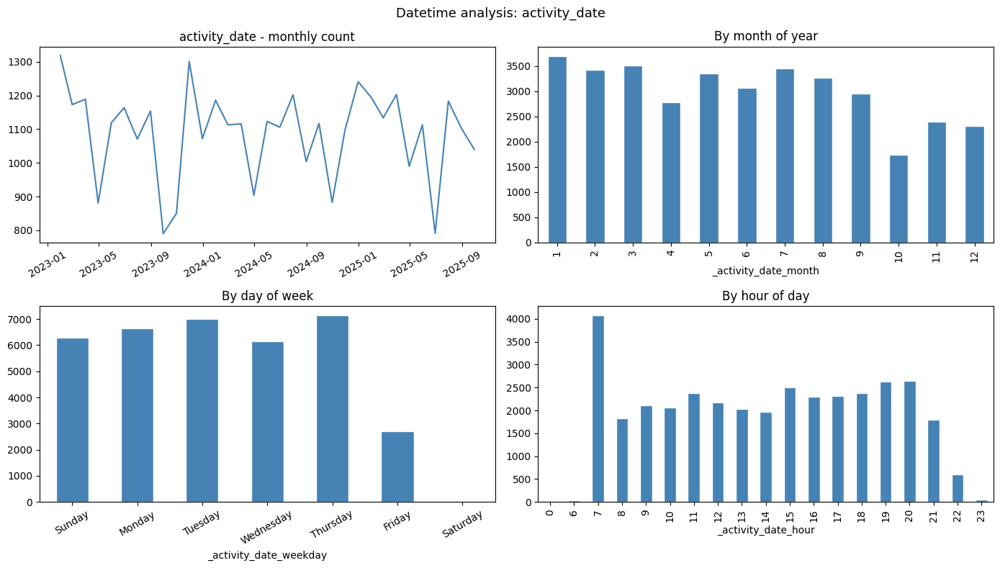


admission_date:
Range: <bound method Series.min of 0       2022-12-31 19:43:41
1       2023-01-01 07:24:00
2       2023-01-01 05:59:08
3       2022-12-31 18:51:34
4       2023-01-01 08:50:00
                ...        
35920   2025-09-30 16:52:08
35921   2025-09-30 18:13:00
35922   2025-09-30 16:58:00
35923   2025-09-30 17:42:00
35924   2025-09-30 15:48:22
Name: admission_date, Length: 35925, dtype: datetime64[ns]> --> 2025-09-30 18:27:22
Missing: 64
Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\014_Datetime_analysis__admission_date.png


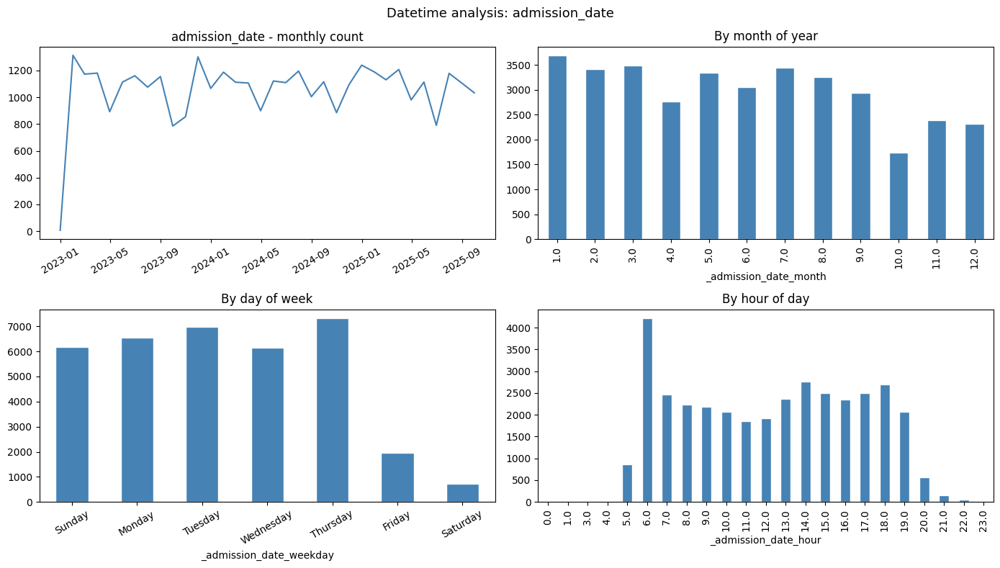


discharge_date:
Range: <bound method Series.min of 0       2023-01-10 09:08:00
1       2023-01-01 19:21:00
2       2023-01-03 10:25:00
3       2023-01-08 15:14:00
4       2023-01-01 16:36:00
                ...        
35920   2025-10-01 09:43:00
35921   2025-10-01 11:25:00
35922   2025-10-01 12:35:00
35923   2025-10-01 11:18:00
35924   2025-10-01 11:13:00
Name: discharge_date, Length: 35925, dtype: datetime64[ns]> --> 2025-12-08 14:14:00
Missing: 64
Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\015_Datetime_analysis__discharge_date.png


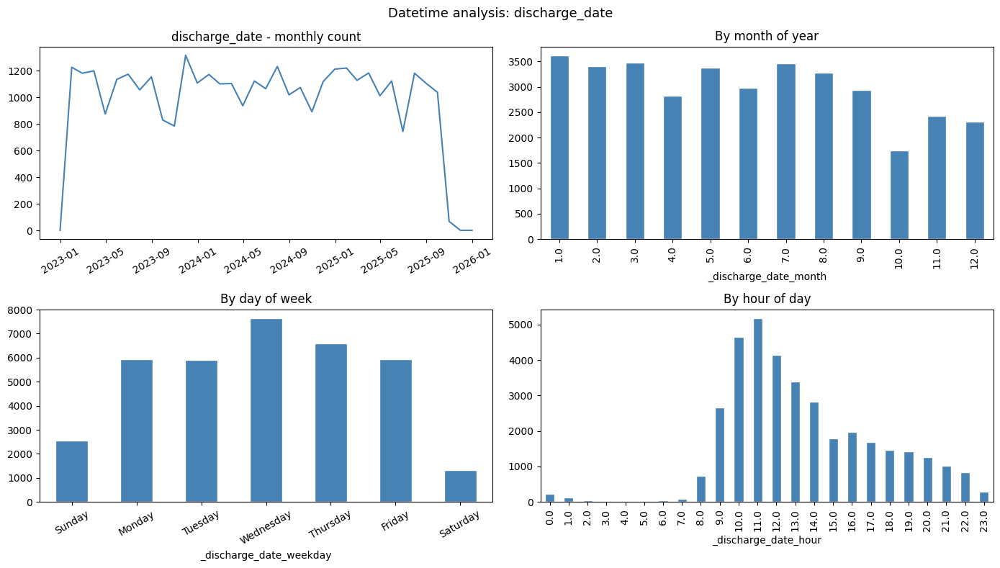


readmission_activity_date:
Range: <bound method Series.min of 0       NaT
1       NaT
2       NaT
3       NaT
4       NaT
         ..
35920   NaT
35921   NaT
35922   NaT
35923   NaT
35924   NaT
Name: readmission_activity_date, Length: 35925, dtype: datetime64[ns]> --> 2025-10-28 12:14:00
Missing: 35377
Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\016_Datetime_analysis__readmission_activity_date.png


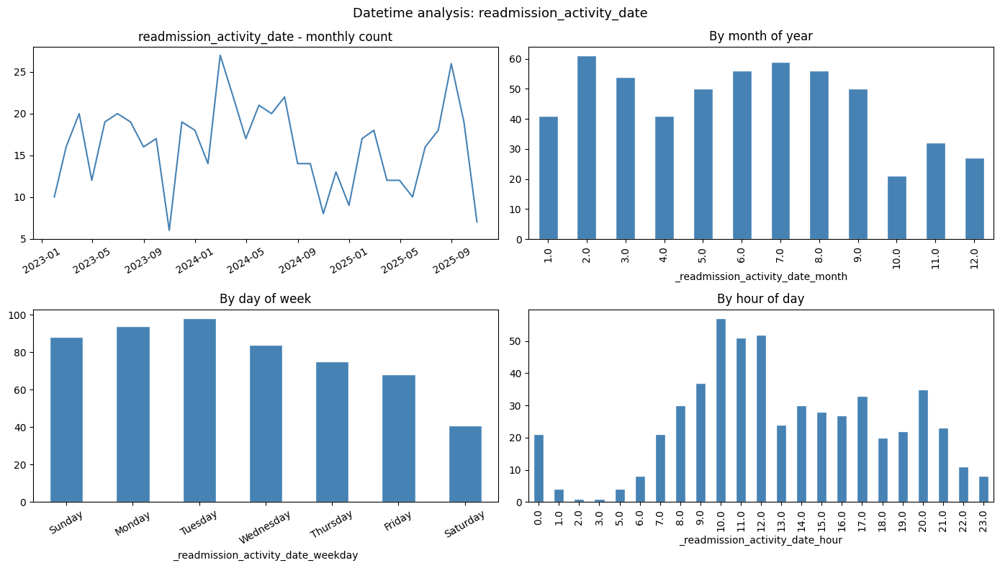

In [161]:
#Only central datetime columns are used for delited visualizations:
important_datetime_cols = [
    "activity_date",
    "admission_date",
    "discharge_date",
    "readmission_activity_date"
]

#Keep only columns that actually exist in the dataframe
important_datetime_cols = [
    col for col in important_datetime_cols
    if col in df.columns
]

if important_datetime_cols:
    for col in important_datetime_cols:
        df[col] = pd.to_datetime(df[col], errors="coerce")
        if df[col].notna().sum() == 0:
            print(f"Skipping {col} - no valid datetime values")
            continue
        print(f"\n{col}:")
        print(f"Range: {df[col].min} --> {df[col].max()}")
        print(f"Missing: {df[col].isnull().sum()}")

        # Extarct time components for pattern analysis
        df[f"_{col}_year"] = df[col].dt.year
        df[f"_{col}_month"] = df[col].dt.month
        df[f"_{col}_weekday"] = df[col].dt.day_name()
        df[f"_{col}_hour"] = df[col].dt.hour

        fig, axes = plt.subplots(2,2, figsize=(14,8))

        #Monthly trend line
        monthly = (df[df[col].notna()].set_index(col).resample("ME").size())
        if monthly.empty:
            axes[0,0].text(0.5, 0.5, "No data", ha="center", va="center")
            axes[0,0].set_title(f"{col} - no valid dates.")
        else:
            axes[0,0].plot(monthly.index, monthly.values, color="steelblue")
            axes[0,0].set_title(f"{col} - monthly count")
            axes[0,0].tick_params(axis="x", rotation =30)

        # By month of year
        df.groupby(f"_{col}_month").size().plot(
            kind="bar", ax=axes[0,1], color="steelblue", edgecolor="white")
        axes[0,1].set_title("By month of year")

        # By day of week
        dow_order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"]
        (df[f"_{col}_weekday"].value_counts()
         .reindex(dow_order, fill_value=0)
         .plot(kind="bar", ax=axes[1,0], color="steelblue", edgecolor="white"))
        axes[1,0].set_title("By day of week")
        axes[1,0].tick_params(axis="x", rotation=30)

        # By hour of day
        df.groupby(f"_{col}_hour").size().plot(
            kind="bar", ax=axes[1,1], color="steelblue", edgecolor="white")
        axes[1,1].set_title("By hour of day")

        plt.suptitle(f"Datetime analysis: {col}", fontsize=13)
        plt.tight_layout()
        plt.show()
        plt.close(fig)

## Textual columns

We have 29 text columns, three of them are treated differently:

- 23 Standart columns- get a top n frequency table 
- 3 columns ('first_hospitalization_disease_history', 'description_surgical_procedure', 'description_first_evaluation_postop') contains long free-text medical narratives. They are not visualized with a Top n table here, because every value is unique.
These columns are intead scored by a separate NLP model, whose output (an infection probability score) will be added to the final feature table.
- 3 columns ('preop_regular_medications', 'past_surgery_first_hospitalization', 'first_hospitalization_main_complaint') are also too high-cardinality for a meaningful Top n tables, but their content is shorter and more technical than a full narrative. Rather than runing the full NLP model on them, they will get lightweight engineered features (e.g. presence flags or keyword counts) durring Feature Engineering. 

In [162]:
NLP_PENDING_TEXT_COLS = [ 'first_hospitalization_disease_history', 
                         'description_surgical_procedure', 
                         'description_first_evaluation_postop'
                         ]

SIMPLE_FEATURE_TEXT_COLS = ['preop_regular_medications', 
                            'past_surgery_first_hospitalization', 
                            'first_hospitalization_main_complaint'
                            ]

Skipping top n  table/plot for preop_regular_medications - to high cardinality; lightweith features planned later
Skipping top n  table/plot for first_hospitalization_main_complaint - to high cardinality; lightweith features planned later
Skipping top n  table/plot for first_hospitalization_disease_history - deffered to NLP pipeline
Skipping top n  table/plot for description_surgical_procedure - deffered to NLP pipeline
Skipping top n  table/plot for description_first_evaluation_postop - deffered to NLP pipeline

Text univariate summary:


,column,missing_percent,unique_non_missing_values,median_text_length
0,actual_activity,0.000000,152,23.0
1,case_number,0.000000,35925,8.0
2,surgeon_code,0.033403,396,9.0
3,anasthesiologist_code,2.379958,197,9.0
4,payment _by,0.000000,65,12.0
5,home_town,35.476688,694,7.0
6,diagnosis_1,7.796799,1277,25.0
7,diagnosis_icd9_1,8.066806,625,5.0
8,diagnosis_2,66.290884,1029,20.0
9,diagnosis_icd9_2,66.290884,603,5.0


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\017_Text_Distributions_-_Standart_columns.png


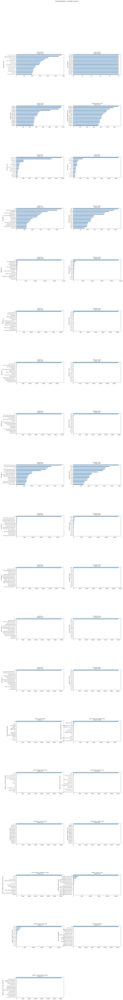

In [ ]:
def text_univariate_summary(df, text_cols):
    """
    INFO:
    for each columns:
    - report missingness, unique-value count, and median text-length
    - for columns in SIMPLE_FEATURE_TEXT_COL only missingness/lenth are reported
    """
    summary_rows = []
    normal_cols = []

    for col in text_cols:
        if col not in df.columns:
            continue

        original = df[col]
        missing = original.isna() | original.astype(str).str.strip().eq("")
        cleaned = original.fillna("Missing").astype(str).str.strip()
        cleaned = cleaned.mask(cleaned.eq(""), "Missing")
        non_missing = cleaned[cleaned.ne("Missing")]

        summary_rows.append({
            "column": col,
            "missing_percent": missing.mean() * 100,
            "unique_non_missing_values": non_missing.nunique(),
            "median_text_length": (non_missing.str.len().median()
                                   if not non_missing.empty else np.nan)
        })

        if col in NLP_PENDING_TEXT_COLS:
            print(f"Skipping top n  table/plot for {col} - deffered to NLP pipeline")
            continue

        if col in SIMPLE_FEATURE_TEXT_COLS:
            print(f"Skipping top n  table/plot for {col} - to high cardinality; lightweith features planned later")
            continue

        normal_cols.append(col)

    summary_df = pd.DataFrame(summary_rows)
    print("\nText univariate summary:")
    display(summary_df)

    if normal_cols:
        plot_bar_grid(df, normal_cols, title="Text Distributions - Standart columns",
                      n_cols=2, col_w=8, row_h=8, orientation="horizontal")

    return summary_df


text_univariate_summary_df = text_univariate_summary(df, text_cols)

# 3 – Bivariate Analysis

## 3.1 Bivariate helper functions

The section uses a small set of shared statistical helpers and concise analysis functions. Numeric, categorical, Boolean, datetime, text and missingness analyses all use consistent testing rules and multiple-testing correction.

In [ ]:
# BIVARIATE CONFIGURATION
TARGET_COL = "target_binary"
INFECTION_COLS = [
    "added1_infection diagnosis",
    "clinical SSI diagnosis",
]
TEXT_TOP_N = 20
MIN_CATEGORY_COUNT = 10

# SHARED STATISTICAL HELPERS

def apply_fdr_bh(result, p_col="p_value"):
    """
    INFO:
    Apply Benjamini-Hochberg FDR correction after testing multiple variables.
    This reduces false-positive findings caused by running many statistical tests.
    """
    if result.empty or p_col not in result.columns:
        return result

    result = result.sort_values(p_col).reset_index(drop=True)
    n = len(result)
    ranks = np.arange(1, n + 1)

    adjusted = result[p_col].to_numpy() * n / ranks
    adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]

    result["fdr_bh_p_value"] = np.clip(adjusted, 0, 1)
    result["significant_fdr_0.05"] = result["fdr_bh_p_value"] < 0.05

    return result


def categorical_association_test(contingency):
    """
    INFO:
    Test association between two categorical variables.

    Statistical methods:
    - Chi-Square is used when expected cell counts are adequate.
    - Fisher's exact test replaces Chi-Square only for sparse 2x2 tables.
    - Cramer's V reports association strength, because a p-value alone does not
      indicate whether the relationship is weak or strong.
    """
    if contingency.shape[0] < 2 or contingency.shape[1] < 2:
        return None

    chi2, chi_p, dof, expected = stats.chi2_contingency(contingency)
    sparse = (expected < 5)
    sparse_percent = sparse.mean() * 100

    if contingency.shape == (2, 2) and sparse.any():
        statistic, p_value = stats.fisher_exact(contingency.to_numpy())
        test_name = "Fisher exact"
    else:
        statistic, p_value = chi2, chi_p
        test_name = "Chi-Square"

    n = contingency.to_numpy().sum()
    min_dimension = min(contingency.shape) - 1
    cramers_v = (
        np.sqrt(chi2 / (n * min_dimension))
        if n > 0 and min_dimension > 0
        else np.nan
    )

    return {
        "test": test_name,
        "statistic": statistic,
        "degrees_of_freedom": dof,
        "p_value": p_value,
        "cramers_v": cramers_v,
        "minimum_expected_count": expected.min(),
        "expected_cells_below_5_percent": sparse_percent,
        "expected_count_warning": sparse_percent > 20,
    }


def compare_numeric_groups(group_0, group_1):
    """
    INFO:
    Compare one numeric variable between target groups.
    Statistical methods:
    - Shapiro-Wilk checks approximate normality in both groups.
    - Welch's t-test compares means when both groups are approximately normal
      and does not assume equal variances.
    - Mann-Whitney U is used for non-normal or skewed medical variables.
    """
    group_0 = pd.to_numeric(group_0, errors="coerce").dropna()
    group_1 = pd.to_numeric(group_1, errors="coerce").dropna()

    if len(group_0) < 10 or len(group_1) < 10:
        return None

    sample_0 = group_0.sample(min(len(group_0), 5000), random_state=42)
    sample_1 = group_1.sample(min(len(group_1), 5000), random_state=42)

    normal_0 = stats.shapiro(sample_0).pvalue > 0.05
    normal_1 = stats.shapiro(sample_1).pvalue > 0.05

    if normal_0 and normal_1:
        statistic, p_value = stats.ttest_ind(
            group_0,
            group_1,
            equal_var=False,
            nan_policy="omit",
        )
        test_name = "Welch t-test"
    else:
        statistic, p_value = stats.mannwhitneyu(
            group_0,
            group_1,
            alternative="two-sided",
        )
        test_name = "Mann-Whitney U"

    return {
        "test": test_name,
        "group_0_n": len(group_0),
        "group_1_n": len(group_1),
        "group_0_mean": group_0.mean(),
        "group_1_mean": group_1.mean(),
        "group_0_median": group_0.median(),
        "group_1_median": group_1.median(),
        "statistic": statistic,
        "p_value": p_value,
    }


# TARGET CREATION
def create_binary_target(df, infection_cols, target_col):
    """
    INFO:
    Create the postoperative infection target according to the clinical definition.
    0 = Both diagnosis columns are missing or empty.
    1 = At least one diagnosis column contains a value.
    This is a target-definition step, not a statistical test.
    """
    missing_cols = [col for col in infection_cols if col not in df.columns]

    if missing_cols:
        raise KeyError(f"Missing infection diagnosis columns: {missing_cols}")

    has_content = (
        df[infection_cols]
        .fillna("")
        .astype(str)
        .apply(lambda col: col.str.strip().ne(""))
    )

    result = df.copy()
    result[target_col] = has_content.any(axis=1).astype(int)

    return result

def _non_empty_or_positive_indicator(series, positive_values=None):
    if positive_values is None:
        return series.isin(positive_values).astype(int)
    cleaned = series.fillna("").astype(str).str.strip()
    return cleaned.ne("").astype(int)

def plot_target_balance(df, target_col):
    """
    INFO:
    Display target counts and percentages to identify possible class imbalance.
    This is descriptive analysis and does not require a statistical test.
    """
    counts = df[target_col].value_counts().sort_index()
    summary = pd.DataFrame({
        "count": counts,
        "percent": (counts / len(df) * 100).round(3),
    })

    display(summary)

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    summary["count"].plot(kind="bar", ax=axes[0], title="Target Counts")
    summary["percent"].plot(kind="bar", ax=axes[1], title="Target Percentages")
    axes[0].set_ylabel("Count")
    axes[1].set_ylabel("Percent")
    plt.tight_layout()
    plt.show()

    return summary


# ------------------------------------------------------------------
# NUMERIC VS TARGET
# ------------------------------------------------------------------

def numeric_vs_target(df, numeric_cols, target_col, max_features=30):
    """
    INFO:
    Compare numeric variables with the binary target.

    Boxplots provide a distribution-based visual comparison.
    The statistical test is selected by compare_numeric_groups():
    Welch's t-test for approximately normal groups, otherwise Mann-Whitney U.
    FDR correction is applied across all tested numeric variables.
    """
    eligible = [
        col for col in numeric_cols
        if col in df.columns and df[col].notna().sum() >= 30
    ][:max_features]

    rows = []

    for col in eligible:
        test_result = compare_numeric_groups(
            df.loc[df[target_col] == 0, col],
            df.loc[df[target_col] == 1, col],
        )

        if test_result is not None:
            rows.append({"column": col, **test_result})

    result = apply_fdr_bh(pd.DataFrame(rows))
    display(result.head(50))

    for start in range(0, len(eligible), 12):
        batch = eligible[start:start + 12]
        fig, axes = make_grid(len(batch), n_cols=3, col_w=5, row_h=4)

        for i, col in enumerate(batch):
            plot_df = df[[target_col, col]].copy()
            plot_df[col] = pd.to_numeric(plot_df[col], errors="coerce")
            sns.boxplot(data=plot_df.dropna(), x=target_col, y=col, ax=axes[i])
            axes[i].set_title(col, fontsize=9)

        hide_unused(axes, len(batch) - 1)
        fig.suptitle("Numeric Features vs Infection Target", fontsize=14)
        fig.tight_layout(rect=[0, 0, 1, 0.97])
        plt.show()

    return result

# ------------------------------------------------------------------
# CATEGORICAL AND BOOLEAN VS TARGET
# ------------------------------------------------------------------

def categorical_vs_target(
    df,
    categorical_cols,
    target_col,
    max_categories=20,
    min_category_count=10,
    title="Categorical",
):
    """
    INFO:
    Compare categorical variables with the binary target.
    Rare categories are grouped as 'Other' to reduce sparse contingency tables.
    Chi-Square tests association with the target. Fisher's exact test is used
    only for sparse 2x2 tables. Cramer's V measures association strength.
    FDR correction is applied across all tested variables.
    """
    rows = []
    plot_tables = []

    for col in categorical_cols:
        if col not in df.columns:
            continue

        values = df[col].fillna("Missing").astype(str).str.strip()
        values = values.replace("", "Missing")

        counts = values.value_counts()
        frequent = counts[counts >= min_category_count].index[:max_categories]
        grouped = values.where(values.isin(frequent), "Other")
        if grouped.nunique() < 2:
            continue

        contingency = pd.crosstab(grouped, df[target_col])
        test_result = categorical_association_test(contingency)
        if test_result is None:
            continue

        rows.append({
            "column": col,
            "categories_after_grouping": grouped.nunique(),
            **test_result,
        })

        plot_tables.append((
            col,
            pd.crosstab(grouped, df[target_col], normalize="index") * 100,
        ))

    result = apply_fdr_bh(pd.DataFrame(rows))
    display(result.head(100))

    for start in range(0, len(plot_tables), 9):
        batch = plot_tables[start:start + 9]
        fig, axes = make_grid(len(batch), n_cols=3, col_w=7, row_h=4)

        for i, (col, table) in enumerate(batch):
            table.plot(kind="bar", stacked=True, ax=axes[i])
            axes[i].set_title(col, fontsize=8)
            axes[i].set_ylabel("Percent within category")
            axes[i].tick_params(axis="x", rotation=45, labelsize=7)
            axes[i].legend(fontsize=7)

        hide_unused(axes, len(batch) - 1)
        fig.suptitle(f"{title} Features vs Infection Target", fontsize=14)
        fig.tight_layout(rect=[0, 0, 1, 0.97])
        plt.show()

    return result

# ------------------------------------------------------------------
# DATETIME VS TARGET
# ------------------------------------------------------------------

def datetime_vs_target(df, datetime_cols, target_col):
    """
    INFO:
    Convert dates into year, month, weekday and quarter, then compare these
    derived categorical features with the binary target.

    Raw dates are not tested directly because their labels are not clinically
    interpretable categories. Chi-Square/Fisher and Cramer's V are applied
    through the shared categorical analysis function.
    """
    datetime_features = pd.DataFrame(index=df.index)

    for col in datetime_cols:
        if col not in df.columns:
            continue

        converted = pd.to_datetime(df[col], errors="coerce", dayfirst=True)

        candidates = {
            f"{col}__year": converted.dt.year,
            f"{col}__month": converted.dt.month,
            f"{col}__weekday": converted.dt.day_name(),
            f"{col}__quarter": converted.dt.quarter,
        }

        for name, values in candidates.items():
            if values.nunique(dropna=True) > 1:
                datetime_features[name] = values

    if datetime_features.empty:
        print("No eligible datetime features were created.")
        return datetime_features, pd.DataFrame()

    analysis_df = pd.concat(
        [datetime_features, df[[target_col]]],
        axis=1,
    )

    result = categorical_vs_target(
        analysis_df,
        categorical_cols=datetime_features.columns.tolist(),
        target_col=target_col,
        max_categories=20,
        min_category_count=MIN_CATEGORY_COUNT,
        title="Datetime-Derived",
    )

    return datetime_features, result

def duration_vs_target(df_input, datetime_pairs, target_col):
    rows = []
    for event_name, (start_col, end_col) in datetime_pairs.items():
        if start_col not in df_input.columns or end_col not in df_input.columns:
            continue
        both_mask = df_input[start_col].notna() & df_input[end_col].notna()
        duration_hours = (df_input.loc[both_mask, end_col] - df_input.loc[both_mask, start_col]).dt.total_seconds() / 3600
        valid_duration = duration_hours[duration_hours >= 0]
        aligned_target = df_input.loc[valid_duration.index, target_col]
        group_0 = valid_duration[aligned_target == 0]
        group_1 = valid_duration[aligned_target == 1]
        result = compare_numeric_groups(group_0, group_1)
        if result is None:
            continue
        result["clinical_event"] = event_name
        rows.append(result)
    duration_tests_df = pd.DataFrame(rows)
    if not duration_tests_df.empty:
        duration_tests_df = apply_fdr_bh(duration_tests_df)
    return duration_tests_df

def hours_from_reference_vs_target (df_input, date_col, target_col, reference_col="activity_date"):
    if date_col not in df_input.columns or reference_col not in df_input.columns:
        return None
    valid_mask = df_input[date_col].notna() & df_input[reference_col].notna()
    hours_from_surgery = (df_input.loc[valid_mask, date_col] - df_input.loc[valid_mask, reference_col]).dt.total_seconds() / 3600
    aligned_target = df_input.loc[hours_from_surgery.index, target_col]
    group_0 = hours_from_surgery[aligned_target == 0]
    group_1 = hours_from_surgery[aligned_target == 1]
    result = compare_numeric_groups(group_0, group_1)
    if result is None:
        return None
    result["date_column"] = date_col
    return result

def datetime_timing_vs_target(df_input, target_col, reference_col="activity_date"):
    rows=[]
    for lab_name, (first_col, last_col) in lab_date_pairs.items():
        for role, col in [("first", first_col), ("last", last_col)]:
            result = hours_from_reference_vs_target(df_input, col, target_col,reference_col)
            if result is None:
                continue
            result["group"] = f"Lab: {lab_name} ({role})"
            rows.append(result)

    culture_groups = {
        "Blood culture": blood_culture_date_cols,
        "Urine culture": urine_culture_date_cols,
        "Additional / wound culture": additional_culture_date_cols
    }
    for culture_type, cols in culture_groups.items():
        result = hours_from_reference_vs_target(df_input, col, target_col, reference_col)
        if result is None:
            continue
        result["group"] = f"{culture_type}: {col}"
        rows.append(result)

    for event_name, col in single_event_dates.copy
        result = hours_from_reference_vs_target(df_input, col, target_col, reference_col)
        if result is None:
            continue
        result["group"] = f"Single event: {event_name}"
        rows.append(result)

    timing_tests_df = pd.Dataframe(rows)
    if not timing_tests_df.empty:
        timing_tests_df = apply_fdr_bh(timing_tests_df)
    return timing_tests_df

        
# ------------------------------------------------------------------
# TEXT VS TARGET
# ------------------------------------------------------------------

def text_vs_target(df, text_cols, target_col, top_n=20):
    """
    INFO:
    Summarize and compare repeated text values with the binary target.
    For each text column:
    - Report missingness, unique-value count and median text length.
    - Select the Top N values by frequency in the entire dataset, not only among
      positive patients, to avoid outcome-based selection.
    - Report positive count, negative count and infection rate for each Top value.
    - Group remaining values as 'Other' and test association using the shared
      Chi-Square/Fisher logic with Cramer's V and FDR correction.
    """
    summary_rows = []
    test_rows = []
    top_tables = {}

    for col in text_cols:
        if col not in df.columns:
            continue

        original = df[col]
        missing = original.isna() | original.astype(str).str.strip().eq("")
        cleaned = original.fillna("Missing").astype(str).str.strip()
        cleaned = cleaned.mask(cleaned.eq(""), "Missing")

        non_missing = cleaned[cleaned.ne("Missing")]
        top_values = non_missing.value_counts().head(top_n).index
        grouped = cleaned.where(
            cleaned.isin(top_values) | cleaned.eq("Missing"),
            "Other",
        )

        summary_rows.append({
            "column": col,
            "missing_percent": missing.mean() * 100,
            "unique_non_missing_values": non_missing.nunique(),
            "median_text_length": (
                non_missing.str.len().median()
                if not non_missing.empty
                else np.nan
            ),
            "top_values_coverage_percent": (
                non_missing.isin(top_values).mean() * 100
                if not non_missing.empty
                else np.nan
            ),
        })

        top_df = pd.DataFrame({
            "value": top_values,
            "total_count": [int((cleaned == value).sum()) for value in top_values],
            "positive_count": [
                int(((cleaned == value) & (df[target_col] == 1)).sum())
                for value in top_values
            ],
        })
        top_df["negative_count"] = (
            top_df["total_count"] - top_df["positive_count"]
        )
        top_df["infection_rate_percent"] = (
            top_df["positive_count"] / top_df["total_count"] * 100
        )

        top_tables[col] = top_df
        print(f"\nTop {top_n} overall values: {col}")
        display(top_df)

        if not top_df.empty:
            plot_df = top_df.head(10).sort_values("infection_rate_percent")
            plt.figure(figsize=(10, max(4, len(plot_df) * 0.45)))
            plt.barh(
                plot_df["value"].astype(str),
                plot_df["infection_rate_percent"],
            )
            plt.xlabel("Infection Rate (%)")
            plt.ylabel("Value")
            plt.title(f"Infection Rate for Top Overall Values: {col}")
            plt.tight_layout()
            plt.show()

        contingency = pd.crosstab(grouped, df[target_col])
        test_result = categorical_association_test(contingency)

        if test_result is not None:
            test_rows.append({
                "column": col,
                "categories_after_grouping": grouped.nunique(),
                **test_result,
            })

    summary_df = pd.DataFrame(summary_rows)
    tests_df = apply_fdr_bh(pd.DataFrame(test_rows))

    print("\nText summary:")
    display(summary_df)

    print("\nText association tests:")
    display(tests_df.head(100))

    return summary_df, top_tables, tests_df

# ------------------------------------------------------------------
# MISSINGNESS VS TARGET
# ------------------------------------------------------------------

def missingness_vs_target(df, target_col, exclude_cols=None):
    """
    INFO:
    Test whether Missing/Not Missing status is associated with the target.
    Missingness is converted into a binary categorical variable. The same shared
    Chi-Square/Fisher logic is used, with Cramer's V and FDR correction.
    This identifies documentation patterns and does not establish causality.
    """
    excluded = set(exclude_cols or [])
    rows = []

    for col in df.columns:
        if col == target_col or col in excluded:
            continue

        indicator = df[col].isna().map({False: "Not Missing", True: "Missing"})

        if indicator.nunique() < 2:
            continue

        contingency = pd.crosstab(indicator, df[target_col])
        test_result = categorical_association_test(contingency)

        if test_result is None:
            continue

        rows.append({
            "column": col,
            "target_0_missing_percent": (
                df.loc[df[target_col] == 0, col].isna().mean() * 100
            ),
            "target_1_missing_percent": (
                df.loc[df[target_col] == 1, col].isna().mean() * 100
            ),
            **test_result,
        })

    result = apply_fdr_bh(pd.DataFrame(rows))
    display(result.head(100))

    return result


## 3.2 Department-Level Infection Analysis Functions

In [165]:
def department_infection_summary(
    df_input: pd.DataFrame,
    department_col = "department",
    infection_col = "SSI SITE INFECTION",
    positive_values = None,
    include_missing_department = True,
    min_admissions = 1
):
    """
    INFO:
    Summarise the number of surgical admissions and SSI-positive admissions in each department.
    The output includes counts and the within-department infection rate.
    """
    missing = [col for col in [department_col, infection_col] if col not in df_input.columns]
    if missing:
        raise KeyError(f"Missing required columns: {missing}")

    work = df_input[[department_col, infection_col]].copy()
    work["ssi_positive"] = _non_empty_or_positive_indicator(
        work[infection_col], positive_values=positive_values
    )
    department = work[department_col].astype("string").str.strip()
    if include_missing_department:
        department = department.fillna("__MISSING_DEPARTMENT__").replace("", "__MISSING_DEPARTMENT__")
    work[department_col] = department

    result = (
        work.groupby(department_col, dropna=not include_missing_department)["ssi_positive"]
        .agg(total_surgical_admissions="size", infection_count="sum")
        .reset_index()
    )
    result["no_infection_count"] = (
        result["total_surgical_admissions"] - result["infection_count"]
    )
    result["infection_rate_percent"] = (
        result["infection_count"] / result["total_surgical_admissions"] * 100
    )
    result = result[result["total_surgical_admissions"] >= min_admissions].reset_index(drop=True)
    return result.sort_values(
        ["infection_rate_percent", "total_surgical_admissions"],
        ascending=[False, False],
    ).reset_index(drop=True)


def plot_department_infection_summary(
    summary: pd.DataFrame,
    department_col: str = "department",
    top_n = None,
) -> None:
    """INFO: Plot total admissions and SSI-positive admissions by department."""
    plot_df = summary.copy()
    if top_n is not None:
        plot_df = plot_df.head(top_n)
    plot_df = plot_df.sort_values("total_surgical_admissions")

    positions = np.arange(len(plot_df))
    width = 0.4
    fig, axes = plt.subplots(1, 2, figsize=(16, max(6, len(plot_df) * 0.35)))

    axes[0].barh(positions - width / 2, plot_df["total_surgical_admissions"], height=width, label="All admissions")
    axes[0].barh(positions + width / 2, plot_df["infection_count"], height=width, label="SSI-positive")

    short_labels = [(str(label)[:20]+"...") if len(str(label))>20 else str(label)
                    for label in plot_df[department_col]]

    axes[0].set_yticks(positions)
    axes[0].set_ytickslabels(plot_df[department_col])
    axes[0].set_xlabel("Number of surgical admissions")
    axes[0].set_title("Surgical Admissions and SSI-Positive Cases by Department")
    axes[0].legend()

    axes[1].barh(positions, plot_df["infection_rate_percent"], height=0.6, color="firerbick")
    axes[1].set_yticks(positions)
    axes[1].set_ytickslabels(plot_df[department_col])
    axes[1].set_xlabel("Infection Rate (%)")
    axes[1].set_title("SSI Infection Rate by Department")

    plt.tight_layout()
    plt.show()
    plt.close()


## 3.3 Run Bivariate Analysis

target_binary already exists - target creation skipped.


<>:119: SyntaxWarning: invalid escape sequence '\C'
<>:119: SyntaxWarning: invalid escape sequence '\C'
C:\Users\mtal\AppData\Local\Temp\3\ipykernel_17732\1944172496.py:119: SyntaxWarning: invalid escape sequence '\C'
  print("\Clinical event duration tests:")


,count,percent
target_binary,,
0,35784,99.608
1,141,0.392


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\018_Target_Counts.png


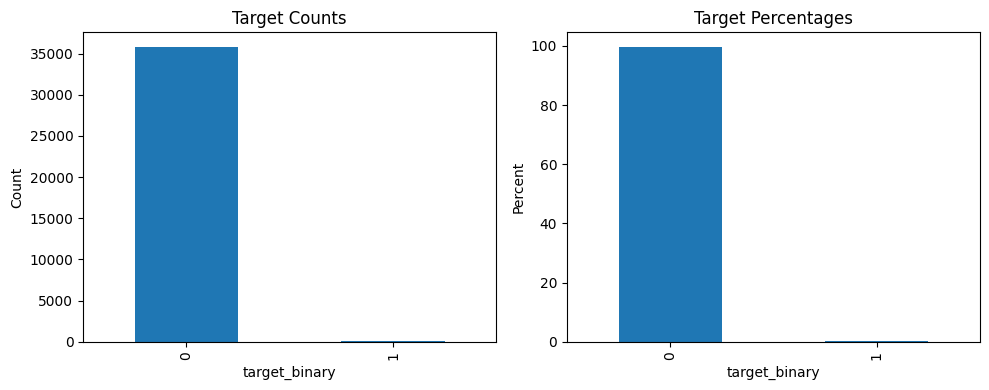

,column,test,group_0_n,group_1_n,group_0_mean,group_1_mean,group_0_median,group_1_median,statistic,p_value,effect_size_name,effect_size,fdr_bh_p_value,significant_fdr_0.05
0,length_of_stay_hrs,Mann-Whitney U,35720,141,42.194261,245.751773,23.000000,185.000000,327773.0,2.447827e-71,rank-biserial r,0.869841,1.174957e-69,True
1,added1_length_of_surgery,Mann-Whitney U,7056,84,118.428997,175.821429,80.000000,164.000000,108920.0,1.856746e-23,rank-biserial r,0.632464,4.456192e-22,True
2,readmission_length_of_stay,Mann-Whitney U,488,60,66.360656,226.566667,27.000000,175.500000,3935.0,2.236994e-20,rank-biserial r,0.731216,3.579190e-19,True
3,lab_hemoglobin_last_value_g/dL,Mann-Whitney U,9563,120,11.650580,10.355000,11.700000,10.100000,831711.0,2.310368e-17,rank-biserial r,-0.449529,2.772442e-16,True
4,added1_blood_and/or_wound_cultures_taken_2-90_...,Mann-Whitney U,404,101,7.634277,18.585033,4.499311,13.585058,9338.0,3.327768e-17,rank-biserial r,0.542300,3.194658e-16,True
5,max_heart_rate_last_24_hour_value,Mann-Whitney U,31823,110,103.259073,90.426636,102.000000,88.500000,2460942.0,1.782312e-13,rank-biserial r,-0.406040,1.425850e-12,True
6,age,Mann-Whitney U,35784,141,53.261490,64.167081,55.452338,65.119823,1668305.0,3.594300e-12,rank-biserial r,0.338702,2.464663e-11,True
7,added1_lowest_temp_in_surgery_value_(original),Mann-Whitney U,7024,80,35.198536,33.450000,36.100000,35.100000,397968.5,8.772343e-11,rank-biserial r,-0.416460,5.263406e-10,True
8,lab_k_last_value_mmol/L,Mann-Whitney U,9147,122,4.207022,4.032131,4.200000,4.010000,691491.0,5.421166e-06,rank-biserial r,-0.239304,2.891289e-05,True
9,median_systolic_BP_last_24_hours_value,Mann-Whitney U,33106,113,122.169174,128.858407,120.000000,128.000000,1410361.5,6.120477e-06,rank-biserial r,0.245993,2.937829e-05,True


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\019_Numeric_Features_vs_Infection_Target.png


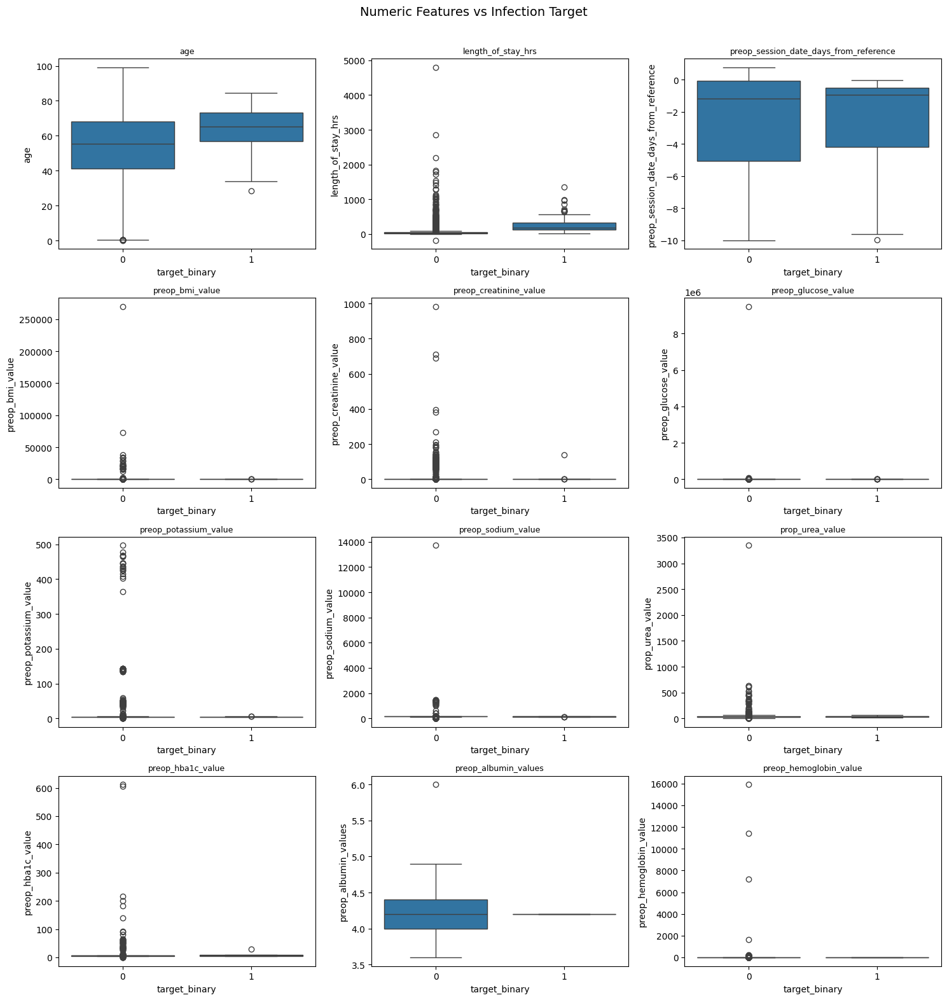

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\020_Numeric_Features_vs_Infection_Target.png


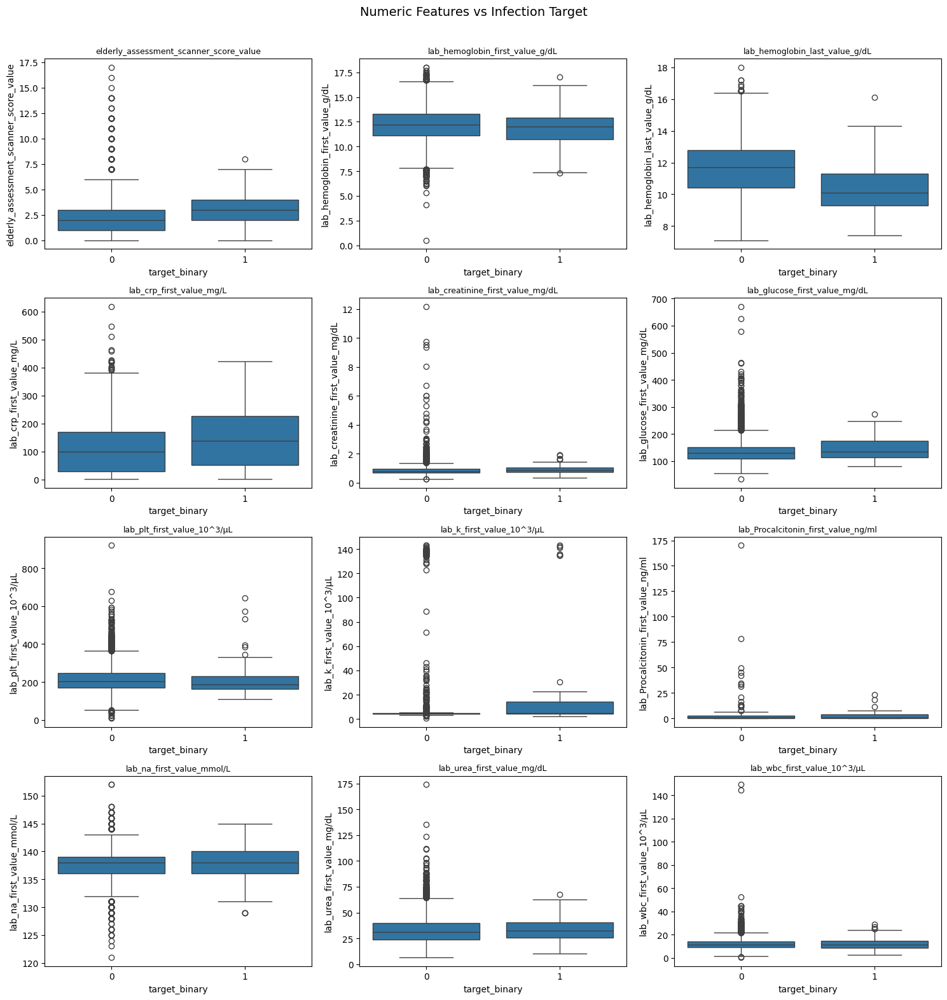

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\021_Numeric_Features_vs_Infection_Target.png


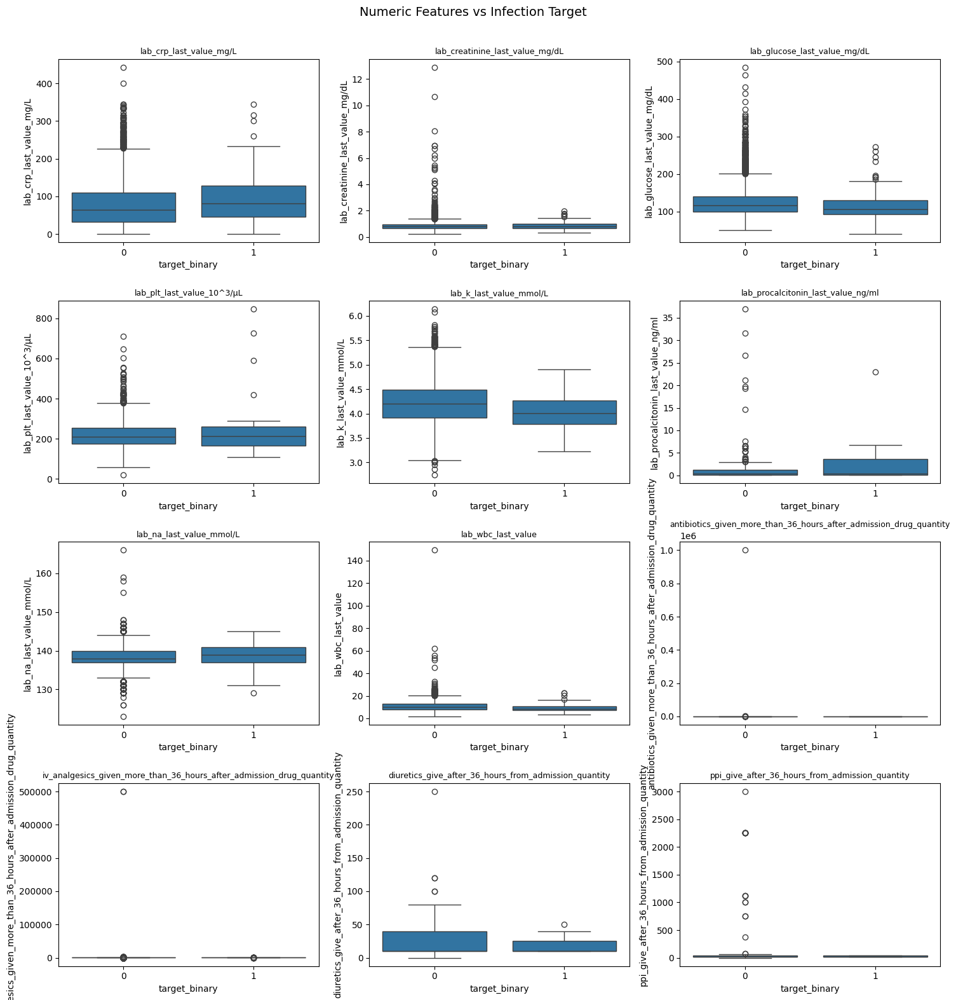

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\022_Numeric_Features_vs_Infection_Target.png


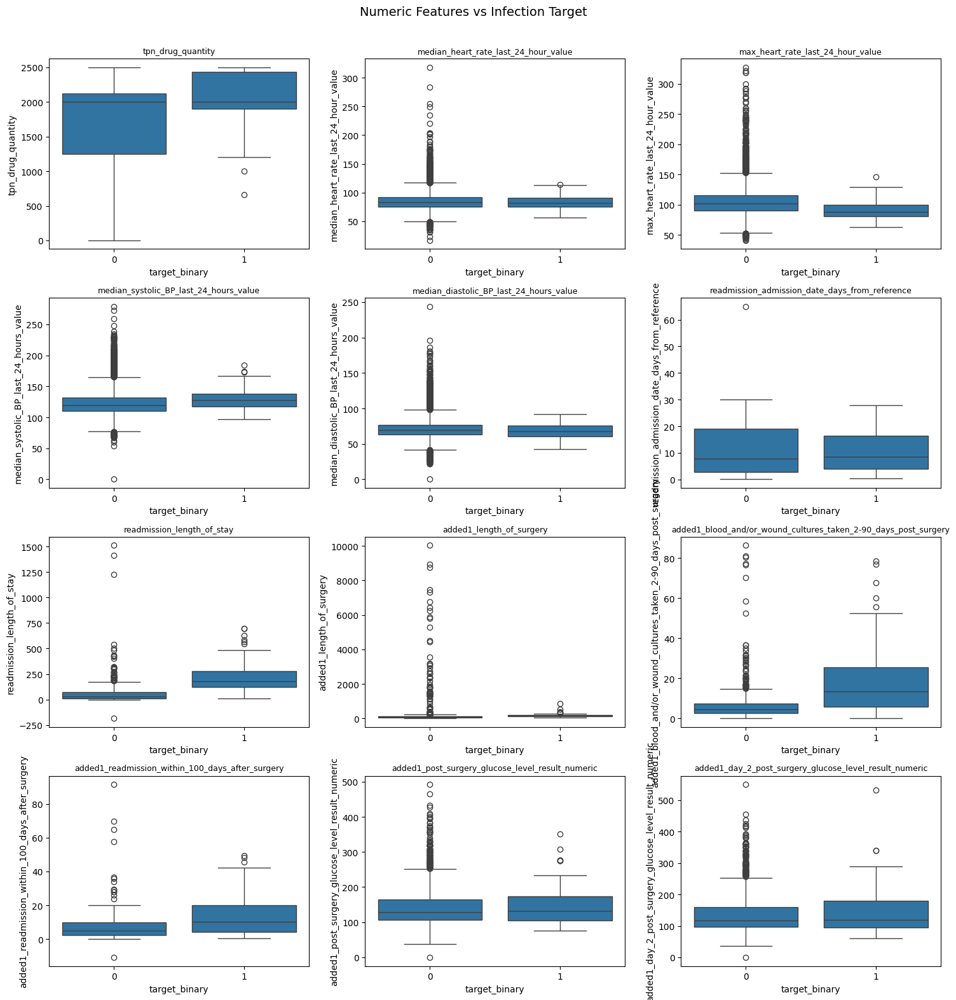

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\023_Numeric_Features_vs_Infection_Target.png


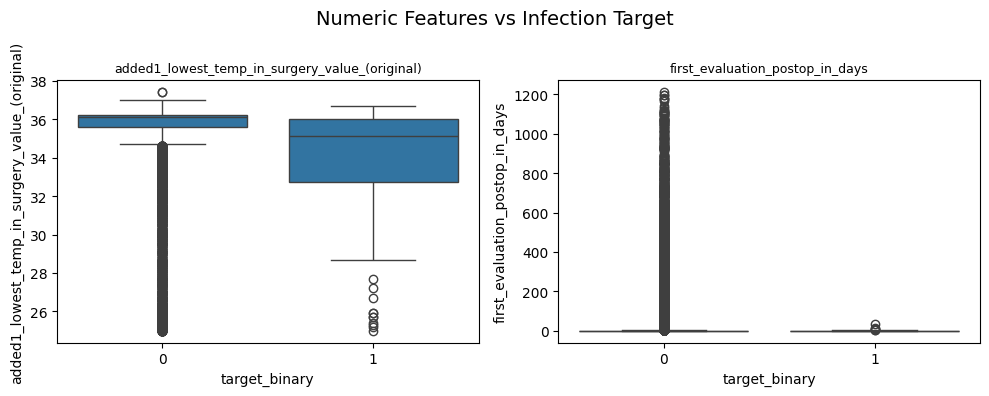

,column,categories_after_grouping,test,statistic,degrees_of_freedom,p_value,cramers_v,minimum_expected_count,expected_cells_below_5_percent,expected_count_warning,fdr_bh_p_value,significant_fdr_0.05
0,added1_wound_culture_test,4,Chi-Square,5146.424835,3,0.000000,0.378490,0.058873,37.500000,True,0.00000,True
1,added1_detected_pathogen_specimen_source,7,Chi-Square,5842.154734,6,0.000000,0.403263,0.054948,42.857143,True,0.00000,True
2,added1_wound_culture_result,7,Chi-Square,7535.620895,6,0.000000,0.457995,0.054948,42.857143,True,0.00000,True
3,readmission_activity_cluster,9,Chi-Square,2309.372167,8,0.000000,0.253541,0.058873,44.444444,True,0.00000,True
4,readmission_cause_value,5,Chi-Square,2359.922242,4,0.000000,0.256301,0.031399,40.000000,True,0.00000,True
...,...,...,...,...,...,...,...,...,...,...,...,...
59,common_disease_first_hospitalization_value_1,3,Chi-Square,0.165687,2,0.920495,0.002148,0.082422,33.333333,True,0.97282,False
60,discharge_destination,5,Chi-Square,0.866550,4,0.929310,0.004911,0.003925,40.000000,True,0.97282,False
61,preop_functional_assessment,4,Chi-Square,0.389420,3,0.942419,0.003292,0.082422,25.000000,True,0.97282,False
62,common_disease_first_hospitalization_value_2,2,Fisher exact,0.000000,1,1.000000,0.000000,0.019624,50.000000,True,1.00000,False


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\024_Categorical_Features_vs_Infection_Target.png


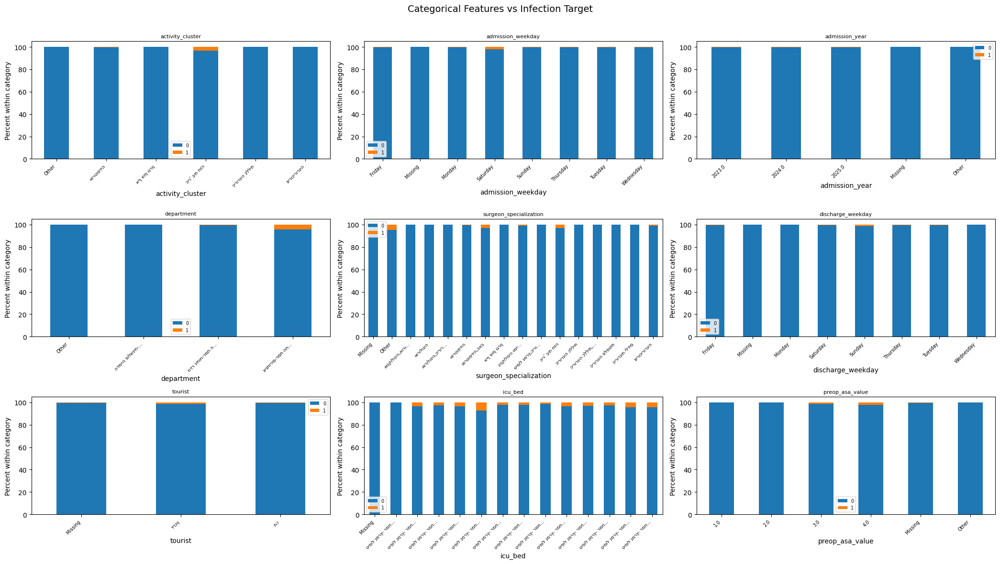

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\025_Categorical_Features_vs_Infection_Target.png


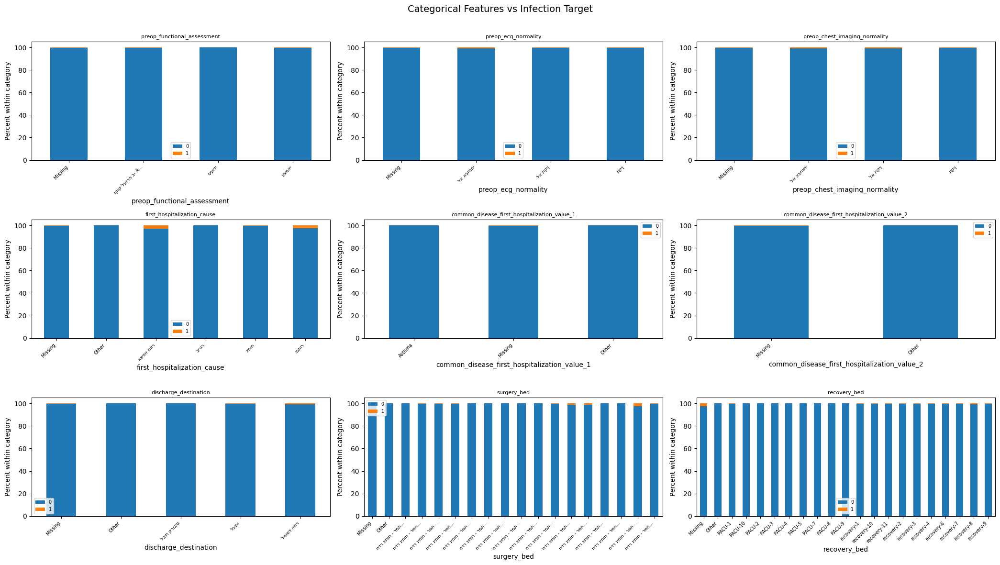

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\026_Categorical_Features_vs_Infection_Target.png


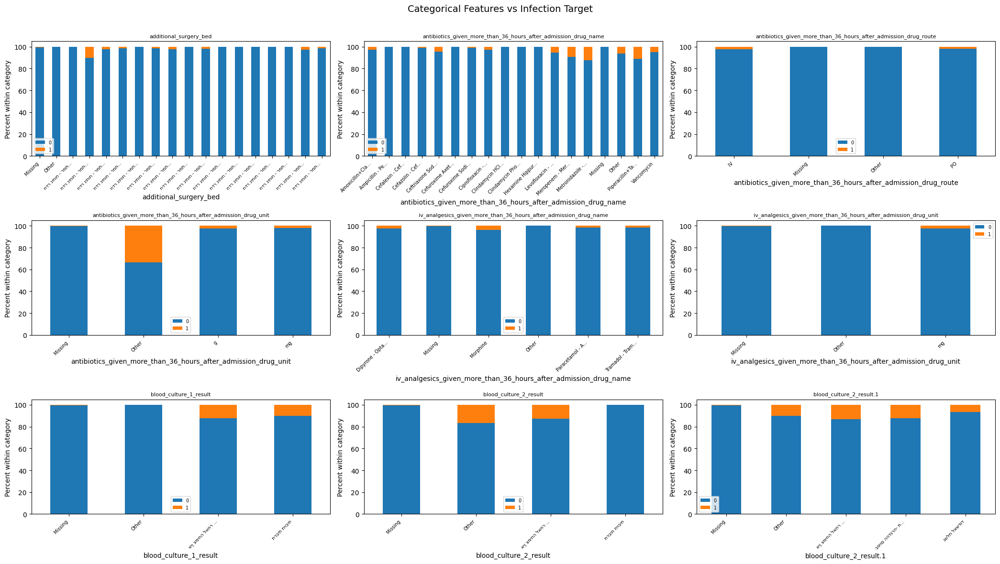

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\027_Categorical_Features_vs_Infection_Target.png


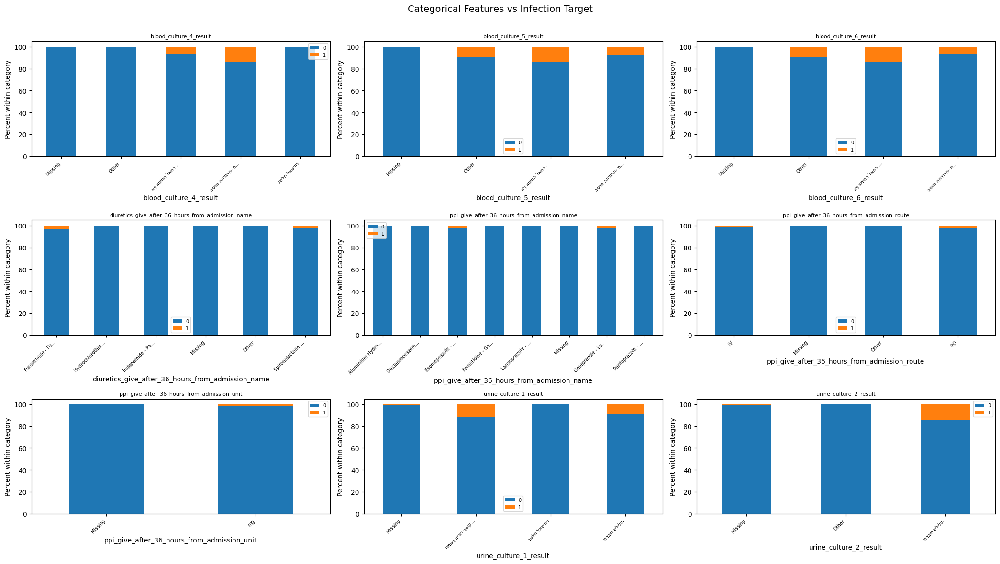

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\028_Categorical_Features_vs_Infection_Target.png


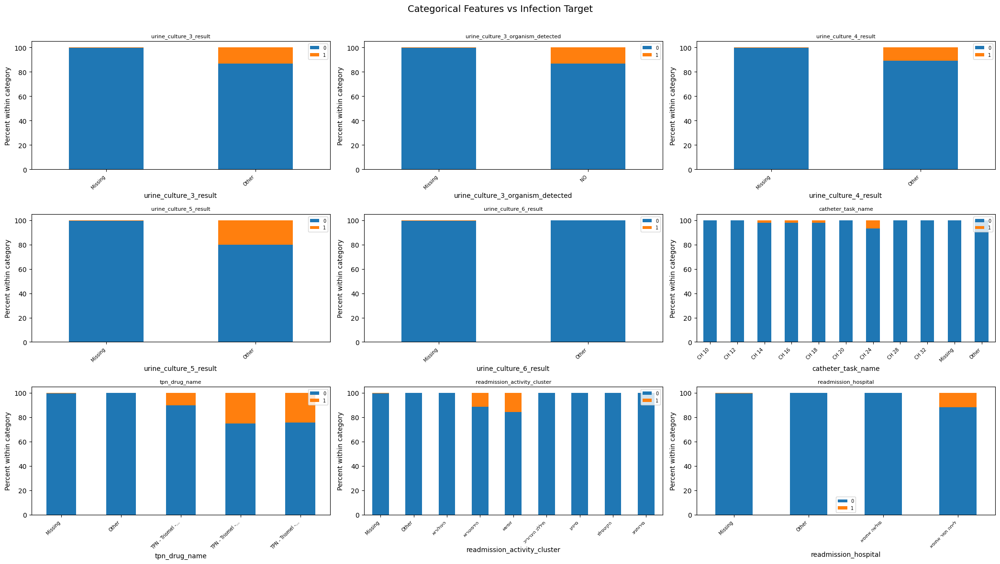

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\029_Categorical_Features_vs_Infection_Target.png


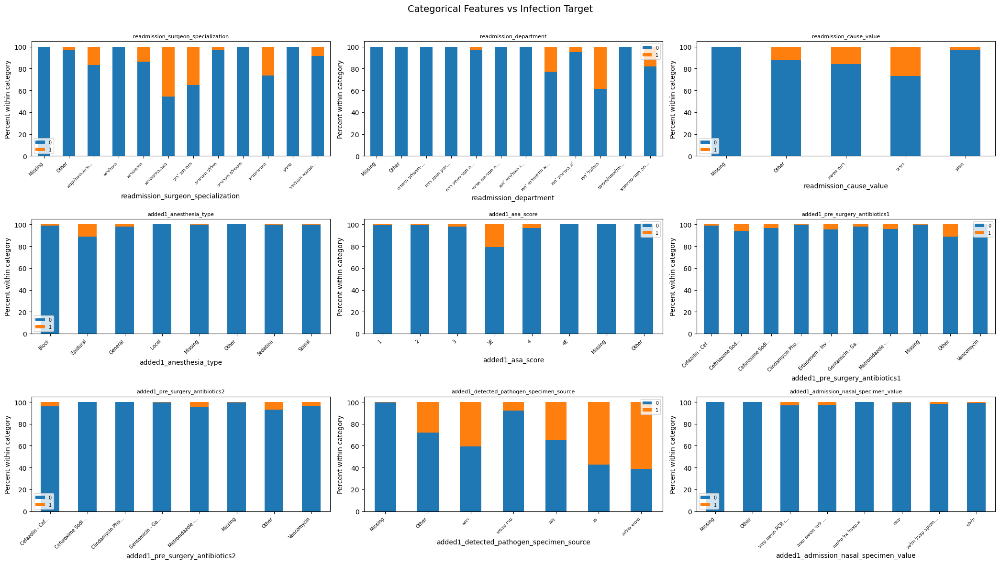

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\030_Categorical_Features_vs_Infection_Target.png


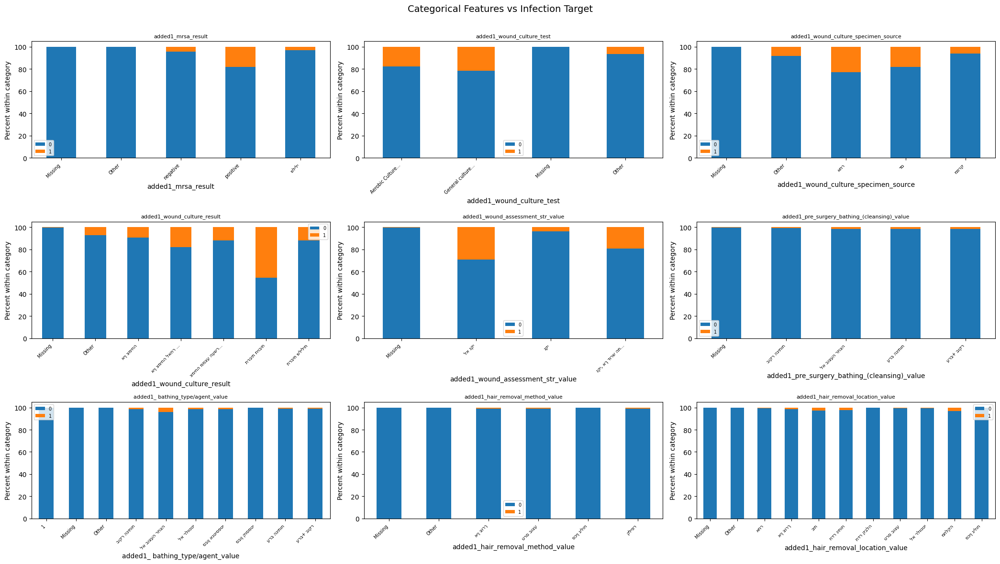

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\031_Categorical_Features_vs_Infection_Target.png


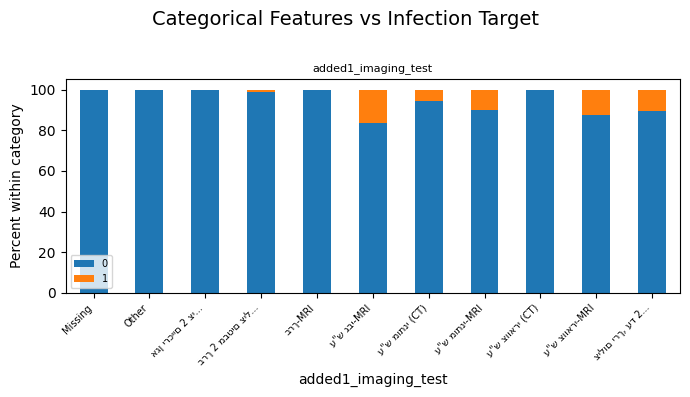

,column,categories_after_grouping,test,statistic,degrees_of_freedom,p_value,cramers_v,minimum_expected_count,expected_cells_below_5_percent,expected_count_warning,fdr_bh_p_value,significant_fdr_0.05
0,added1_wound_culture_organism_detected,3,Chi-Square,6805.398481,2,0.000000e+00,0.435240,0.588727,33.333333,True,0.000000e+00,True
1,blood_culture_1_test_panel,3,Chi-Square,794.476053,2,3.031915e-173,0.148711,0.007850,50.000000,True,5.154256e-172,True
2,blood_culture_4_test_panel,3,Chi-Square,758.785558,2,1.705334e-165,0.145332,0.011775,50.000000,True,1.932712e-164,True
3,blood_culture_2_test_panel,3,Chi-Square,728.652295,2,5.958879e-159,0.142417,0.054948,33.333333,True,4.052038e-158,True
4,blood_culture_3_test_panel,3,Chi-Square,728.652295,2,5.958879e-159,0.142417,0.054948,33.333333,True,4.052038e-158,True
5,catheter_route,3,Chi-Square,505.671598,2,1.566057e-110,0.118641,0.435658,16.666667,False,8.874326e-110,True
6,iv_analgesics_given_more_than_36_hours_after_a...,2,Chi-Square,486.531477,1,8.100815e-108,0.116374,18.415365,0.000000,False,3.934681e-107,True
7,blood_culture_6_test_panel,3,Chi-Square,472.195119,2,2.911607e-103,0.114647,0.054948,33.333333,True,1.237433e-102,True
8,blood_culture_5_test_panel,3,Chi-Square,463.762443,2,1.973627e-101,0.113619,0.003925,50.000000,True,7.455924e-101,True
9,diuretics_give_after_36_hours_from_admission_r...,3,Chi-Square,442.443466,2,8.406633e-97,0.110976,3.194823,33.333333,True,2.858255e-96,True


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\032_Boolean_Features_vs_Infection_Target.png


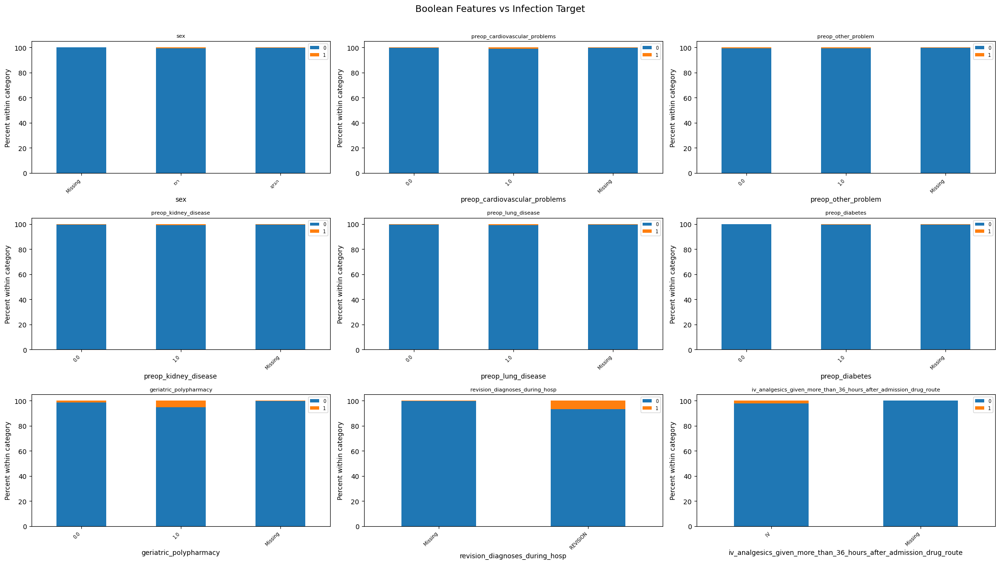

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\033_Boolean_Features_vs_Infection_Target.png


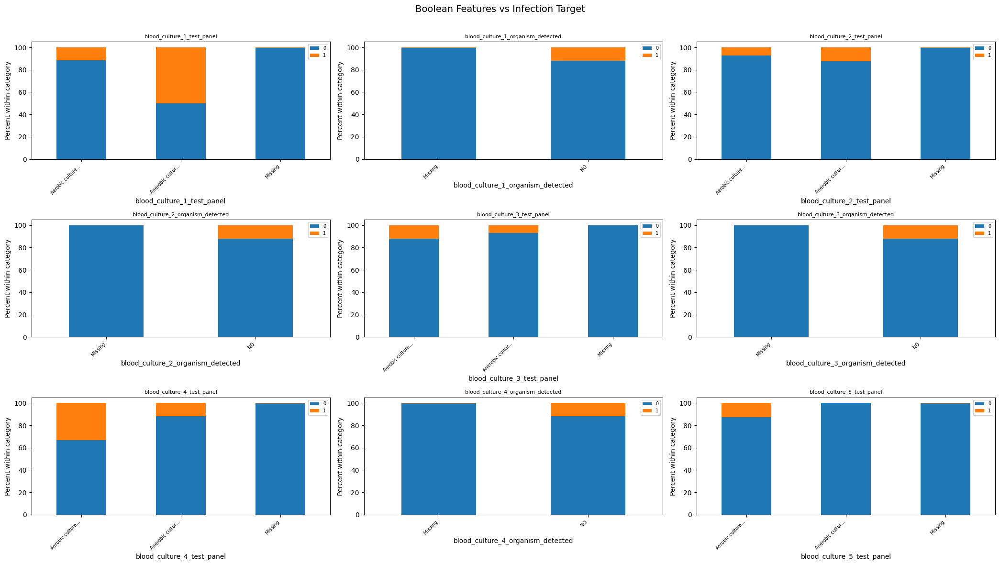

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\034_Boolean_Features_vs_Infection_Target.png


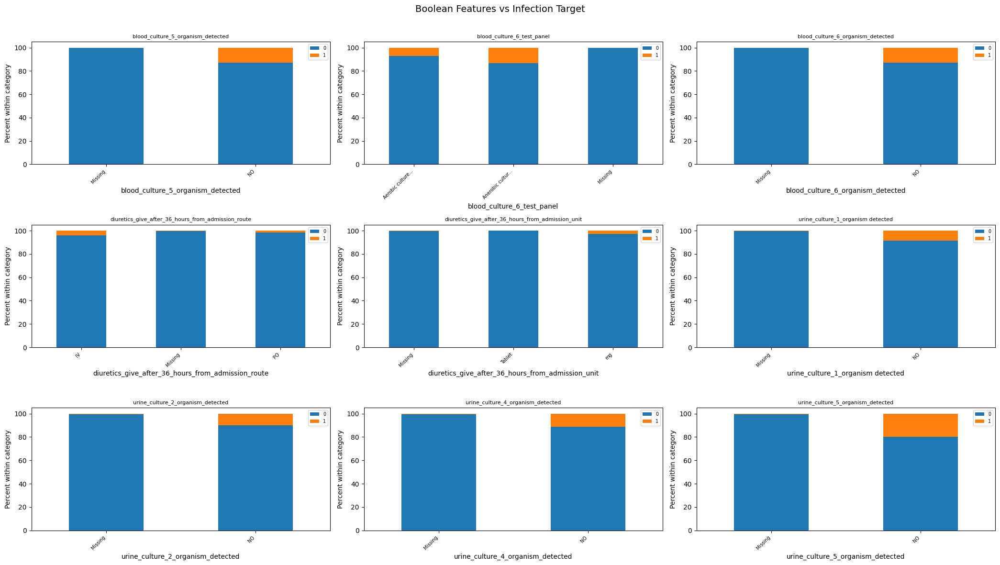

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\035_Boolean_Features_vs_Infection_Target.png


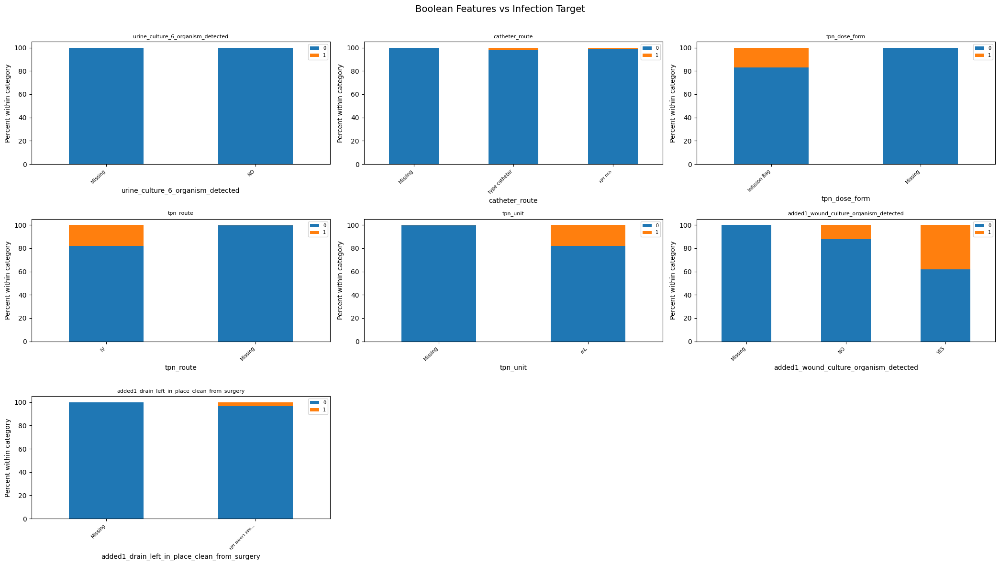

,column,categories_after_grouping,test,statistic,degrees_of_freedom,p_value,cramers_v,minimum_expected_count,expected_cells_below_5_percent,expected_count_warning,fdr_bh_p_value,significant_fdr_0.05
0,readmission_activity_date__year,4,Chi-Square,1715.130832,3,0.000000e+00,0.218499,0.608351,37.500000,True,0.000000e+00,True
1,readmission_activity_date__month,13,Chi-Square,1924.653509,12,0.000000e+00,0.231461,0.082422,46.153846,True,0.000000e+00,True
2,readmission_activity_date__weekday,8,Chi-Square,1696.509066,7,0.000000e+00,0.217310,0.160919,43.750000,True,0.000000e+00,True
3,readmission_activity_date__quarter,5,Chi-Square,1621.283714,4,0.000000e+00,0.212437,0.313987,40.000000,True,0.000000e+00,True
4,discharge_date__weekday,8,Chi-Square,86.548312,7,6.316707e-16,0.049083,0.251190,6.250000,False,2.021346e-15,True
5,admission_date__weekday,8,Chi-Square,62.331922,7,5.158276e-11,0.041654,0.251190,12.500000,False,1.375540e-10,True
6,activity_date__weekday,7,Chi-Square,30.475062,6,3.192115e-05,0.029126,0.023549,7.142857,False,7.296262e-05,True
7,discharge_date__month,13,Chi-Square,28.199992,12,5.171125e-03,0.028017,0.251190,3.846154,False,1.034225e-02,True
8,activity_date__year,3,Chi-Square,5.272535,2,7.162814e-02,0.012115,38.267223,0.000000,False,1.273389e-01,False
9,discharge_date__year,5,Chi-Square,5.681172,4,2.242573e-01,0.012575,0.003925,30.000000,True,3.406750e-01,False


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\036_Datetime-Derived_Features_vs_Infection_Target.png


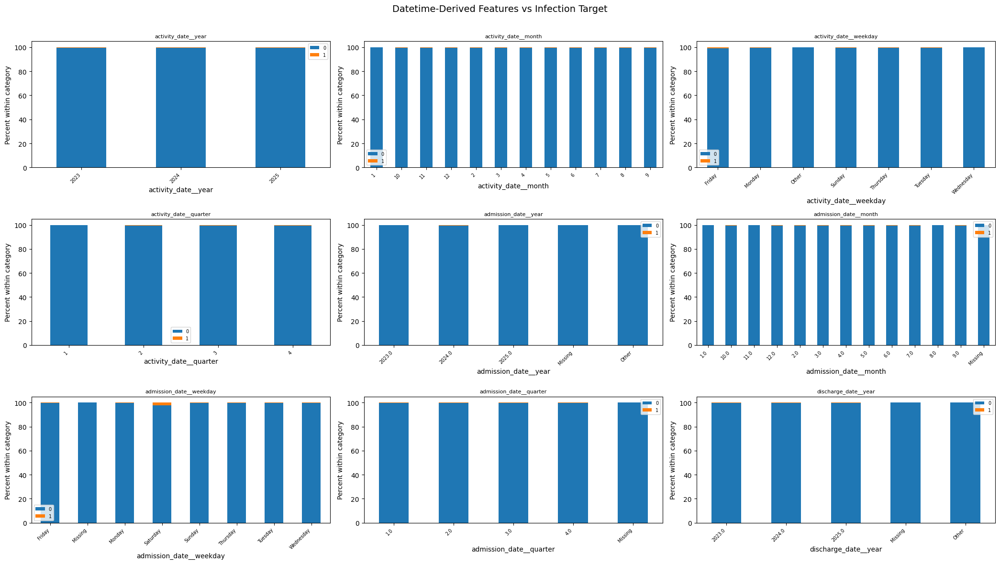

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\037_Datetime-Derived_Features_vs_Infection_Target.png


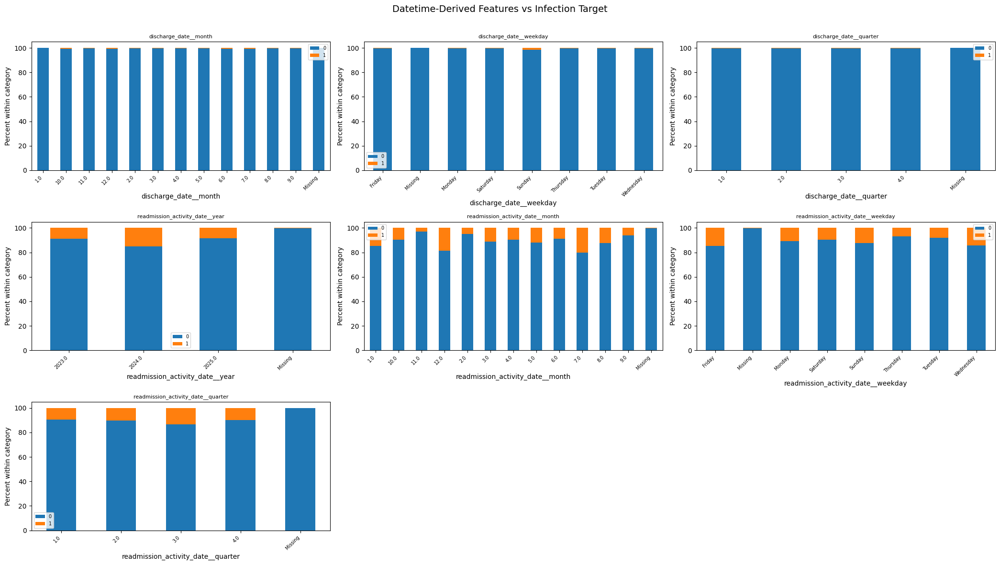

Datetime categorical (year/month/weekday/quarter) tests:


,activity_date__year,activity_date__month,activity_date__weekday,activity_date__quarter,admission_date__year,admission_date__month,admission_date__weekday,admission_date__quarter,discharge_date__year,discharge_date__month,discharge_date__weekday,discharge_date__quarter,readmission_activity_date__year,readmission_activity_date__month,readmission_activity_date__weekday,readmission_activity_date__quarter
0,2023,1,Sunday,1,2022.0,12.0,Saturday,4.0,2023.0,1.0,Tuesday,1.0,NaN,NaN,NaN,NaN
1,2023,1,Sunday,1,2023.0,1.0,Sunday,1.0,2023.0,1.0,Sunday,1.0,NaN,NaN,NaN,NaN
2,2023,1,Sunday,1,2023.0,1.0,Sunday,1.0,2023.0,1.0,Tuesday,1.0,NaN,NaN,NaN,NaN
3,2023,1,Sunday,1,2022.0,12.0,Saturday,4.0,2023.0,1.0,Sunday,1.0,NaN,NaN,NaN,NaN
4,2023,1,Sunday,1,2023.0,1.0,Sunday,1.0,2023.0,1.0,Sunday,1.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35920,2025,9,Tuesday,3,2025.0,9.0,Tuesday,3.0,2025.0,10.0,Wednesday,4.0,NaN,NaN,NaN,NaN
35921,2025,9,Tuesday,3,2025.0,9.0,Tuesday,3.0,2025.0,10.0,Wednesday,4.0,NaN,NaN,NaN,NaN
35922,2025,9,Tuesday,3,2025.0,9.0,Tuesday,3.0,2025.0,10.0,Wednesday,4.0,NaN,NaN,NaN,NaN
35923,2025,9,Tuesday,3,2025.0,9.0,Tuesday,3.0,2025.0,10.0,Wednesday,4.0,NaN,NaN,NaN,NaN


\Clinical event duration tests:


,test,group_0_n,group_1_n,group_0_mean,group_1_mean,group_0_median,group_1_median,statistic,p_value,effect_size_name,effect_size,clinical_event,fdr_bh_p_value,significant_fdr_0.05
0,Mann-Whitney U,35554,141,1.584092,3.773168,1.283333,3.683333,475586.5,4.094606e-62,rank-biserial r,0.810263,Surgery bed stay,2.456764e-61,True
1,Mann-Whitney U,1618,58,70.141625,140.344253,65.391667,115.275000,24101.0,2.947202e-10,rank-biserial r,0.486360,Drain duration,8.841606e-10,True
2,Mann-Whitney U,5026,113,43.856702,70.117699,38.391667,47.350000,190163.5,1.806723e-09,rank-biserial r,0.330337,Catheter duration,3.613447e-09,True
3,Mann-Whitney U,32549,64,1.397595,1.901302,1.283333,1.816667,606921.0,7.615017e-09,rank-biserial r,0.417301,Recovery stay,1.142253e-08,True
4,Mann-Whitney U,976,17,1.383419,2.006863,1.175000,2.100000,5297.0,1.052986e-02,rank-biserial r,0.361500,Additional surgery episode,1.263583e-02,True
5,Mann-Whitney U,2642,89,30.141175,33.359363,21.650000,22.850000,108154.5,1.982134e-01,rank-biserial r,0.080076,ICU stay,1.982134e-01,False



Timing-relative-to-surgery tests:


,test,group_0_n,group_1_n,group_0_mean,group_1_mean,group_0_median,group_1_median,statistic,p_value,effect_size_name,effect_size,date_column,group,fdr_bh_p_value,significant_fdr_0.05
0,Mann-Whitney U,9562,120,56.417147,200.745972,22.975000,131.866667,204754.5,7.722105e-34,rank-biserial r,0.643111,lab_wbc_last_date,Lab: WBC (last),1.158316e-32,True
1,Mann-Whitney U,9562,120,56.417149,200.745972,22.975000,131.866667,204754.5,7.722105e-34,rank-biserial r,0.643111,lab_hemoglobin_last_date,Lab: Hemoglobin (last),1.158316e-32,True
2,Mann-Whitney U,9895,122,56.444396,202.514071,23.316667,133.183333,228923.5,3.802982e-32,rank-biserial r,0.620733,lab_creatinine_last_date,Lab: Creatinine (last),3.802982e-31,True
3,Mann-Whitney U,9369,122,57.575098,199.859699,23.833333,132.858333,223215.0,5.010544e-31,rank-biserial r,0.609429,lab_glucose_last_date,Lab: Glucose (last),3.226284e-30,True
4,Mann-Whitney U,9363,122,57.619238,199.859699,23.850000,132.858333,223252.5,5.377140e-31,rank-biserial r,0.609113,lab_na_last_date,Lab: Sodium (last),3.226284e-30,True
5,Mann-Whitney U,9146,122,58.210887,199.662295,23.975000,132.858333,220772.0,1.593704e-30,rank-biserial r,0.604285,lab_k_last_date,Lab: Potassium (last),7.968519e-30,True
6,Mann-Whitney U,3201,97,119.616399,242.206014,110.100000,160.883333,79087.5,1.675383e-16,rank-biserial r,0.490575,lab_crp_last_date,Lab: CRP (last),7.180212e-16,True
7,Mann-Whitney U,9562,120,12.249783,2.630000,14.933333,5.250000,802372.5,5.716089e-14,rank-biserial r,-0.398544,lab_wbc_first_date,Lab: WBC (first),1.719355e-13,True
8,Mann-Whitney U,9562,120,12.249696,2.630000,14.933333,5.250000,802371.5,5.717525e-14,rank-biserial r,-0.398542,lab_hemoglobin_first_date,Lab: Hemoglobin (first),1.719355e-13,True
9,Mann-Whitney U,9562,120,12.249794,2.630139,14.933333,5.250000,802362.0,5.731185e-14,rank-biserial r,-0.398525,lab_plt_first_date,Lab: Platelets (first),1.719355e-13,True



Top 20 overall values: actual_activity


,value,total_count,positive_count,negative_count,infection_rate_percent
0,כירו-לאפ-כריתת כיס מרה,2883,0,2883,0.000000
1,"תיקון הרניה מפשעתית דו""צ בלאפ",2704,0,2704,0.000000
2,"תיקון הרניה מפשעתית ח""צ בלאפ",2035,0,2035,0.000000
3,החלפת מפרק ירך,1836,3,1833,0.163399
4,כירו-שד-למפקטומי+בלוטות,1697,0,1697,0.000000
5,כירורגיה-טחורים,1551,0,1551,0.000000
6,החלפת מפרק ברך,1506,3,1503,0.199203
7,"תיקון הרניה מפשעתית, פתוח",1455,0,1455,0.000000
8,"תיקון הרניה טבורית, פתוח",1234,0,1234,0.000000
9,כירורגיה-פיסורה אנאלי,1190,0,1190,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\038_Infection_Rate_for_Top_Overall_Values__actual_activity.png


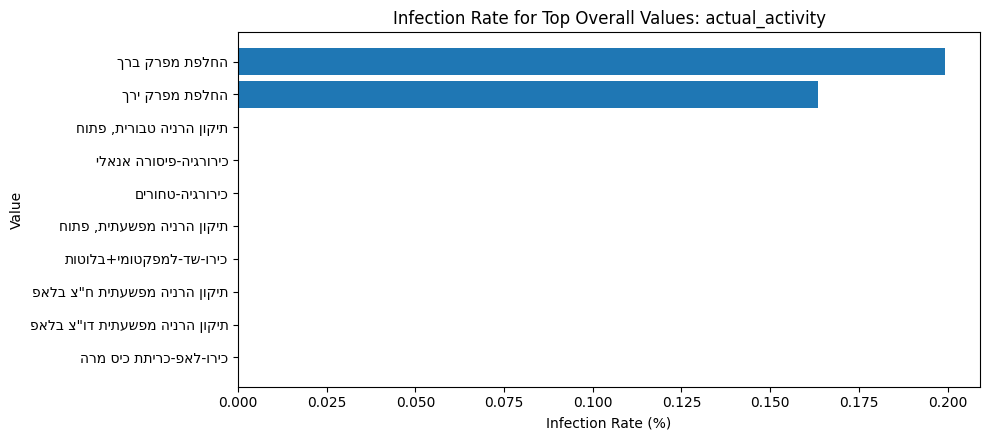


Top 20 overall values: anasthesiologist_code


,value,total_count,positive_count,negative_count,infection_rate_percent
0,1098979.0,1321,1,1320,0.075700
1,8520069.0,1176,3,1173,0.255102
2,4611990.0,1070,2,1068,0.186916
3,2062393.0,984,0,984,0.000000
4,6368250.0,968,1,967,0.103306
5,6693560.0,918,0,918,0.000000
6,8955606.0,832,1,831,0.120192
7,1712430.0,830,1,829,0.120482
8,3049589.0,813,9,804,1.107011
9,9594205.0,776,1,775,0.128866


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\039_Infection_Rate_for_Top_Overall_Values__anasthesiologist_code.png


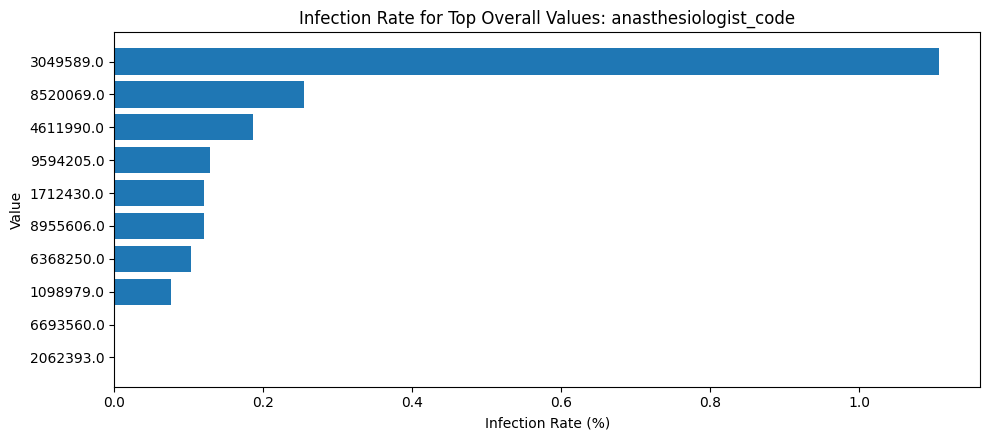


Top 20 overall values: payment _by


,value,total_count,positive_count,negative_count,infection_rate_percent
0,קופח מכבי סל,13697,22,13675,0.160619
1,קופח מכבי שבן,10708,52,10656,0.485618
2,ביטוח הפניקס,2202,5,2197,0.227066
3,ביטוח הראל,2098,6,2092,0.285987
4,ביטוח מגדל,1064,4,1060,0.375940
5,קופח לאומית שבן,891,8,883,0.897868
6,ביטוח מנורה,834,3,831,0.359712
7,כלל חברה לביטוח בעמ,766,3,763,0.391645
8,קופח לאומית סל,737,0,737,0.000000
9,קופח מאוחדת שבן,515,8,507,1.553398


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\040_Infection_Rate_for_Top_Overall_Values__payment__by.png


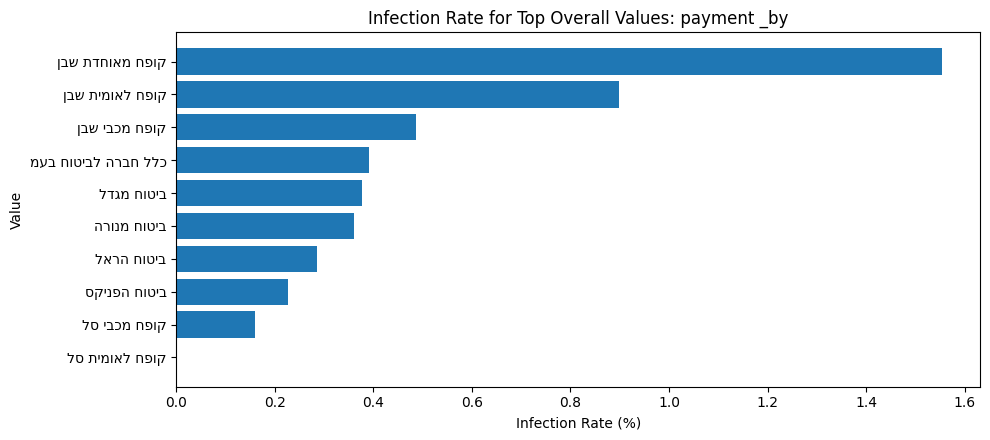


Top 20 overall values: home_town


,value,total_count,positive_count,negative_count,infection_rate_percent
0,תל אביב יפו,2577,10,2567,0.388048
1,פתח תקווה,1427,4,1423,0.280308
2,רמת גן,1089,4,1085,0.367309
3,ראשון לציון,1073,8,1065,0.745573
4,נתניה,1027,6,1021,0.584226
5,חולון,1020,4,1016,0.392157
6,רעננה,708,1,707,0.141243
7,כפר סבא,695,2,693,0.287770
8,הרצליה,691,3,688,0.434153
9,בת ים,601,5,596,0.831947


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\041_Infection_Rate_for_Top_Overall_Values__home_town.png


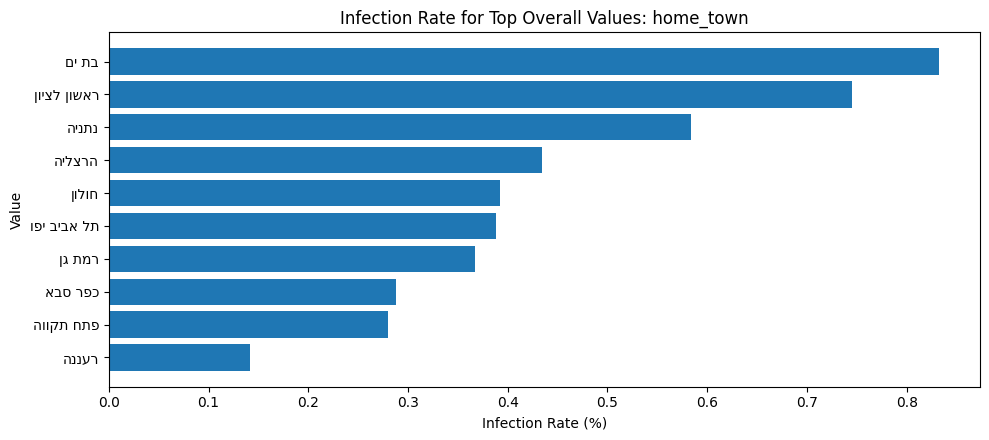


Top 20 overall values: diagnosis_1


,value,total_count,positive_count,negative_count,infection_rate_percent
0,Bilateral inguinal hernia,2528,0,2528,0.000000
1,Cholelithiasis,1934,0,1934,0.000000
2,"Unilateral inguinal hernia, right",1577,0,1577,0.000000
3,Umbilical hernia,1464,0,1464,0.000000
4,"Unilateral inguinal hernia, left",1332,0,1332,0.000000
5,Morbid obesity,1275,0,1275,0.000000
6,Hemorrhoids,1011,0,1011,0.000000
7,Anal fissure,873,0,873,0.000000
8,Pilonidal sinus,835,0,835,0.000000
9,"Osteoarthritis of knee, right",736,1,735,0.135870


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\042_Infection_Rate_for_Top_Overall_Values__diagnosis_1.png


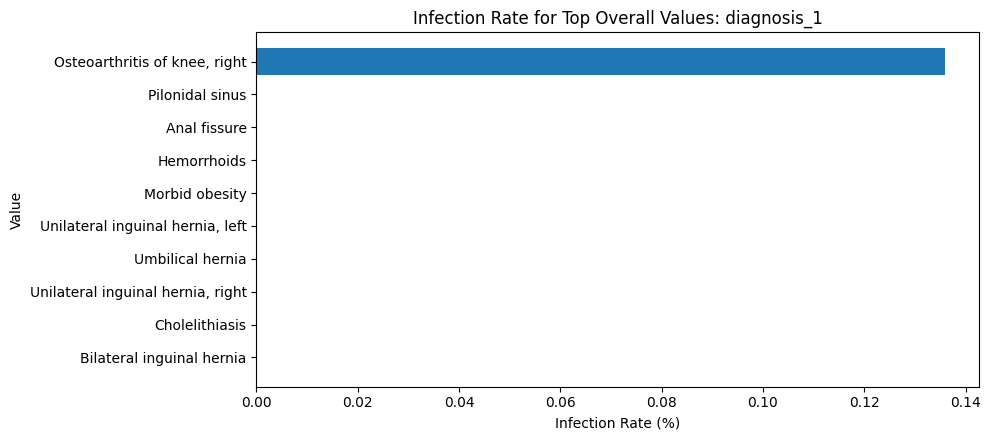


Top 20 overall values: diagnosis_2


,value,total_count,positive_count,negative_count,infection_rate_percent
0,Essential hypertension,608,3,605,0.493421
1,Umbilical hernia,586,0,586,0.000000
2,"HTN, Hypertension",577,8,569,1.386482
3,Morbid obesity,436,0,436,0.000000
4,Bilateral inguinal hernia,435,0,435,0.000000
5,Hyperlipidemia,427,11,416,2.576112
6,Cholelithiasis,416,0,416,0.000000
7,"Unilateral inguinal hernia, right",233,0,233,0.000000
8,Fatty liver,225,0,225,0.000000
9,"Osteoarthritis of knee, right",213,0,213,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\043_Infection_Rate_for_Top_Overall_Values__diagnosis_2.png


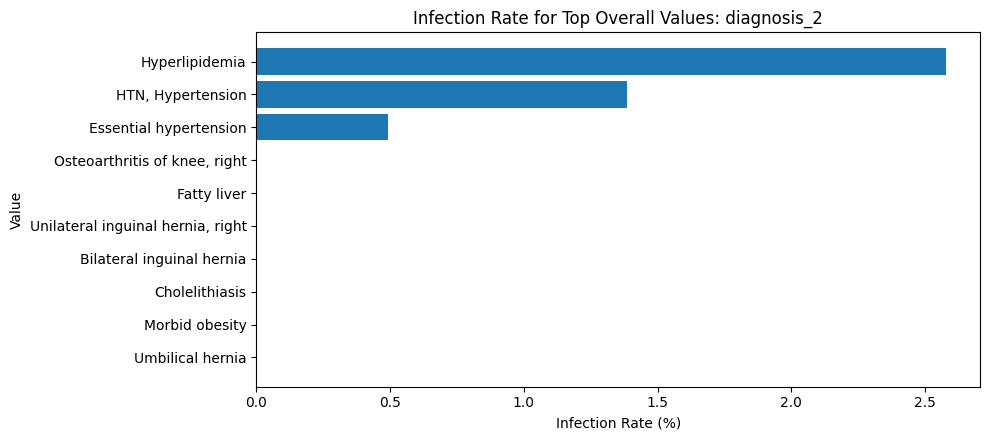


Top 20 overall values: diagnosis_3


,value,total_count,positive_count,negative_count,infection_rate_percent
0,"HTN, Hypertension",298,7,291,2.348993
1,Essential hypertension,261,4,257,1.532567
2,Cholelithiasis,183,0,183,0.000000
3,Bilateral inguinal hernia,168,0,168,0.000000
4,Umbilical hernia,164,0,164,0.000000
5,Fatty liver,152,0,152,0.000000
6,"Unilateral inguinal hernia, right",117,0,117,0.000000
7,"Osteoarthritis of knee, left",115,0,115,0.000000
8,"Osteoarthritis of knee, right",107,0,107,0.000000
9,"IHD, Ischemic Heart Disease",103,2,101,1.941748


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\044_Infection_Rate_for_Top_Overall_Values__diagnosis_3.png


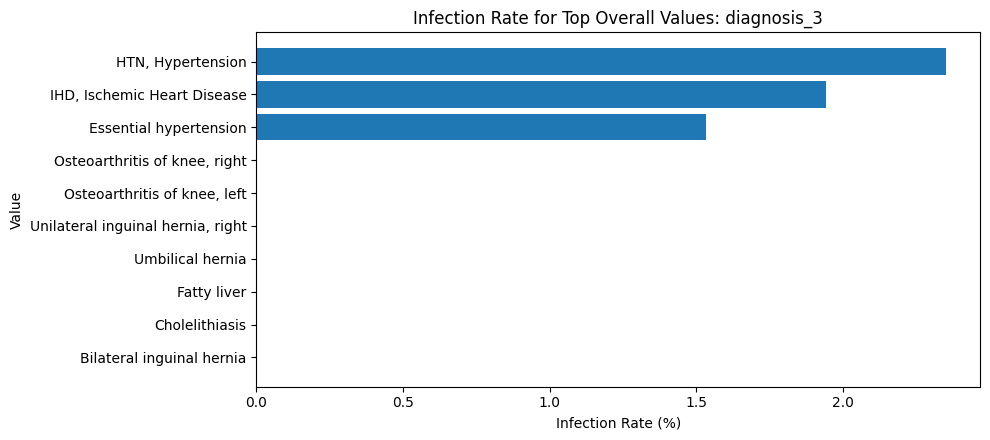


Top 20 overall values: diagnosis_4


,value,total_count,positive_count,negative_count,infection_rate_percent
0,"HTN, Hypertension",144,2,142,1.388889
1,"TV-CAD, Triple Vessel Coronary Artery Disease",97,6,91,6.185567
2,Essential hypertension,88,2,86,2.272727
3,Cholelithiasis,85,0,85,0.000000
4,"BPH, Benign Prostatic Hyperplasia",82,0,82,0.000000
5,Umbilical hernia,71,0,71,0.000000
6,Bilateral inguinal hernia,66,0,66,0.000000
7,Fatty liver,65,0,65,0.000000
8,"IHD, Ischemic Heart Disease",60,0,60,0.000000
9,Angina pectoris,52,1,51,1.923077


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\045_Infection_Rate_for_Top_Overall_Values__diagnosis_4.png


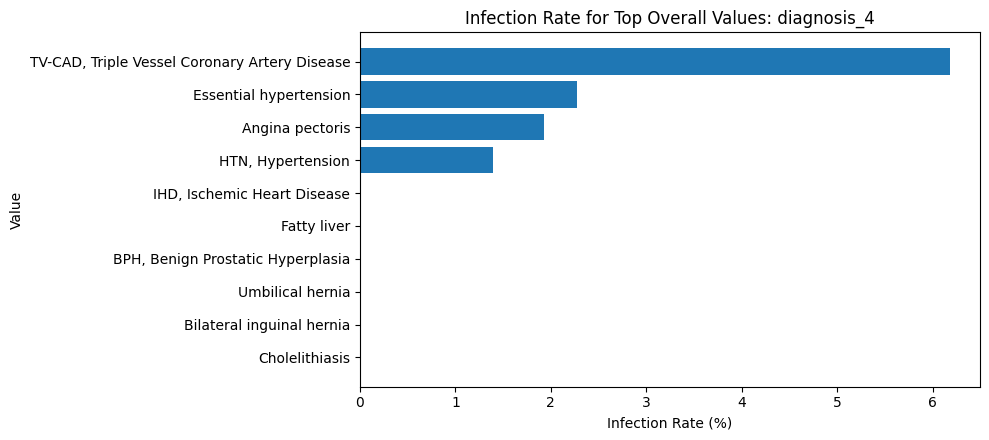


Top 20 overall values: diagnosis _icd9_4


,value,total_count,positive_count,negative_count,infection_rate_percent
0,401.9,232,4,228,1.724138
1,414,190,7,183,3.684211
2,550.9,97,0,97,0.000000
3,574.2,93,0,93,0.000000
4,715.36,86,0,86,0.000000
5,600,83,0,83,0.000000
6,414.9,80,0,80,0.000000
7,553.1,72,0,72,0.000000
8,553.3,69,0,69,0.000000
9,550.92,66,0,66,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\046_Infection_Rate_for_Top_Overall_Values__diagnosis__icd9_4.png


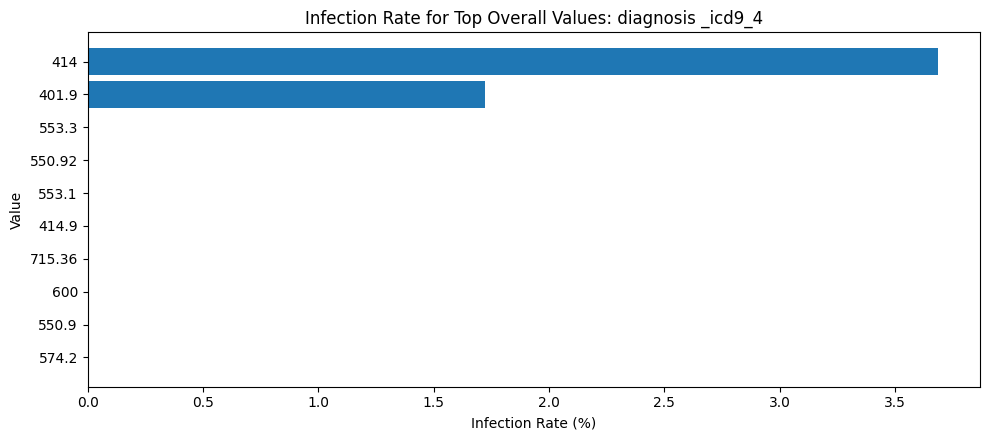


Top 20 overall values: diagnosis_5


,value,total_count,positive_count,negative_count,infection_rate_percent
0,"TV-CAD, Triple Vessel Coronary Artery Disease",112,10,102,8.928571
1,"BPH, Benign Prostatic Hyperplasia",55,0,55,0.000000
2,"HTN, Hypertension",49,1,48,2.040816
3,"Left main CAD, Coronary Artery Disease",48,1,47,2.083333
4,Fatty liver,42,0,42,0.000000
5,"DV-CAD, Double Vessel Coronary Artery Disease",40,0,40,0.000000
6,"IHD, Ischemic Heart Disease",37,3,34,8.108108
7,Essential hypertension,30,0,30,0.000000
8,Angina pectoris,29,0,29,0.000000
9,Cholelithiasis,26,0,26,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\047_Infection_Rate_for_Top_Overall_Values__diagnosis_5.png


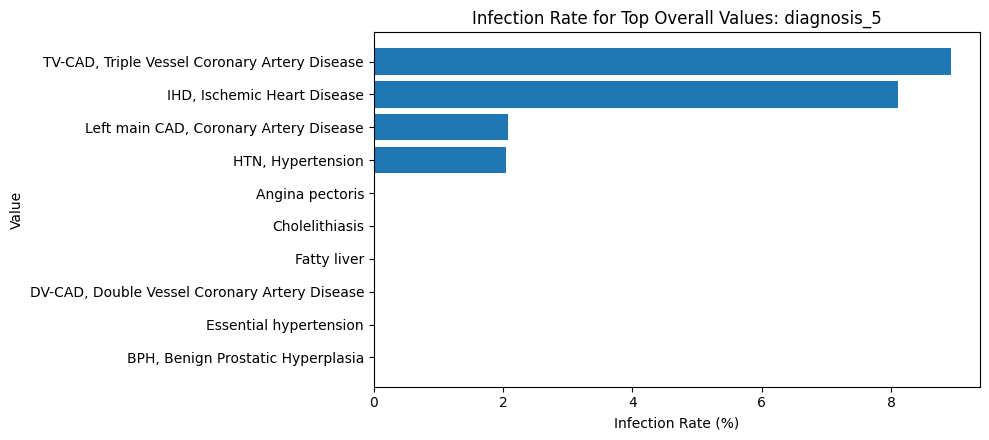


Top 20 overall values: procedure_1


,value,total_count,positive_count,negative_count,infection_rate_percent
0,Laparoscopic cholecystectomy,2930,0,2930,0.000000
1,"TKR, Total Knee Replacement",2263,3,2260,0.132567
2,"Laparoscopic inguinal hernia repair with mesh,...",1908,0,1908,0.000000
3,"THR, Total Hip Replacement",1591,3,1588,0.188561
4,Laparoscopic repair of unilateral inguinal her...,1039,0,1039,0.000000
5,Excision of pilonidal sinus,996,0,996,0.000000
6,"LSAGB, Laparoscopic Single Anastomosis Gastric...",831,0,831,0.000000
7,Laparoscopic repair of unilateral inguinal hernia,743,0,743,0.000000
8,Breast lumpectomy,703,0,703,0.000000
9,Hemorrhoidectomy,683,0,683,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\048_Infection_Rate_for_Top_Overall_Values__procedure_1.png


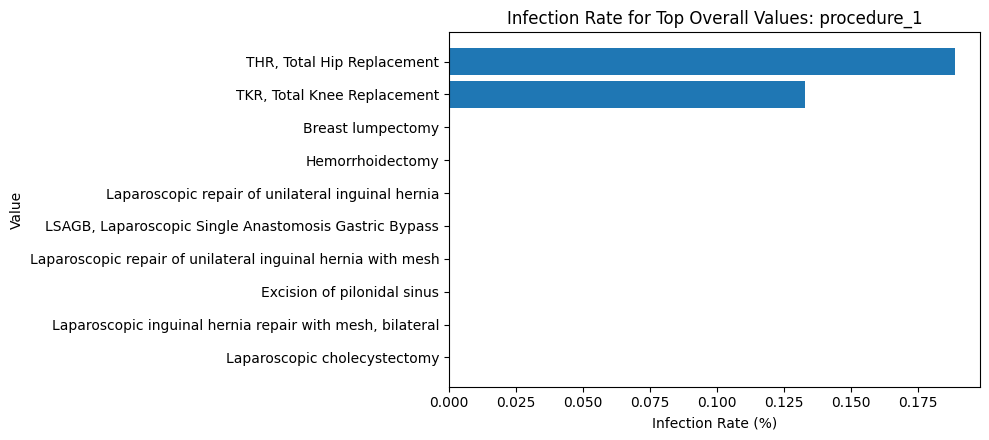


Top 20 overall values: procedure_2


,value,total_count,positive_count,negative_count,infection_rate_percent
0,Sentinel node open biopsy for frozen section,376,0,376,0.000000
1,Axillary sentinel lymph node dissection,347,0,347,0.000000
2,"FNL breast lumpectomy, Fine Needle Localization",340,0,340,0.000000
3,Open repair of umbilical hernia,305,0,305,0.000000
4,Axillary sentinel node biopsy,286,0,286,0.000000
5,Laparoscopic liver biopsy,192,0,192,0.000000
6,Minimally invasive discectomy,192,0,192,0.000000
7,Sentinel lymph node biopsy without frozen section,180,0,180,0.000000
8,Open Mayo repair of umbilical hernia,174,0,174,0.000000
9,Partial mastectomy,168,0,168,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\049_Infection_Rate_for_Top_Overall_Values__procedure_2.png


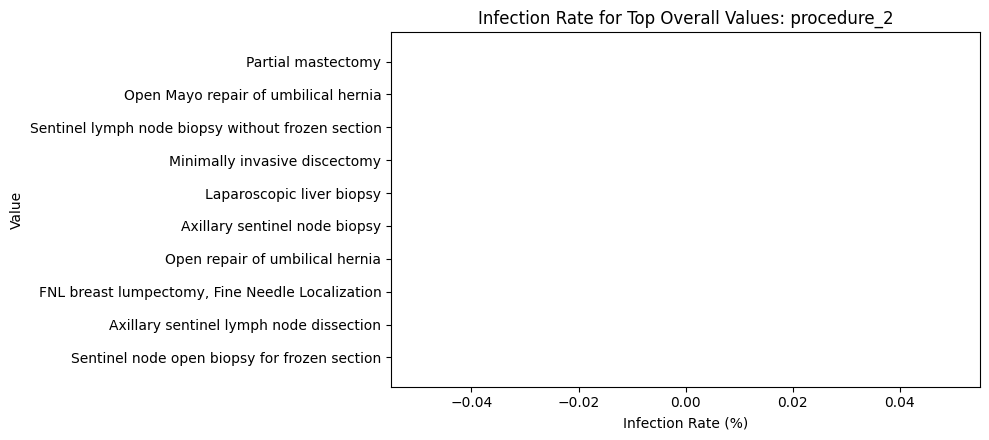


Top 20 overall values: procedure_3


,value,total_count,positive_count,negative_count,infection_rate_percent
0,Breast reconstruction,131,0,131,0.000000
1,Uncoded procedures for work up,87,1,86,1.149425
2,Lumbar discectomy,81,2,79,2.469136
3,Partial mastectomy,77,0,77,0.000000
4,Axillary lymph node dissection,68,0,68,0.000000
5,"FNL breast lumpectomy, Fine Needle Localization",66,0,66,0.000000
6,"Intrabeam IORT, IntraOperative Radiation Therapy",66,0,66,0.000000
7,Unilateral selective neck dissection VI level,63,0,63,0.000000
8,Posterior lumbar spine fusion,62,0,62,0.000000
9,Lumbar facectomy for spinal stenosis,58,1,57,1.724138


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\050_Infection_Rate_for_Top_Overall_Values__procedure_3.png


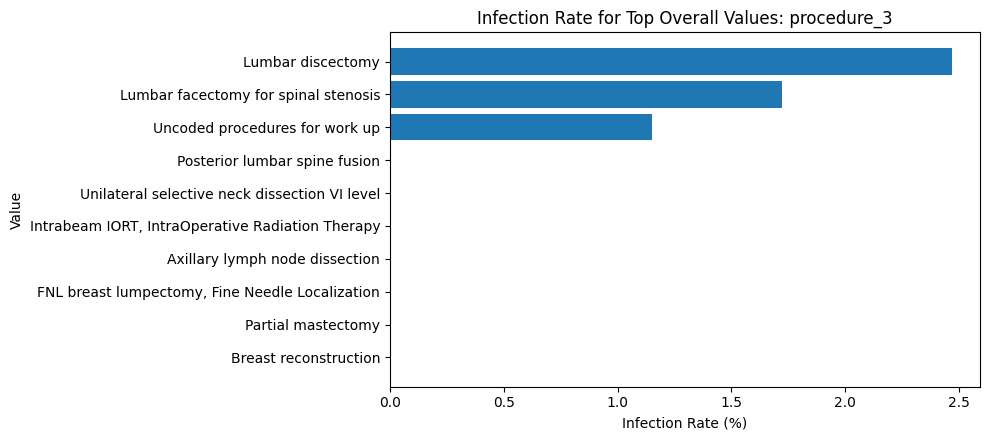


Top 20 overall values: procedure_4


,value,total_count,positive_count,negative_count,infection_rate_percent
0,Lumbar discectomy,50,3,47,6.000000
1,"Posterior lumbar fusion, posteriolateral techn...",50,2,48,4.000000
2,Breast reconstruction,44,0,44,0.000000
3,Unilateral breast reduction,36,0,36,0.000000
4,Uncoded procedures for work up,34,2,32,5.882353
5,"FNL breast lumpectomy, Fine Needle Localization",24,0,24,0.000000
6,"TLIF, Transforaminal Lumbar Interbody Fusion",23,0,23,0.000000
7,Partial mastectomy,22,0,22,0.000000
8,"Intrabeam IORT, IntraOperative Radiation Therapy",20,0,20,0.000000
9,Lumbar facectomy for spinal stenosis,18,2,16,11.111111


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\051_Infection_Rate_for_Top_Overall_Values__procedure_4.png


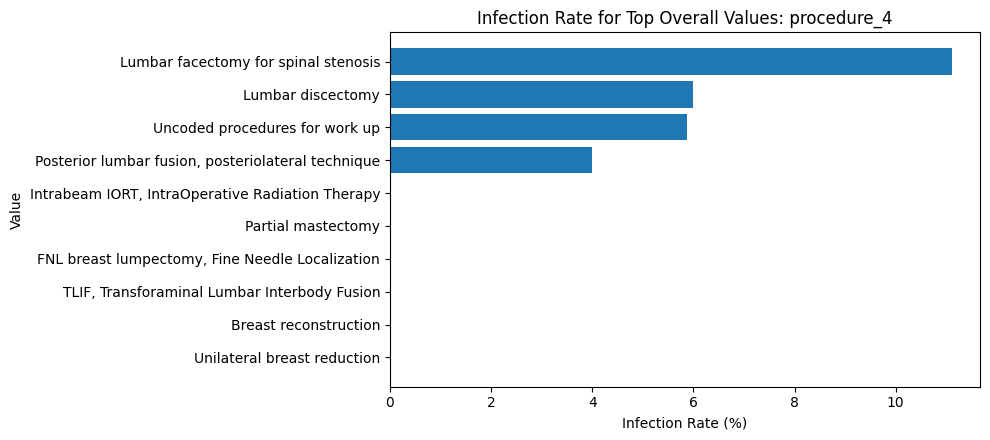


Top 20 overall values: procedure_5


,value,total_count,positive_count,negative_count,infection_rate_percent
0,"TLIF, Transforaminal Lumbar Interbody Fusion",34,2,32,5.882353
1,"Posterior lumbar fusion, posteriolateral techn...",21,0,21,0.000000
2,Lumbar discectomy,17,1,16,5.882353
3,Uncoded procedures for work up,11,1,10,9.090909
4,Unilateral breast reduction,10,0,10,0.000000
5,Breast reconstruction,8,0,8,0.000000
6,"BSO, Bilateral Salpingo-Oophorectomy",7,0,7,0.000000
7,"Insertion of PICC line, Peripherally Inserted ...",7,1,6,14.285714
8,Open appendectomy,6,0,6,0.000000
9,Breast lumpectomy,5,0,5,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\052_Infection_Rate_for_Top_Overall_Values__procedure_5.png


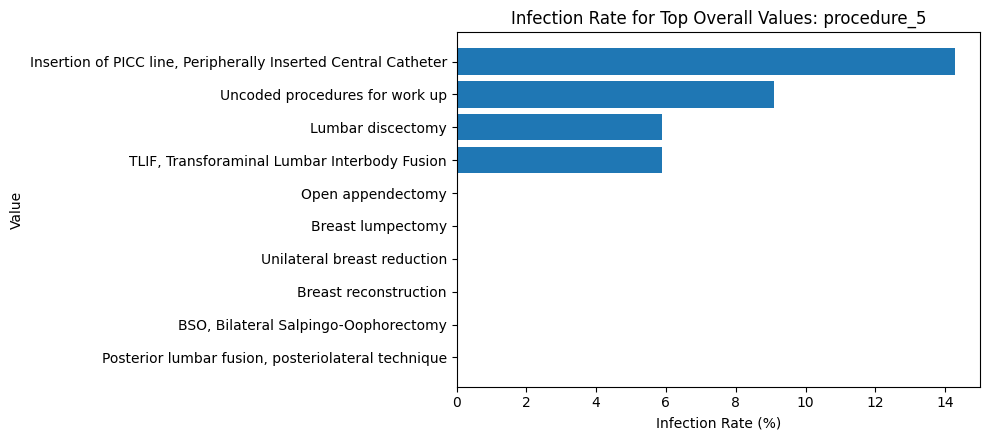


Top 20 overall values: preop_regular_medications


,value,total_count,positive_count,negative_count,infection_rate_percent
0,ללא טיפול תרופתי קבוע,4733,11,4722,0.232411
1,לא נוטל טיפול תרופתי קבוע,886,3,883,0.338600
2,ללא,116,0,116,0.000000
3,גלולות,84,0,84,0.000000
4,NEXIUM,27,1,26,3.703704
5,לא נוטלת טיפול תרופתי קבוע,25,0,25,0.000000
6,LITORVA,25,0,25,0.000000
7,CIPRALEX,22,0,22,0.000000
8,ויטמינים,22,0,22,0.000000
9,EUTHYROX,19,0,19,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\053_Infection_Rate_for_Top_Overall_Values__preop_regular_medications.png


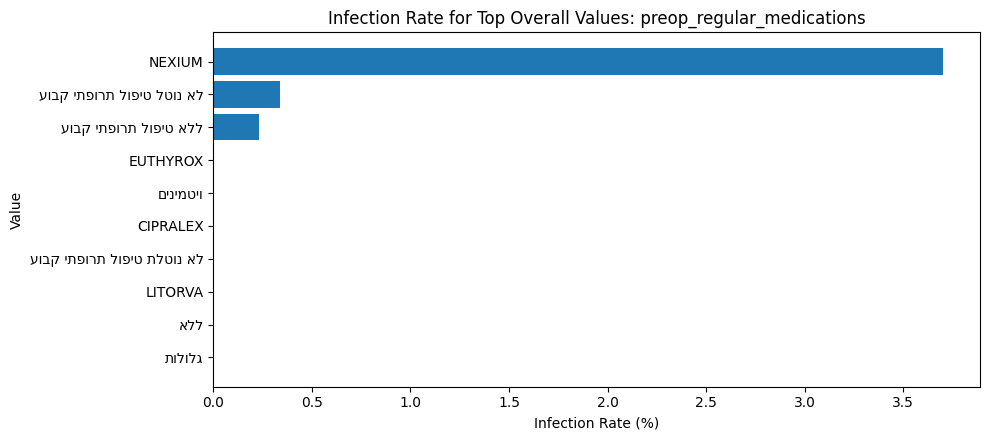


Top 20 overall values: preop_mental_health


,value,total_count,positive_count,negative_count,infection_rate_percent
0,*,36,0,36,0.0
1,PANIC,21,0,21,0.0
2,PANIC ATACS,8,0,8,0.0
3,ANXIETY,4,0,4,0.0
4,PANIC ATACS,4,0,4,0.0
5,PANIC ATTAC,3,0,3,0.0
6,חרדה,3,0,3,0.0
7,PANIC ATAC,2,0,2,0.0
8,DEPRESSION,2,0,2,0.0
9,ANXIETY DISORDER,2,0,2,0.0


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\054_Infection_Rate_for_Top_Overall_Values__preop_mental_health.png


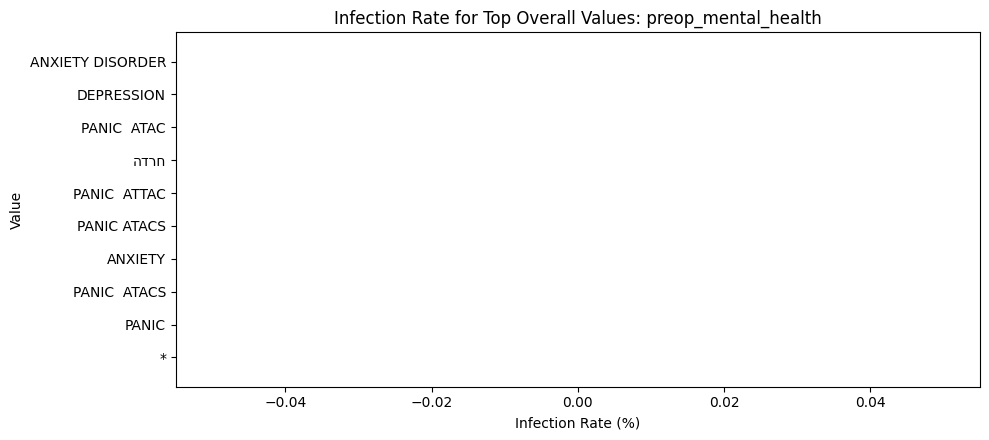


Top 20 overall values: past_surgery_first_hopitalization


,value,total_count,positive_count,negative_count,infection_rate_percent
0,S\PAppendectomy,359,3,356,0.835655
1,קיסרי,135,0,135,0.000000
2,"S\PInguinal Hernia , Right",114,1,113,0.877193
3,"S\PInguinal Hernia, Left",86,0,86,0.000000
4,טחורים,83,0,83,0.000000
5,פילונידל סינוס,80,0,80,0.000000
6,S\PTonsillectomy,79,1,78,1.265823
7,S\PCholecystectomy,72,0,72,0.000000
8,הרניה,63,0,63,0.000000
9,CS,62,0,62,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\055_Infection_Rate_for_Top_Overall_Values__past_surgery_first_hopitalization.png


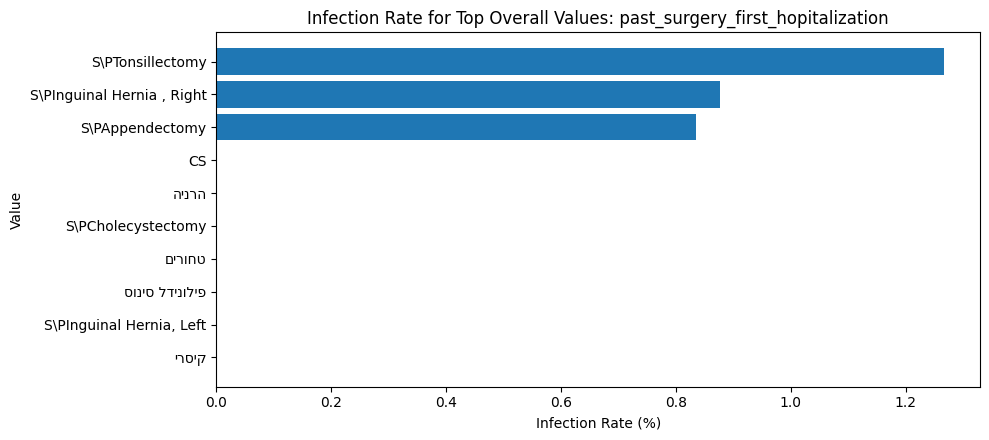


Top 20 overall values: first_hospitalization_main_complaint


,value,total_count,positive_count,negative_count,infection_rate_percent
0,בקע מפשעתי מימין,433,0,433,0.0
1,"בקע מפשעתי דו""צ",412,0,412,0.0
2,אבני מרה,409,0,409,0.0
3,בקע מפשעתי משמאל,386,0,386,0.0
4,morbid obesity,372,0,372,0.0
5,בקע מפשעתי,366,0,366,0.0
6,בקע טבורי,355,0,355,0.0
7,השמנת יתר,314,0,314,0.0
8,כאבים בברך ימין,272,0,272,0.0
9,כאבים בברך שמאל,263,0,263,0.0


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\056_Infection_Rate_for_Top_Overall_Values__first_hospitalization_main_complaint.png


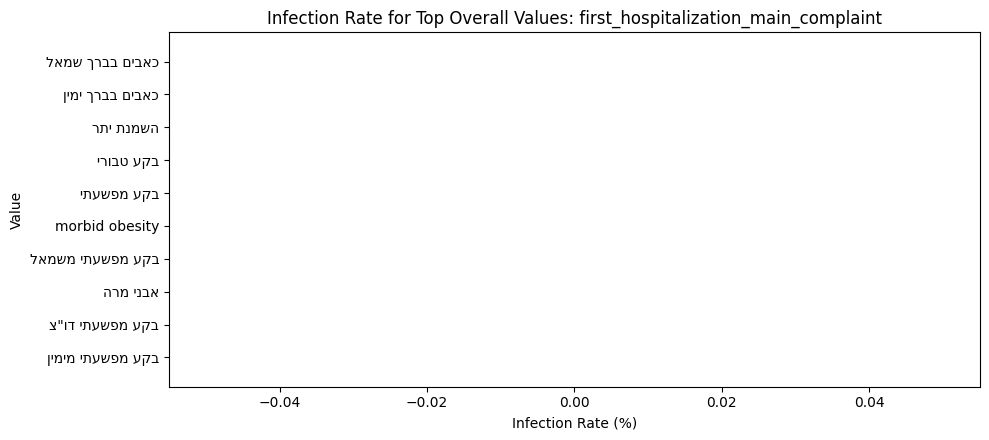

Skiping first_hospitalization_disease_history - very high cardinality free text, deffered to NLP pipeline

Top 20 overall values: catheter_order_dose_remarks


,value,total_count,positive_count,negative_count,infection_rate_percent
0,מחדר ניתוח,41,0,41,0.0
1,הגיע עם קטטר מחדר ניתוח,22,0,22,0.0
2,הגיעה עם קטטר מחדר ניתוח,10,0,10,0.0
3,הגיע עם נקזים מחדר ניתוח,6,0,6,0.0
4,הוכנס בחדר ניתוח,5,0,5,0.0
5,CH 8,3,0,3,0.0
6,חדר ניתוח,2,0,2,0.0
7,CH 14,2,0,2,0.0
8,8F,2,0,2,0.0
9,SP,1,0,1,0.0


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\057_Infection_Rate_for_Top_Overall_Values__catheter_order_dose_remarks.png


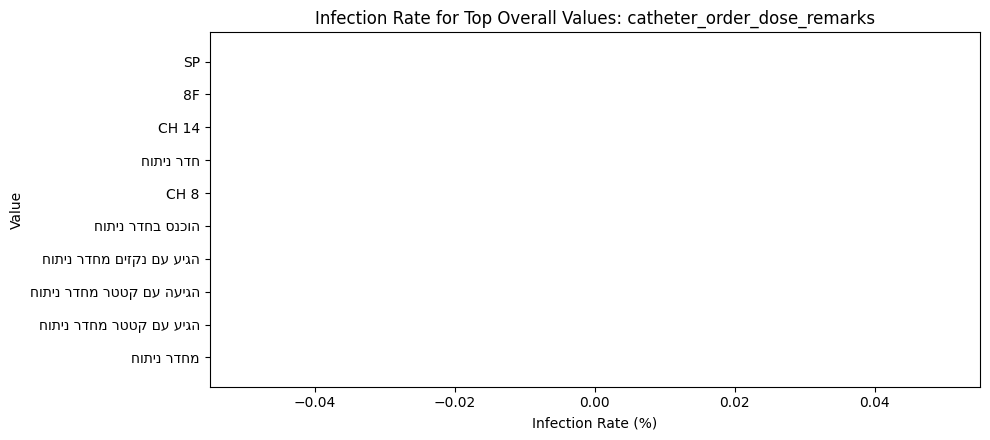


Top 20 overall values: readmission_actual_activity


,value,total_count,positive_count,negative_count,infection_rate_percent
0,אשפוז חוזר,353,57,296,16.147309
1,כירורגיה-שד למפקטומי,24,0,24,0.000000
2,אמב'-ניתוח מוז,19,0,19,0.000000
3,ציסטוסקופיה,17,0,17,0.000000
4,אנגיו-הכנסת היקמן/פורטקט,11,0,11,0.000000
5,עיניים-קטרקט,10,0,10,0.000000
6,אשפוז-פנימי/יומי,6,0,6,0.000000
7,כירורגיה-פיסטולה פריאנל,6,0,6,0.000000
8,מעי-סגירת אילואוסטומי/קולוסטומי,3,0,3,0.000000
9,אקסיזיה קטנה,3,0,3,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\058_Infection_Rate_for_Top_Overall_Values__readmission_actual_activity.png


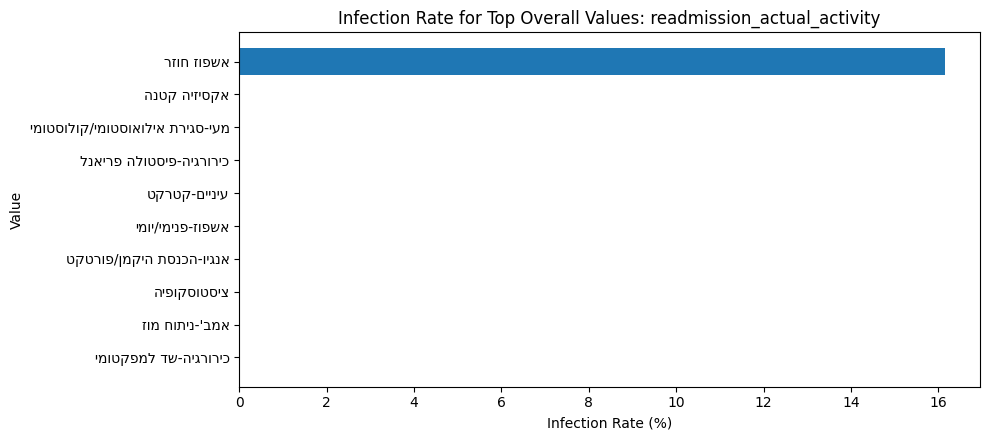


Top 20 overall values: main_complaint_readmission_value


,value,total_count,positive_count,negative_count,infection_rate_percent
0,כאבי בטן,7,0,7,0.000000
1,הקאות,4,0,4,0.000000
2,הפרשה מפצע ניתוחי,4,3,1,75.000000
3,STERNAL WOUND INFECTION,4,4,0,100.000000
4,"אחר,",3,0,3,0.000000
5,חום אחרי ניתוח,3,1,2,33.333333
6,אלקטיבית ל CRS_HIPEC,3,0,3,0.000000
7,POST-OP PAF,2,0,2,0.000000
8,קושי בשתיה,2,0,2,0.000000
9,RAPID ATRIAL FIBRILLATION,2,0,2,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\059_Infection_Rate_for_Top_Overall_Values__main_complaint_readmission_value.png


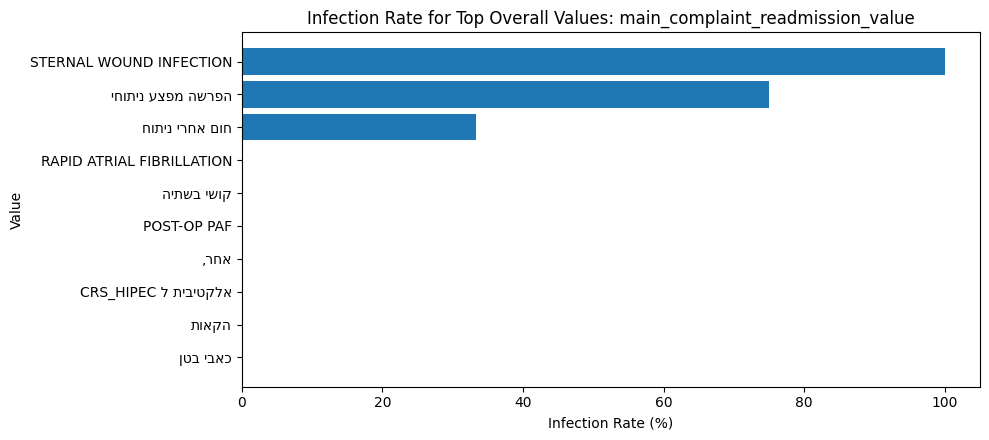


Top 20 overall values: added1_surgery_name


,value,total_count,positive_count,negative_count,infection_rate_percent
0,"TKR, Total Knee Replacement",2569,5,2564,0.194628
1,"THR, Total Hip Replacement",1683,1,1682,0.059418
2,Minimally invasive lumbar laminectomy,445,1,444,0.224719
3,"CABG x 3, Coronary Artery Bypass Grafting of 3...",413,12,401,2.905569
4,"Aortic valve replacement, biological valve",370,13,357,3.513514
5,Lumbar laminectomy,366,6,360,1.639344
6,Mitral valve repair,309,10,299,3.236246
7,"TLIF, Transforaminal Lumbar Interbody Fusion",237,7,230,2.953586
8,"CABG x 2, Coronary Artery Bypass Grafting of 2...",226,12,214,5.309735
9,Minimally invasive discectomy,217,0,217,0.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\060_Infection_Rate_for_Top_Overall_Values__added1_surgery_name.png


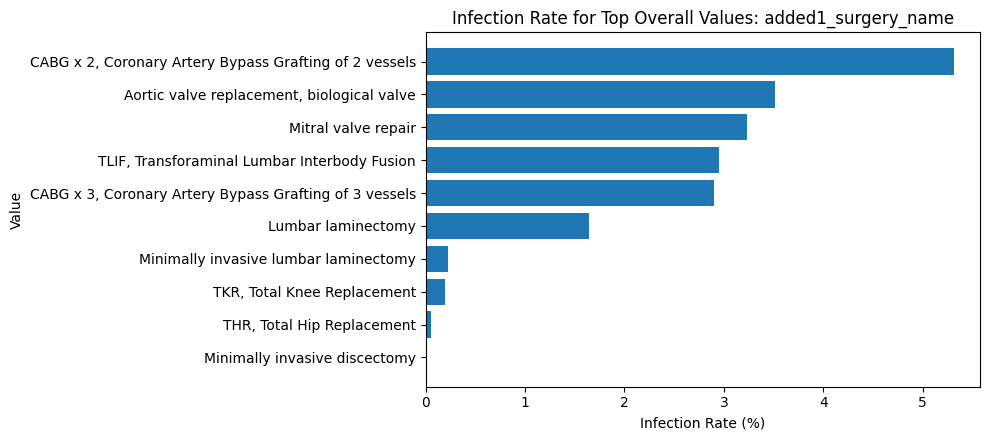


Top 20 overall values: detected_pathogen


,value,total_count,positive_count,negative_count,infection_rate_percent
0,Escherichia coli,29,10,19,34.482759
1,Pseudomonas aeruginosa,13,6,7,46.153846
2,Staphylococcus aureus,10,5,5,50.000000
3,Bacteroides fragilis,9,4,5,44.444444
4,Cutibacterium acnes,9,1,8,11.111111
5,Klebsiella pneumoniae ssp pneumoniae,8,2,6,25.000000
6,Klebsiella pneumoniae,6,0,6,0.000000
7,Staphylococcus epidermidis,5,2,3,40.000000
8,Bacteroides thetaiotaomicron,4,2,2,50.000000
9,Enterococcus faecium,4,2,2,50.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\061_Infection_Rate_for_Top_Overall_Values__detected_pathogen.png


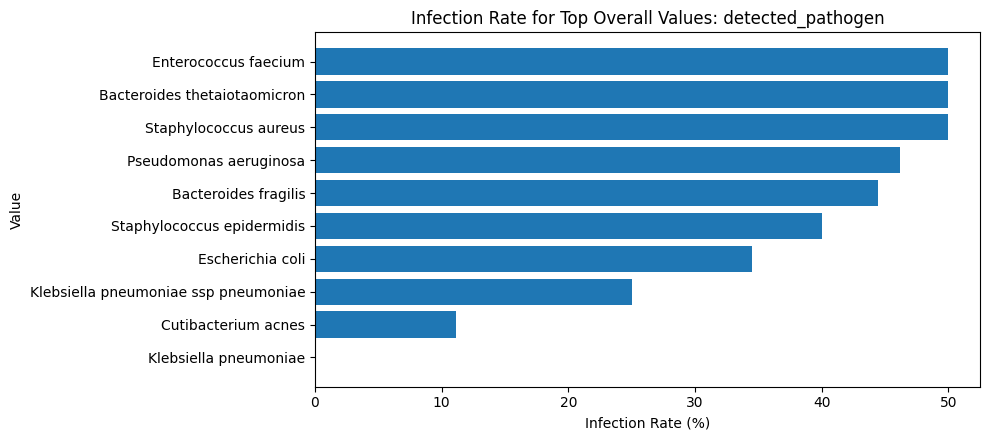


Top 20 overall values: added1_culture_result_organism


,value,total_count,positive_count,negative_count,infection_rate_percent
0,Cutibacterium acnes,41,11,30,26.829268
1,Staphylococcus epidermidis,26,7,19,26.923077
2,Pseudomonas aeruginosa,16,9,7,56.250000
3,Serratia marcescens,13,8,5,61.538462
4,Escherichia coli,12,8,4,66.666667
5,Staphylococcus aureus,10,3,7,30.000000
6,Klebsiella pneumoniae,8,4,4,50.000000
7,Enterobacter aerogenes,7,4,3,57.142857
8,Enterobacter cloacae complex,5,1,4,20.000000
9,Candida albicans,4,2,2,50.000000


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\062_Infection_Rate_for_Top_Overall_Values__added1_culture_result_organism.png


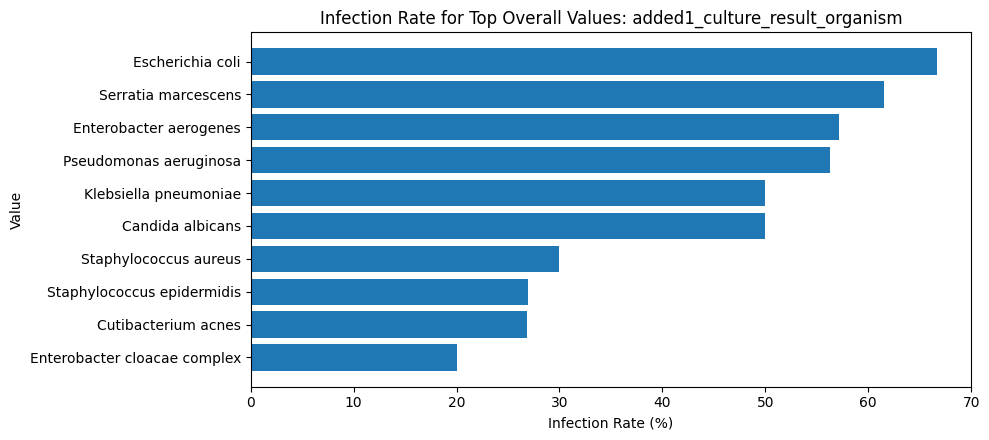

Skiping description_surgical_procedure - very high cardinality free text, deffered to NLP pipeline
Skiping description_first_evaluation_postop - very high cardinality free text, deffered to NLP pipeline

Text summary:


,column,missing_percent,unique_non_missing_values,median_text_length,top_values_coverage_percent
0,actual_activity,0.000000,152,23.0,75.468337
1,anasthesiologist_code,2.379958,197,9.0,47.214143
2,payment _by,0.000000,65,12.0,99.493389
3,home_town,35.476688,694,7.0,65.854185
4,diagnosis_1,7.796799,1277,25.0,58.241758
5,diagnosis_2,66.290884,1029,20.0,48.959538
6,diagnosis_3,85.166319,652,22.0,46.387690
7,diagnosis_4,92.629088,500,22.0,45.619335
8,diagnosis _icd9_4,92.629088,360,5.0,56.117825
9,diagnosis_5,96.205985,308,26.0,46.735143



Text association tests:


,column,categories_after_grouping,test,statistic,degrees_of_freedom,p_value,cramers_v,minimum_expected_count,expected_cells_below_5_percent,expected_count_warning,fdr_bh_p_value,significant_fdr_0.05
0,added1_culture_result_organism,22,Chi-Square,9167.870508,21,0.000000e+00,0.505168,0.007850,75.000000,True,0.000000e+00,True
1,readmission_actual_activity,22,Chi-Square,2359.851083,21,0.000000e+00,0.256297,0.007850,75.000000,True,0.000000e+00,True
2,detected_pathogen,22,Chi-Square,5664.005868,21,0.000000e+00,0.397067,0.007850,77.272727,True,0.000000e+00,True
3,main_complaint_readmission_value,22,Chi-Square,2826.033693,21,0.000000e+00,0.280472,0.007850,90.909091,True,0.000000e+00,True
4,added1_surgery_name,22,Chi-Square,994.485998,21,4.183459e-197,0.166380,0.270814,40.909091,True,2.091729e-196,True
5,procedure_4,22,Chi-Square,541.644487,21,2.851062e-101,0.122789,0.035324,47.727273,True,1.187942e-100,True
6,actual_activity,21,Chi-Square,521.155626,20,1.074908e-97,0.120444,2.558998,28.571429,True,3.838958e-97,True
7,procedure_5,22,Chi-Square,427.581287,21,1.786906e-77,0.109097,0.011775,72.727273,True,5.584080e-77,True
8,diagnosis_5,22,Chi-Square,418.049433,21,1.695737e-75,0.107874,0.054948,47.727273,True,4.710380e-75,True
9,procedure_3,22,Chi-Square,247.191284,21,1.503873e-40,0.082950,0.098121,47.727273,True,3.759682e-40,True


,column,target_0_missing_percent,target_1_missing_percent,test,statistic,degrees_of_freedom,p_value,cramers_v,minimum_expected_count,expected_cells_below_5_percent,expected_count_warning,fdr_bh_p_value,significant_fdr_0.05
0,added1_wound_culture_test,98.871004,28.368794,Fisher exact,221.125000,1,3.403921e-157,0.372553,1.982046,25.0,True,1.661114e-155,True
1,added1_wound_culture_organism_detected,98.871004,28.368794,Fisher exact,221.125000,1,3.403921e-157,0.372553,1.982046,25.0,True,1.661114e-155,True
2,added1_wound_culture_specimen_source,98.871004,28.368794,Fisher exact,221.125000,1,3.403921e-157,0.372553,1.982046,25.0,True,1.661114e-155,True
3,added1_blood_and/or_wound_cultures_taken_2-90_...,98.871004,28.368794,Fisher exact,221.125000,1,3.403921e-157,0.372553,1.982046,25.0,True,1.661114e-155,True
4,added1_wound_culture_result,98.871004,28.368794,Fisher exact,221.125000,1,3.403921e-157,0.372553,1.982046,25.0,True,1.661114e-155,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,antibiotics_given_more_than_36_hours_after_adm...,94.911133,69.503546,Chi-Square,179.172652,1,7.346258e-41,0.070622,7.315908,0.0,False,1.867174e-40,True
96,antibiotics_given_more_than_36_hours_after_adm...,94.908339,69.503546,Chi-Square,179.041887,1,7.845457e-41,0.070596,7.319833,0.0,False,1.973496e-40,True
97,diagnosis_icd9_5,96.389448,75.886525,Chi-Square,160.366941,1,9.407553e-37,0.066813,5.204342,0.0,False,2.342289e-36,True
98,diagnosis_5,96.286050,75.886525,Chi-Square,154.581649,1,1.728292e-35,0.065596,5.349562,0.0,False,4.259628e-35,True


In [ ]:
# Directory for saving the Bivariate EDA output tables
OUTPUT_DIR = Path("outputs") / "bivariate"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Create the binary target from the two diagnosis columns
if TARGET_COL not in df.columns:
    df = create_binary_target(
        df=df,
        infection_cols=INFECTION_COLS,
        target_col=TARGET_COL,
    )
else:
    print(f"{TARGET_COL} already exists - target creation skipped.")

target_balance_df = plot_target_balance(df, TARGET_COL)

# Keep only mapped columns that exist in the current dataframe
existing_numeric_cols = [
    col for col in numeric_cols
    if col in df.columns and col not in INFECTION_COLS
]

existing_categorical_cols = [
    col for col in categorical_cols
    if col in df.columns and col not in INFECTION_COLS
]

existing_boolean_cols = [
    col for col in boolean_cols
    if col in df.columns and col not in INFECTION_COLS and col != TARGET_COL
]


existing_datetime_cols = [
    col for col in central_datetime_cols
        if col in df.columns and col not in INFECTION_COLS
]

# NLP new function:
# excluded_bivariate_text_cols = set(INFECTION_COLS + identifier_code_text_cols + nlp_text_cols)

excluded_bivariate_text_cols = set(
    INFECTION_COLS
    + [
        'case_number',
        "surgeon_code",
        "anesthesioligist_code",
        "readmission_case_number",
        "readmission_surgeon_code",

        "diagnosis_icd9_1",
        "diagnosis_icd9_2",
        "diagnosis_icd9_3",
        "diagnosis_icd9_4",
        "diagnosis_icd9_5",

        "procedure_icd9_1",
        "procedure_icd9_2",
        "procedure_icd9_3",
        "procedure_icd9_4",
        "procedure_icd9_5",

        "added1_surgery_code_icd9"

    ]
)

existing_text_cols = [
    col for col in text_cols
    if col in df.columns and col not in excluded_bivariate_text_cols
]


# Numeric variables
numeric_tests_df = numeric_vs_target(
    df,
    numeric_cols=existing_numeric_cols,
    target_col=TARGET_COL,
)

# Categorical variables
categorical_tests_df = categorical_vs_target(
    df,
    categorical_cols=existing_categorical_cols,
    target_col=TARGET_COL,
    max_categories=20,
    min_category_count=MIN_CATEGORY_COUNT,
    title="Categorical",
)

# Boolean variables use the same categorical method
boolean_tests_df = categorical_vs_target(
    df,
    categorical_cols=existing_boolean_cols,
    target_col=TARGET_COL,
    max_categories=3,
    min_category_count=1,
    title="Boolean",
)

# Datetime-derived variables
datetime_categorical_tests_df, datetime_categorical_tables = datetime_vs_target(
    df, existing_datetime_cols, TARGET_COL,
)

duration_tests_df = duration_vs_target(df, datetime_pairs, TARGET_COL)

timing_tests_df = datetime_timing_vs_target(df, TARGET_COL, reference_col="activity_date")

print("Datetime categorical (year/month/weekday/quarter) tests:")
display(datetime_categorical_tests_df)

print("\Clinical event duration tests:")
display(duration_tests_df)

print("\nTiming-relative-to-surgery tests:")
display(timing_tests_df)


# Text variables
(text_summary_df, text_top_values_tables, text_tests_df,) =
text_vs_target(df, text_cols=existing_text_cols, target_col=TARGET_COL, top_n=TEXT_TOP_N,
)

# Missingness patterns.
missingness_tests_df = missingness_vs_target(
    df,
    target_col=TARGET_COL,
    exclude_cols={TARGET_COL, *INFECTION_COLS},
)

# Save the main Bivariate tables.
bivariate_outputs = {
    "target_balance": target_balance_df,
    "numeric_tests": numeric_tests_df,
    "categorical_tests": categorical_tests_df,
    "boolean_tests": boolean_tests_df,
    "datetime_tests": datetime_categorical_tests_df,
    "datetime_duration_tests": duration_tests_df,
    "datetime_timing_tests": timing_tests_df,
    "text_summary": text_summary_df,
    "text_tests": text_tests_df,
    "missingness_tests": missingness_tests_df,
}

for name, table in bivariate_outputs.items():
    if isinstance(table, pd.DataFrame):
        table.to_csv(OUTPUT_DIR / f"{name}.csv", index=False)

for column_name, table in text_top_values_tables.items():
    safe_name = (
        str(column_name)
        .replace("/", "_")
        .replace("\\", "_")
        .replace(" ", "_")
        [:100]
    )
    table.to_csv(OUTPUT_DIR / f"text_top_values_{safe_name}.csv", index=False,)


# 4 – Multivariate Analysis

## 4.1 Multivariate helper functions

This section focuses on numeric correlation structure, clinically selected joint plots, and feature-leakage review. Pearson and Spearman matrices are both calculated, while Spearman is emphasized for potentially skewed clinical data.

In [ ]:
# MULTIVARIATE HELPER FUNCTIONS

def correlation_analysis(df, numeric_cols, target_col, min_non_missing=50, max_columns=40, strong_threshold=0.80,):
    """
    INFO:
    Analyze relationships among numeric variables and with the binary target.

    Statistical methods:
    - Pearson correlation measures linear relationships.
    - Spearman correlation measures monotonic relationships and is more robust
      to skewness and outliers, so it is emphasized for medical EDA.
    - Point-biserial correlation measures the linear association between a numeric variable and a binary target.
    - FDR correction is applied to target-correlation p-values.

    Strong feature-feature correlations may indicate redundant information or
    multicollinearity, but they do not prove causation.
    """
    eligible = [
        col for col in numeric_cols
        if col in df.columns and df[col].notna().sum() >= min_non_missing
    ]

    if not eligible:
        print("No eligible numeric columns for correlation analysis.")
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    # Limit very wide heatmaps using the highest-variance eligible columns.
    variances = df[eligible].apply(
        lambda col: pd.to_numeric(col, errors="coerce").var()
    )
    selected = variances.sort_values(ascending=False).head(max_columns).index

    numeric_df = df[selected].apply(pd.to_numeric, errors="coerce")
    pearson_corr = numeric_df.corr(method="pearson")
    spearman_corr = numeric_df.corr(method="spearman")

    for name, corr in {
        "Pearson": pearson_corr,
        "Spearman": spearman_corr,
    }.items():
        plt.figure(figsize=(
            max(12, len(selected) * 0.45),
            max(10, len(selected) * 0.45),
        ))
        sns.heatmap(
            corr,
            center=0,
            cmap='coolwarm',
            vmin=-1,
            vmax=1,
            square=True,
            cbar_kws={"shrink": 0.7},
        )
        plt.title(f"{name} Correlation Matrix")
        plt.tight_layout()
        plt.show()

    upper = spearman_corr.where(np.triu(np.ones(spearman_corr.shape), k=1).astype(bool))

    strong_pairs = (
        upper.stack()
        .rename("spearman_correlation")
        .reset_index()
        .rename(columns={
            "level_0": "feature_1",
            "level_1": "feature_2",
        })
    )
    strong_pairs["absolute_correlation"] = (
        strong_pairs["spearman_correlation"].abs()
    )
    strong_pairs = strong_pairs.loc[
        strong_pairs["absolute_correlation"] >= strong_threshold
    ].sort_values("absolute_correlation", ascending=False)

    target_rows = []

    for col in eligible:
        pair = df[[col, target_col]].copy()
        pair[col] = pd.to_numeric(pair[col], errors="coerce")
        pair = pair.dropna()

        if len(pair) < 30 or pair[target_col].nunique() < 2:
            continue

        spearman_r, spearman_p = stats.spearmanr(
            pair[col],
            pair[target_col],
        )
        point_r, point_p = stats.pointbiserialr(
            pair[target_col],
            pair[col],
        )

        target_rows.append({
            "column": col,
            "n": len(pair),
            "spearman_r": spearman_r,
            "p_value": spearman_p,
            "point_biserial_r": point_r,
            "point_biserial_p_value": point_p,
        })

    target_corr = apply_fdr_bh(pd.DataFrame(target_rows))

    if not target_corr.empty:
        target_corr["absolute_spearman"] = target_corr["spearman_r"].abs()
        target_corr = target_corr.sort_values(
            "absolute_spearman",
            ascending=False,
        )

        top = target_corr.head(20).sort_values("spearman_r")
        plt.figure(figsize=(10, 8))
        plt.barh(top["column"], top["spearman_r"])
        plt.axvline(0, linewidth=1)
        plt.xlabel("Spearman correlation with infection target")
        plt.ylabel("Feature")
        plt.title("Top Numeric Correlations with Infection Target")
        plt.tight_layout()
        plt.show()

    print("Strong feature-feature correlations:")
    display(strong_pairs.head(100))

    print("Numeric correlations with target:")
    display(target_corr.head(100))

    return pearson_corr, spearman_corr, strong_pairs, target_corr


def categorical_correlation_analysis(df, 
                                     categorical_cols, 
                                     min_non_missing=50, 
                                     max_columns=30, 
                                     strong_threshold=0.80,
                                     min_category_count=None):
    """
    INFO:
    Analyze relationships among categorical/boolean variables themselves (not against the target),
    using Cramer' V.

    Statistical methods:
    - For every pair of columns, values are grouped ("Missing" for nulls,
    rare categories below min_category_count merged into "Other") and compared using
    the same Chi-square/Fisher logic already used for feature-vs-target tests, reporting 
    Cramer's V as the association strength.

    Strong feature-feature associations may indicate redundant information,
    but they do not prove causation, and require review before being acted on.
    """
    if min_category_count is None:
        min_category_count = MIN_CATEGORY_COUNT

    eligible = [
        col for col in categorical_cols
        if col in df.columns and df[col].notna().sum() >= min_non_missing
    ]

    if len(eligible) < 2:
        print("No enough eligible categorical columns for correlation analysis.")
        return pd.DataFrame(), pd.DataFrame()

    if len(eligible) > max_columns:
        missing_rate = df[eligible].isna().mean().sort_values()
        eligible = missing_rate.head(max_columns).index.tolist()

    def _grouped(col):
        values = df[col].fillna("Missing").astype(str).str.strip()
        values = values.replace("", "Missing")
        counts = values.value_counts()
        frequent = counts[counts >= min_category_count].index
        return values.where(values.isin(frequent) | values.eq("Missing"), "Other")

    grouped_cols = {col: _grouped(col) for col in eligible}

    cramers_matrix = pd.DataFrame(np.eye(len(eligible)), index=eligible, columns=eligible)
    pair_rows = []

    for i, col_1 in enumerate(eligible):
        for col_2 in eligible[i + 1:]:
            contingency = pd.crosstab(grouped_cols[col_1], grouped_cols[col_2])
            test_result = categorical_association_test(contingency)
            if test_result is None:
                continue

            cramers_v = test_result["cramers_v"]
            cramers_matrix.loc[col_1, col_2] = cramers_v
            cramers_matrix.loc[col_2, col_1] = cramers_v

            pair_rows.append({
                "feature_1": col_1,
                "feature_2": col_2,
                "cramers_v": cramers_v,
            })

    plt.figure(figsize=(max(12, len(eligible) * 0.45), max(10, len(eligible) * 0.45)))
    sns.heatmap(
        cramers_matrix, 
        vmin=0,
        vmax=1,
        cmap = "coolwarm",
        square=True,
        cbar_kws={"shrink":0.7}   
    )
    plt.title("Categorical association matrix (Cramer's V)")
    plt.tight_layout()
    plt.show()

    strong_categorical_pairs = (
        pd.DataFrame(pair_rows)
        .loc[lambda d: d["cramers_v"] >= strong_threshold]
        .sort_values("cramers_v", ascending=False)
        .reset_index(drop=True)
    )

    print("Strong feature-feature categorical associations:")
    display(strong_categorical_pairs.head(100))

    return cramers_matrix, strong_categorical_pairs


def select_pairplot_candidates(target_corr, leakage_keywords, max_variables=6):
    """
    INFO:
    Select numeric variables for the clinical pairplot.
    Selection rules:
    - Rank numeric features by absolute spearman correlation with the target
    - Skip any features whose name matches to one of leakage_keywords.
    """

    if target_corr.empty:
        return []

    ranked = target_corr.loc[~target_corr["column"].apply(
            lambda col: any(keyword in col.lower() for keyword in leakage_keywords)
        )
    ]
    ranked = ranked.sort_values("absolute_spearman", ascending=False)

    return ranked["column"].head(max_variables).tolist()


def plot_clinical_pairplot(df, candidate_cols, target_col, max_variables=6, max_rows=3000,):
    """
    INFO:
    Display joint distributions for a small set of clinically important numeric
    variables. Pairplots are exploratory visualizations and do not replace
    formal statistical tests or multivariable modeling.
    """
    selected = [
        col for col in candidate_cols
        if col in df.columns
    ][:max_variables]

    if len(selected) < 2:
        print("Not enough clinical variables were found for a pairplot.")
        return

    plot_df = df[selected + [target_col]].dropna(subset=[target_col])

    if len(plot_df) > max_rows:
        plot_df = plot_df.sample(max_rows, random_state=42)

    sns.pairplot(
        plot_df,
        vars=selected,
        hue=target_col,
        corner=True,
        plot_kws={"alpha": 0.45, "s": 18},
    )
    plt.show()


def build_feature_review_table(df, column_groups, target_cols, leakage_keywords,):
    """
    INFO:
    Review every candidate feature for semantic type, missingness, cardinality
    and possible target leakage.

    Leakage flags are based on column names and require clinical review; they are
    warnings, not automatic exclusion decisions.
    """
    rows = []

    for col in df.columns:
        if col in target_cols:
            continue

        semantic_type = next(
            (
                group_name
                for group_name, columns in column_groups.items()
                if col in columns
            ),
            "Unmapped",
        )

        unique_values = df[col].nunique(dropna=True)

        rows.append({
            "column": col,
            "semantic_type": semantic_type,
            "missing_percent": df[col].isna().mean() * 100,
            "unique_values": unique_values,
            "zero_variance": unique_values <= 1,
            "potential_leakage": any(
                keyword in col.lower()
                for keyword in leakage_keywords
            ),
        })

    result = pd.DataFrame(rows).sort_values(
        ["potential_leakage", "zero_variance", "missing_percent"],
        ascending=[False, False, False],
    )

    display(result.head(100))
    return result


def summarize_multivariate_findings(
        strong_pairs, 
        strong_categorical_pairs, 
        feature_review_df,
        target_corr, 
        categorical_tests_df,
        boolean_tests_df,
        high_association_threshold=0.15):
    """
    aggregation into a short summary
    """
    print("="*60)
    print("MULTIVARIATE SUMMARY - input for cleaning/feature selection")
    print("="*60)

    print(f"\nNear-duplicate numeric pairs: {len(strong_pairs)}")
    if not strong_pairs.empty:
        display(strong_pairs)

    print(f"\nNear-duplicate categorical_pairs: {len(strong_categorical_pairs)}")
    if not strong_categorical_pairs.empty:
        display(strong_categorical_pairs)

    zero_variance_cols = feature_review_df.loc[feature_review_df["zero_variance"], "column"].tolist()
    print(f"\nZero variance columns: {len(zero_variance_cols)}")
    if zero_variance_cols:
        print(zero_variance_cols)

    leakage_flagged = feature_review_df.loc[feature_review_df["potential_leakage"], "column"].tolist()
    print(f"\nColumns flagged as potential leakage: {len(leakage_flagged)}")

    strong_numeric = target_corr.loc[
        target_corr["absolute_spearman"] >= high_association_threshold,
        ["column", "absolute_spearman"],
    ].rename(columns={"absolute_spearman": "association_strength"})


    strong_categorical = categorical_tests_df.loc[
        categorical_tests_df["cramers_v"] >= high_association_threshold,
        ["column", "cramers_v"],
    ].rename(columns={"cramers_v": "association_strength"})


    strong_boolean = boolean_tests_df.loc[
        boolean_tests_df["cramers_v"] >= high_association_threshold,
        ["column", "cramers_v"],
    ].rename(columns={"cramers_v": "association_strength"})
        
    strong_association = pd.concat(
        [strong_numeric, strong_categorical, strong_boolean],
        ignore_index=True,
    )

    unflagged_strong = strong_association.loc[
        ~strong_association["column"].isin(leakage_flagged)
    ].sort_values("association_strength", ascending=False)


    print(f"\nStrong target association but not flagged as leakage: {len(unflagged_strong)}")
    if not unflagged_strong.empty:
        display(unflagged_strong)

## 4.2 Run Multivariate Analysis

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\063_Pearson_Correlation_Matrix.png


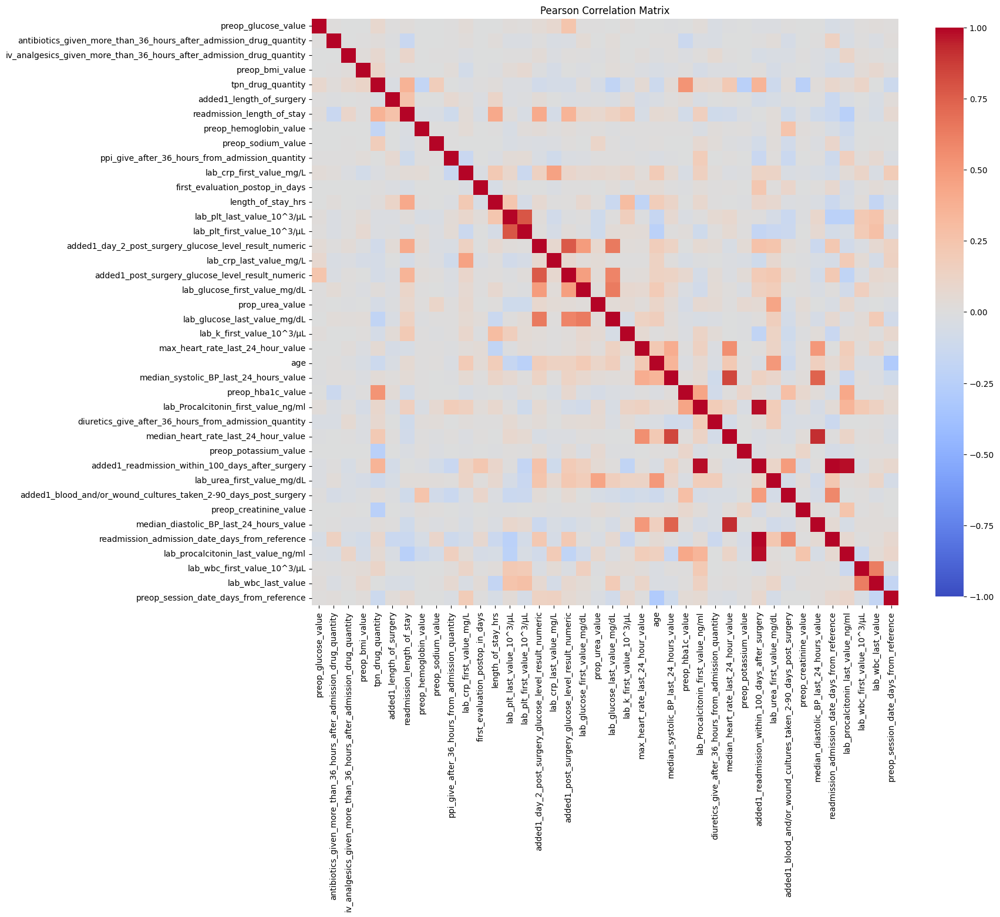

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\064_Spearman_Correlation_Matrix.png


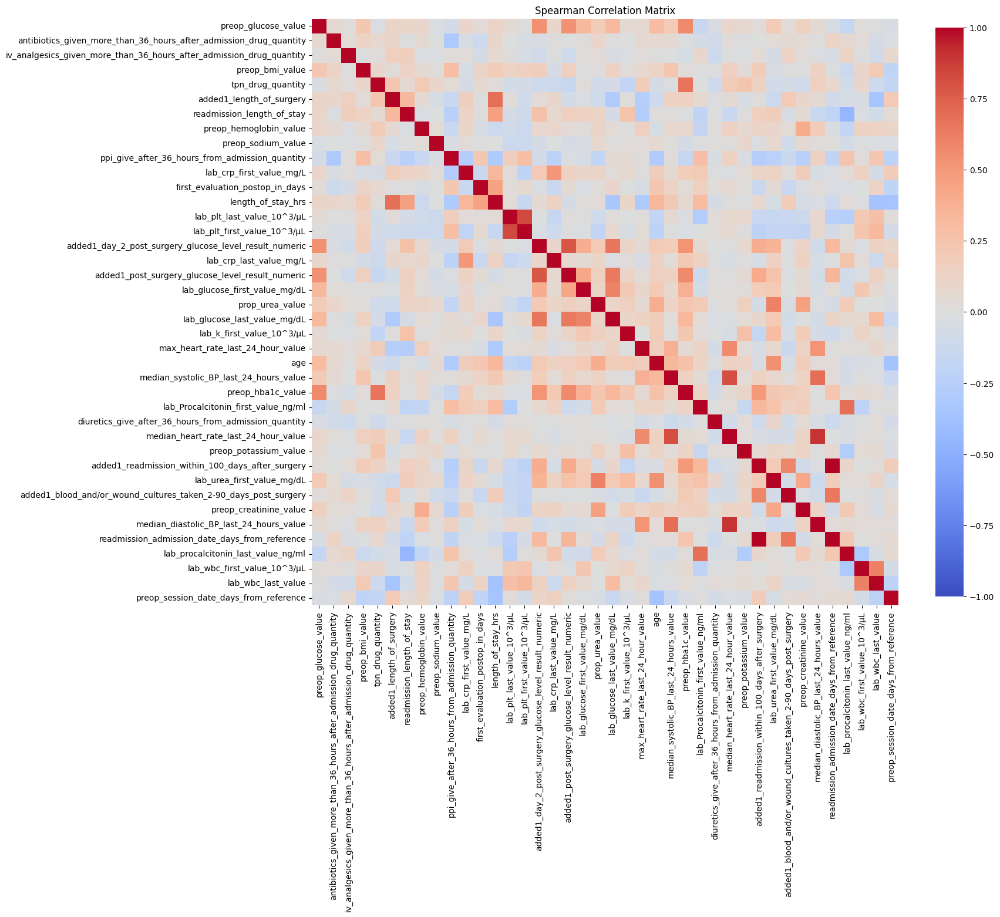

Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\065_Top_Numeric_Correlations_with_Infection_Target.png


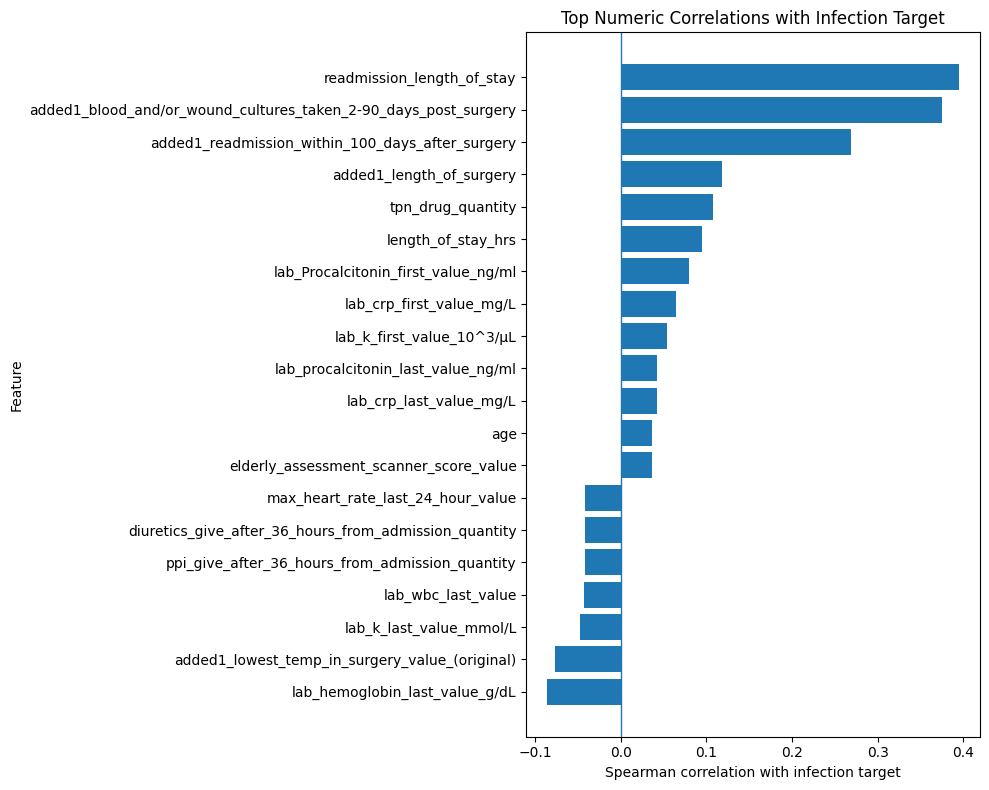

Strong feature-feature correlations:


,feature_1,feature_2,spearman_correlation,absolute_correlation
739,added1_readmission_within_100_days_after_surgery,readmission_admission_date_days_from_reference,0.999157,0.999157
719,median_heart_rate_last_24_hour_value,median_diastolic_BP_last_24_hours_value,0.901268,0.901268
429,lab_plt_last_value_10^3/µL,lab_plt_first_value_10^3/µL,0.834323,0.834323
663,median_systolic_BP_last_24_hours_value,median_heart_rate_last_24_hour_value,0.813516,0.813516


Numeric correlations with target:


,column,n,spearman_r,p_value,point_biserial_r,point_biserial_p_value,fdr_bh_p_value,significant_fdr_0.05,absolute_spearman
2,readmission_length_of_stay,548,0.395536,5.757192e-22,0.344159,1.105883e-16,9.595320e-21,True,0.395536
3,added1_blood_and/or_wound_cultures_taken_2-90_...,505,0.375717,2.236200e-18,0.320943,1.459082e-13,2.795250e-17,True,0.375717
12,added1_readmission_within_100_days_after_surgery,186,0.268503,2.109923e-04,0.170182,2.021748e-02,8.115088e-04,True,0.268503
1,added1_length_of_surgery,7140,0.118122,1.316568e-23,0.018858,1.110930e-01,3.291419e-22,True,0.118122
35,tpn_drug_quantity,99,0.107669,2.887935e-01,0.121604,2.305162e-01,3.930980e-01,False,0.107669
0,length_of_stay_hrs,35861,0.094310,1.204624e-71,0.177329,3.854347e-251,6.023121e-70,True,0.094310
4,lab_hemoglobin_last_value_g/dL,9683,-0.086151,2.028129e-17,-0.084967,5.521439e-17,2.028129e-16,True,0.086151
36,lab_Procalcitonin_first_value_ng/ml,178,0.079377,2.922359e-01,-0.023360,7.569384e-01,3.930980e-01,False,0.079377
7,added1_lowest_temp_in_surgery_value_(original),7104,-0.076967,8.264679e-11,-0.076044,1.385081e-10,5.165425e-10,True,0.076967
13,lab_crp_first_value_mg/L,3293,0.063964,2.397677e-04,0.079225,5.321141e-06,8.563134e-04,True,0.063964


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\066_Categorical_association_matrix_(Cramer's_V).png


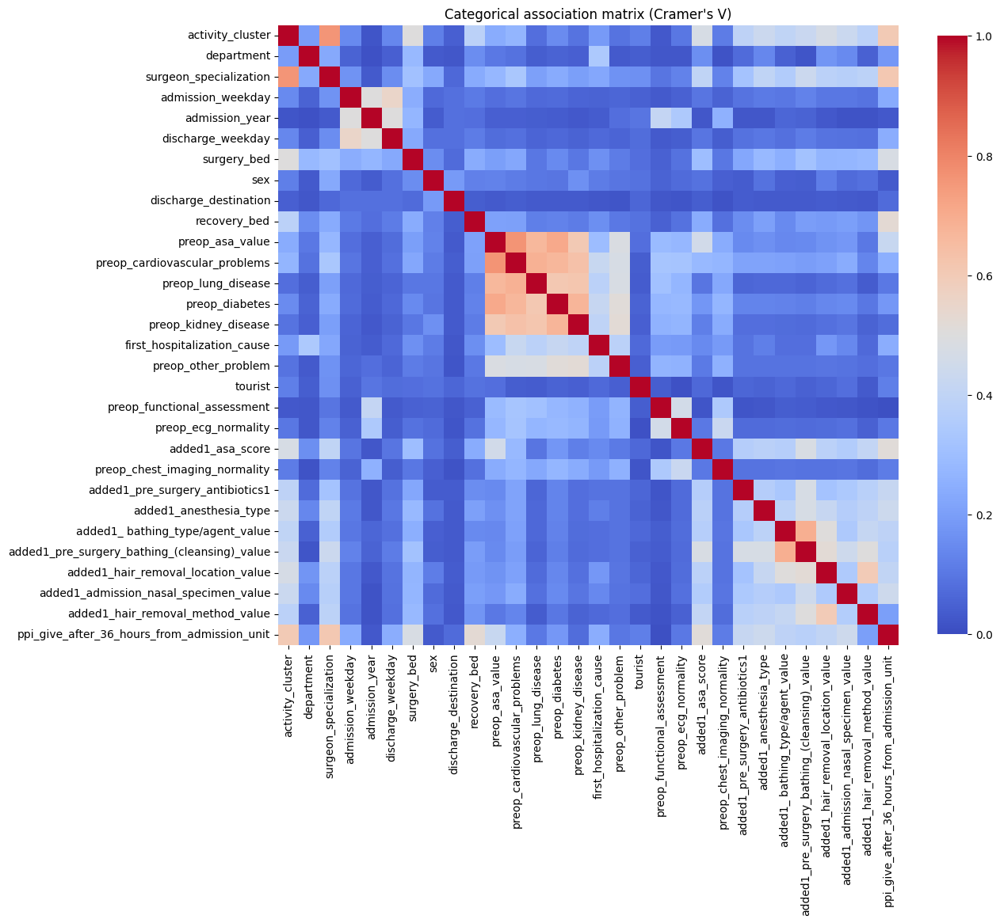

Strong feature-feature categorical associations:


,feature_1,feature_2,cramers_v


Saved EDA visualization: H:\27 project\EDA\EDA_visualizations\067_EDA_visualization.png


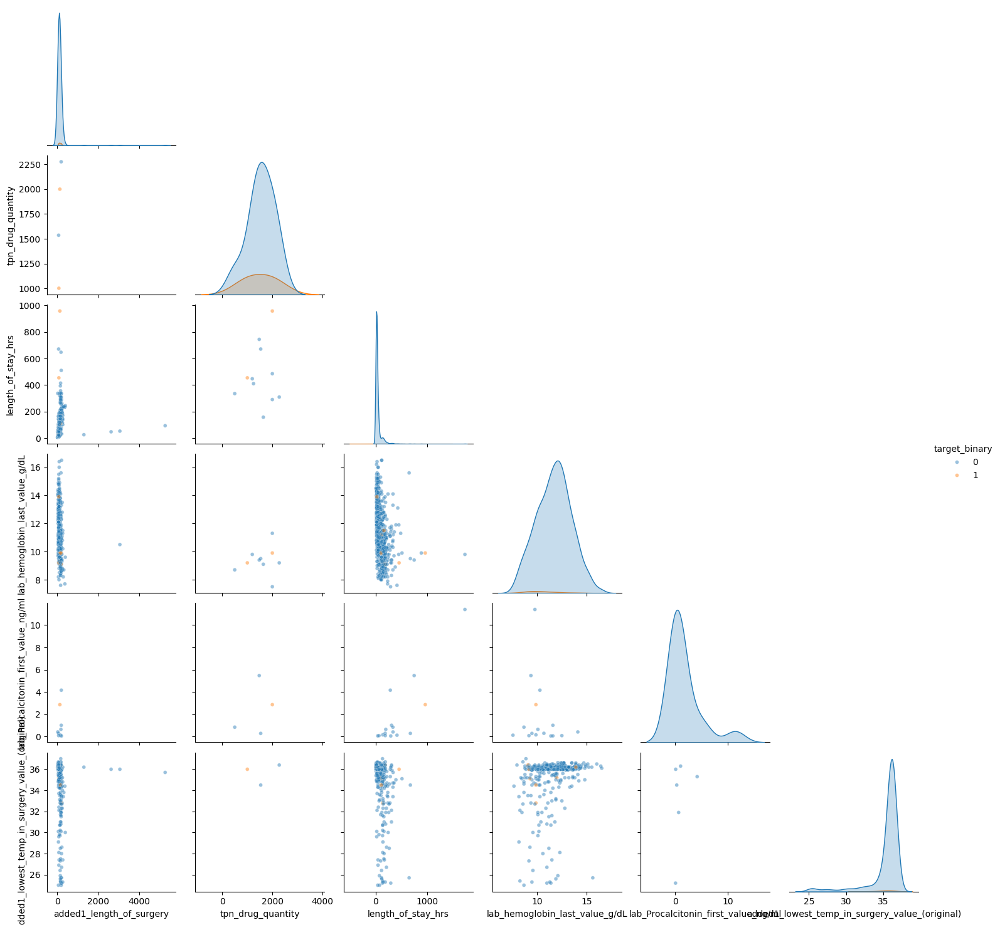

,column,semantic_type,missing_percent,unique_values,zero_variance,potential_leakage
178,urine_culture_6_organism_detected,Boolean,99.994433,1,True,True
175,urine_culture_5_organism_detected,Boolean,99.986082,1,True,True
172,urine_culture_4_organism_detected,Boolean,99.974948,1,True,True
169,urine_culture_3_organism_detected,Categorical,99.958246,1,True,True
166,urine_culture_2_organism_detected,Boolean,99.888657,1,True,True
...,...,...,...,...,...,...
134,blood_culture_2_test_date,Datetime,99.418232,208,False,False
135,blood_culture_2_test_panel,Boolean,99.418232,2,False,False
137,blood_culture_2_result.1,Categorical,99.418232,7,False,False
138,blood_culture_3_test_date,Datetime,99.418232,208,False,False


MULTIVARIATE SUMMARY - input for cleaning/feature selection

Near-duplicate numeric pairs: 4


,feature_1,feature_2,spearman_correlation,absolute_correlation
739,added1_readmission_within_100_days_after_surgery,readmission_admission_date_days_from_reference,0.999157,0.999157
719,median_heart_rate_last_24_hour_value,median_diastolic_BP_last_24_hours_value,0.901268,0.901268
429,lab_plt_last_value_10^3/µL,lab_plt_first_value_10^3/µL,0.834323,0.834323
663,median_systolic_BP_last_24_hours_value,median_heart_rate_last_24_hour_value,0.813516,0.813516



Near-duplicate categorical_pairs: 0

Zero variance columns: 19
['urine_culture_6_organism_detected', 'urine_culture_5_organism_detected', 'urine_culture_4_organism_detected', 'urine_culture_3_organism_detected', 'urine_culture_2_organism_detected', 'blood_culture_5_organism_detected', 'blood_culture_6_organism_detected', 'blood_culture_4_organism_detected', 'blood_culture_1_organism_detected', 'blood_culture_2_organism_detected', 'blood_culture_3_organism_detected', 'ppi_give_after_36_hours_from_admission_unit', 'tpn_dose_form', 'tpn_route', 'tpn_unit', 'revision_diagnoses_during_hosp', 'urine_culture_1_organism detected', 'added1_drain_left_in_place_clean_from_surgery', 'iv_analgesics_given_more_than_36_hours_after_admission_drug_route']

Columns flagged as potential leakage: 50

Strong target association but not flagged as leakage: 5


,column,association_strength
4,added1_detected_pathogen_specimen_source,0.403263
9,added1_wound_assessment_str_value,0.361950
14,added1_asa_score,0.163634
13,tpn_drug_name,0.162705
15,blood_culture_4_result,0.151970


In [ ]:
(pearson_corr, spearman_corr, high_corr_pairs,target_corr_df,) = correlation_analysis(
    df,
    numeric_cols=existing_numeric_cols,
    target_col=TARGET_COL,
    min_non_missing=50,
    max_columns=40,
    strong_threshold=0.80,
)

existing_categorical_like_cols = existing_categorical_cols + existing_boolean_cols

cramers_matrix, strong_categorical_pairs = categorical_correlation_analysis(
    df, categorical_cols = existing_categorical_like_cols, min_non_missing=50, max_columns=30, strong_threshold=0.80,)


# Review possible leakage and general feature quality.
leakage_keywords = [
    "discharge",
    "readmission",
    "infection_diagnosis",
    "ssi_diagnosis",
    "culture_result",
    "organism_detected",
    "wound_culture",
    "after_36_hours",
    "within_100_days",
]

# Pairplot only for a small clinically selected set.
clinical_pairplot_candidates = select_pairplot_candidates(target_corr_df, leakage_keywords, max_variables=6)

plot_clinical_pairplot(df, candidate_cols=clinical_pairplot_candidates, target_col=TARGET_COL,)

feature_review_df = build_feature_review_table(
    df,
    column_groups=column_groups,
    target_cols={TARGET_COL, *INFECTION_COLS},
    leakage_keywords=leakage_keywords,
)

summarize_multivariate_findings(
    strong_pairs=high_corr_pairs,
    strong_categorical_pairs=strong_categorical_pairs,
    feature_review_df=feature_review_df,
    target_corr=target_corr_df,
    categorical_tests_df=categorical_tests_df,
    boolean_tests_df=boolean_tests_df,
    high_association_threshold=0.15,
)

# Save Multivariate outputs.
multivariate_outputs = {
    "pearson_correlation_matrix": pearson_corr,
    "spearman_correlation_matrix": spearman_corr,
    "high_spearman_correlation_pairs": high_corr_pairs,
    "numeric_target_correlations": target_corr_df,
    "feature_review": feature_review_df,
    "categorical_association_matrix": cramers_matrix,
    "strong_categorical_pairs": strong_categorical_pairs,
}

for name, table in multivariate_outputs.items():
    if isinstance(table, pd.DataFrame):
        table.to_csv(OUTPUT_DIR / f"{name}.csv", index=True)
